In [1]:
%load_ext autotime
%load_ext autoreload
%autoreload 2

time: 14.3 ms


In [2]:
import gym

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import json
import typing
import numpy as np
import scipy as sp
import scipy.stats as st
import scipy.integrate as integrate
from scipy.stats import multivariate_normal
from sklearn import linear_model
from sklearn.utils.testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning
import statsmodels.api as sm
from matplotlib.colors import LogNorm

from tqdm.auto import tqdm
from collections import defaultdict, Counter
from IPython.display import clear_output

sns.set_style("whitegrid")
sns.set_palette("colorblind")
palette = sns.color_palette()
figsize = (15,8)
legend_fontsize = 16

from matplotlib import rc
rc('figure', **{'dpi': 300})

%matplotlib inline

/Users/ruaihm4/code/made/env_ml_made/lib/python3.8/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)


time: 2.32 s


In [3]:
from env import TicTacToe, plot_test_game

time: 647 ms


# Реализация основных классов и функций

In [4]:
def plot_by_epochs(
    epochs: typing.List[int], values_dict: typing.Dict[str, typing.List[float]], 
    title: str = "Values", ylabel: str = "value",
) -> plt.Figure:
    
    figure = plt.figure(figsize=(10, 6))
    ax = figure.add_subplot(1, 1, 1)
    
    for name, values in values_dict.items():
        ax.plot(epochs, values, label=name)
    
    ax.set_title(title)
    ax.set_xlabel("epoch")
    ax.set_ylabel(ylabel)
    ax.legend()

    return figure

time: 27.5 ms


In [127]:
class TicTacToeCoordinator:
    
    def __init__(self, env, x_model, o_model):
        self.env = env
        self.x_model = x_model
        self.o_model = o_model
        
        self.n_episode = 0
        self.validate_info = defaultdict(list)
        
    def _reset_states(self):
        self._x_state = None
        self._x_action = None
        self._x_reward = 0
        self._x_next_state = None
        
        self._o_state = None
        self._o_action = None
        self._o_reward = 0
        self._o_next_state = None
        
    def run_episode(self, do_learning=True, greedy=False, render=False):
        self._reset_states()
        self._x_next_state = self.env.reset()
        num_step = 0
        
        while True:
            if render:
                self.env.render()
            
            # ход крестиков
            self._x_state = self._x_next_state
            self._x_reward = 0
            
            self._x_action = self.x_model.get_action(
                self._x_state[0], greedy=greedy, 
                for_train=do_learning,
                empty_spaces=self.env.getEmptySpaces(),
            )
            self._o_next_state, cur_x_reward, done, _ = self.env.step(self._x_action)
            
            # все награды даются относительно крестиков
            self._x_reward += cur_x_reward
            self._o_reward -= cur_x_reward
            
            if done:
                break
            
            if do_learning and num_step != 0:
                self.o_model.update(
                    s=self._o_state[0], 
                    a=self._o_action, 
                    r=self._o_reward, 
                    next_s=self._o_next_state[0],
                    is_done=False,
                )
            
            # ход ноликов
            self._o_state = self._o_next_state
            self._o_reward = 0
            
            self._o_action = self.o_model.get_action(
                self._o_state[0], greedy=greedy, 
                for_train=do_learning,
                empty_spaces=self.env.getEmptySpaces(),
            )
            self._x_next_state, cur_x_reward, done, _ = self.env.step(self._o_action)
            
            if cur_x_reward == -10:
                # все награды даются относительно крестиков, но если нолик захочет поставить в занятую ячейку
                # то все равно вернется -10 (а это уже относится к ноликам)
                # сделаем так, чтобы и эта награда выдавалась относительно крестиков
                cur_x_reward = -cur_x_reward
                
            # все награды даются относительно крестиков
            self._x_reward += cur_x_reward
            self._o_reward -= cur_x_reward

            if done:
                break
            
            if do_learning:
                self.x_model.update(
                    s=self._x_state[0], 
                    a=self._x_action, 
                    r=self._x_reward, 
                    next_s=self._x_next_state[0],
                    is_done=False,
                )
            
            num_step += 1
        
        # update in the end
        if do_learning:
            if self._x_state is not None and self._x_next_state is not None:
                self.x_model.update(
                    s=self._x_state[0], 
                    a=self._x_action, 
                    r=self._x_reward, 
                    next_s=self._x_next_state[0],
                    is_done=True,
                )
            if self._o_state is not None and self._o_next_state is not None:
                self.o_model.update(
                    s=self._o_state[0], 
                    a=self._o_action, 
                    r=self._o_reward, 
                    next_s=self._o_next_state[0],
                    is_done=True,
                )
        
        if do_learning:
            self.n_episode += 1
        
        return num_step, self._x_reward, self._o_reward
        
    def validate(self, n_episodes: int = 10000):
        # play games
        sum_num_step = 0
        sum_x_reward = 0
        sum_o_reward = 0
        
        for i in range(n_episodes):
            num_step, x_reward, o_reward = self.run_episode(
                do_learning=False, greedy=False, render=False,
            )
            sum_num_step += num_step
            sum_x_reward += x_reward
            sum_o_reward += o_reward
            
        self.validate_info['epoch'].append(self.n_episode)
        self.validate_info['num_steps'].append(sum_num_step / n_episodes)
        self.validate_info['x_reward'].append(sum_x_reward / n_episodes)
        self.validate_info['o_reward'].append(sum_o_reward / n_episodes)
        self.validate_info['x_eps'].append(self.x_model.eps)
        self.validate_info['o_eps'].append(self.o_model.eps)
        
        figure = plot_by_epochs(
            epochs=self.validate_info['epoch'], 
            values_dict=dict(num_steps=self.validate_info['num_steps']), 
            title="Num_steps", ylabel="num_steps",
        )
        plt.show()
        del figure
        
        figure = plot_by_epochs(
            epochs=self.validate_info['epoch'], 
            values_dict=dict(
                x_reward=self.validate_info['x_reward'],
                o_reward=self.validate_info['o_reward']
            ), 
            title="Rewards", ylabel="reward",
        )
        plt.show()
        del figure
        
        figure = plot_by_epochs(
            epochs=self.validate_info['epoch'], 
            values_dict=dict(
                x_eps=self.validate_info['x_eps'],
                o_eps=self.validate_info['o_eps']
            ), 
            title="Epsilon", ylabel="eps",
        )
        plt.show()
        del figure

time: 36.5 ms


In [6]:
class QLearningAgent:
    """ Agent, which fit policy by Off-Policy TD control(Q-learning). """
    
    def __init__(
        self, 
        actions_list: typing.List[typing.Tuple[int, int]], alpha: float = 1e-3, gamma: float = 1.0,
        eps_init: float = 0.9, eps_final: float = 0.01, eps_decay: int = 1000,
    ):
        self.Q = defaultdict(lambda: [
            0
            for action in actions_list
        ])
        
        self.alpha = alpha
        self.gamma = gamma
        self._actions_list = actions_list
        
        self.eps_init, self.eps_final, self.eps_decay = eps_init, eps_final, eps_decay
        self.eps = 0
        self.num_step = 0
        
    def get_action(
        self, s, greedy=True, for_train=True, 
        empty_spaces: typing.List[typing.Tuple[int, int]] = None,
    ) -> typing.Tuple[int, int]:
        if for_train:
            self.num_step += 1
        
        if greedy:
            return self._actions_list[np.argmax(self.Q[s])]
        else:
            self.eps = self.eps_final + (self.eps_init - self.eps_final) * np.exp(-1. * self.num_step / self.eps_decay)
            if np.random.rand() <= self.eps:
                if empty_spaces is not None:
                    i = np.random.choice(len(empty_spaces))
                    return empty_spaces[i]
                else:
                    i = np.random.choice(len(self._actions_list))
                    return self._actions_list[i]
            else:
                return self._actions_list[np.argmax(self.Q[s])] 
    
    def update(self, s, a, r, next_s, is_done):
        i = self._actions_list.index(tuple(a))
        self.Q[s][i] += self.alpha * (r + self.gamma * np.max(self.Q[next_s]) - self.Q[s][i])

time: 32 ms


# Часть первая: крестики-нолики при помощи Q-обучения
В коде, прилагающемся к последней лекции про обучение с подкреплением, реализован Environment для крестиков-ноликов, в котором можно при инициализации указывать разные размеры доски и условия победы, а также функции для рисования, в том числе с указанием оценки различных действий. С этим окружением все задания и связаны.

## Задание 1
Реализуйте обычное (табличное) Q-обучение. Обучите стратегии крестиков и ноликов для доски 3х3.

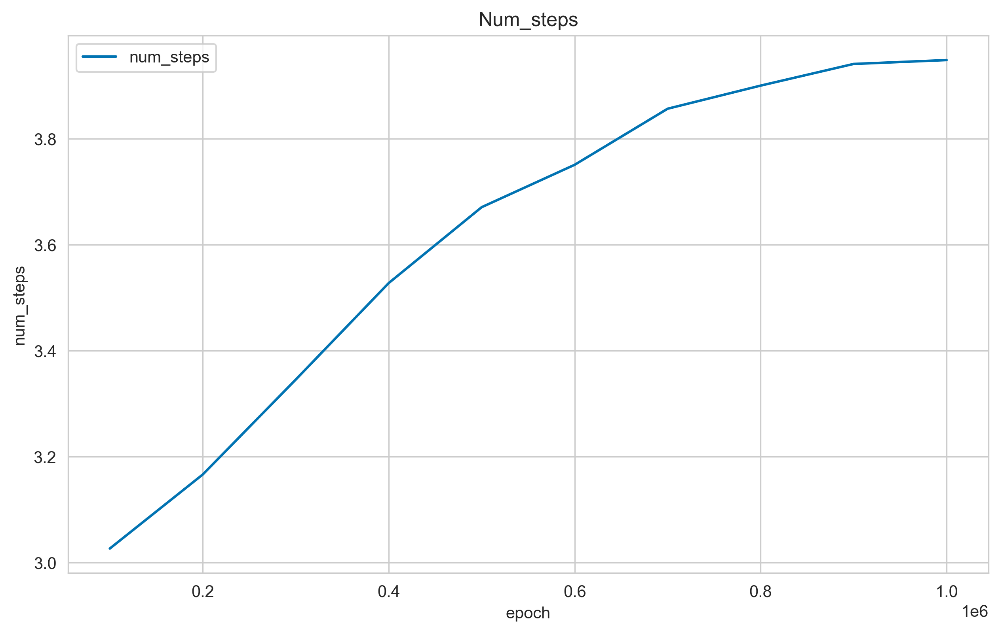

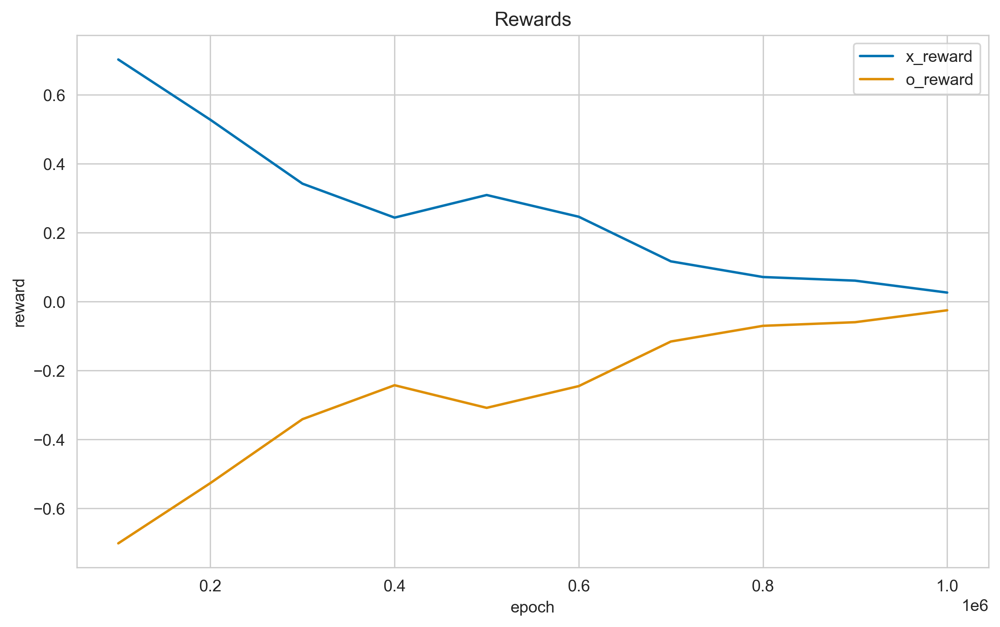

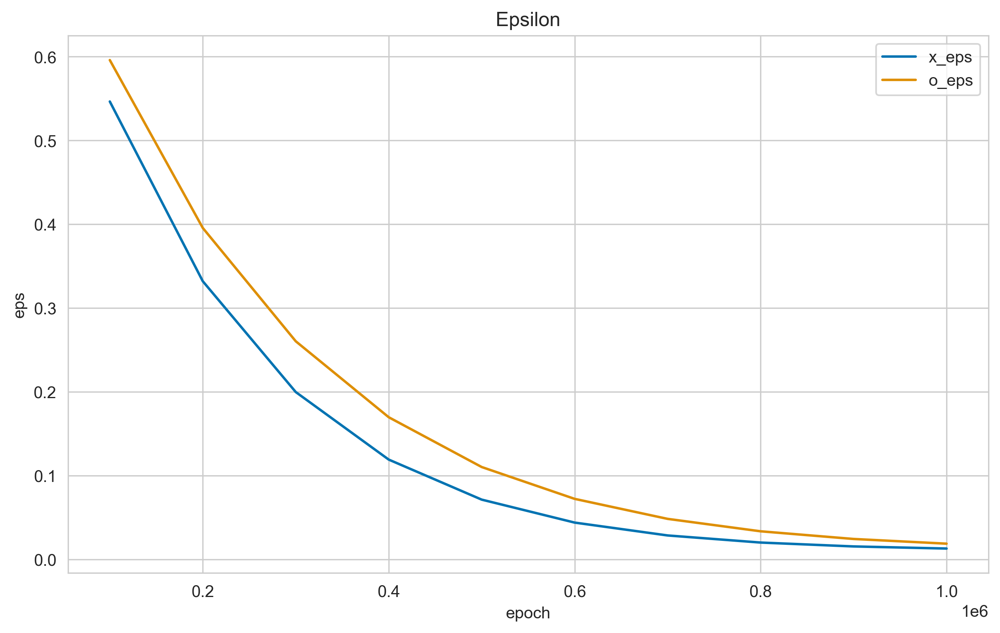


time: 15min 16s


In [7]:
n_rows = 3
n_cols = 3
n_win = 3

n_episodes = int(1e6)
val_freq = int(1e5)
n_val_episodes = int(1e4)

actions_list = [(i, j) for i in range(n_rows) for j in range(n_cols)]
alpha = 1e-3
gamma = 0.6

eps_init = 0.9
eps_final = 0.01
eps_decay = 8e5

env = TicTacToe(n_rows=n_rows, n_cols=n_cols, n_win=n_win)
x_model = QLearningAgent(
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
)
o_model = QLearningAgent(
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
)
coordinator = TicTacToeCoordinator(env=env, x_model=x_model, o_model=o_model)

for e in tqdm(range(n_episodes)):
    coordinator.run_episode(do_learning=True, greedy=False, render=False)
    
    if (e + 1) % val_freq == 0:
        clear_output(wait=True)
        coordinator.validate(n_episodes=n_val_episodes)

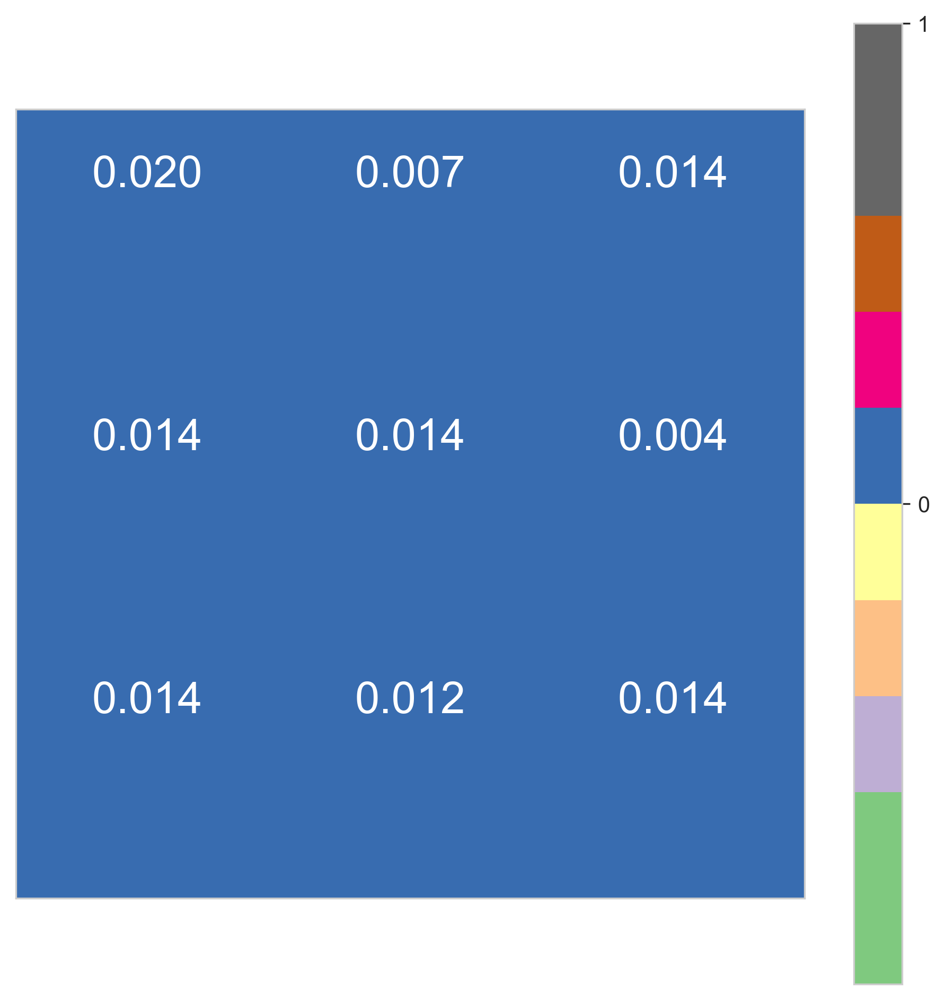

0 (0, 0) 0.020452514914922417
1 (0, 1) 0.0073086453700956
2 (0, 2) 0.014401856368463983
3 (1, 0) 0.014258593874310754
4 (1, 1) 0.014280482564101285
5 (1, 2) 0.00435150420147172
6 (2, 0) 0.014320714160975077
7 (2, 1) 0.012450183040067671
8 (2, 2) 0.014300120775266587


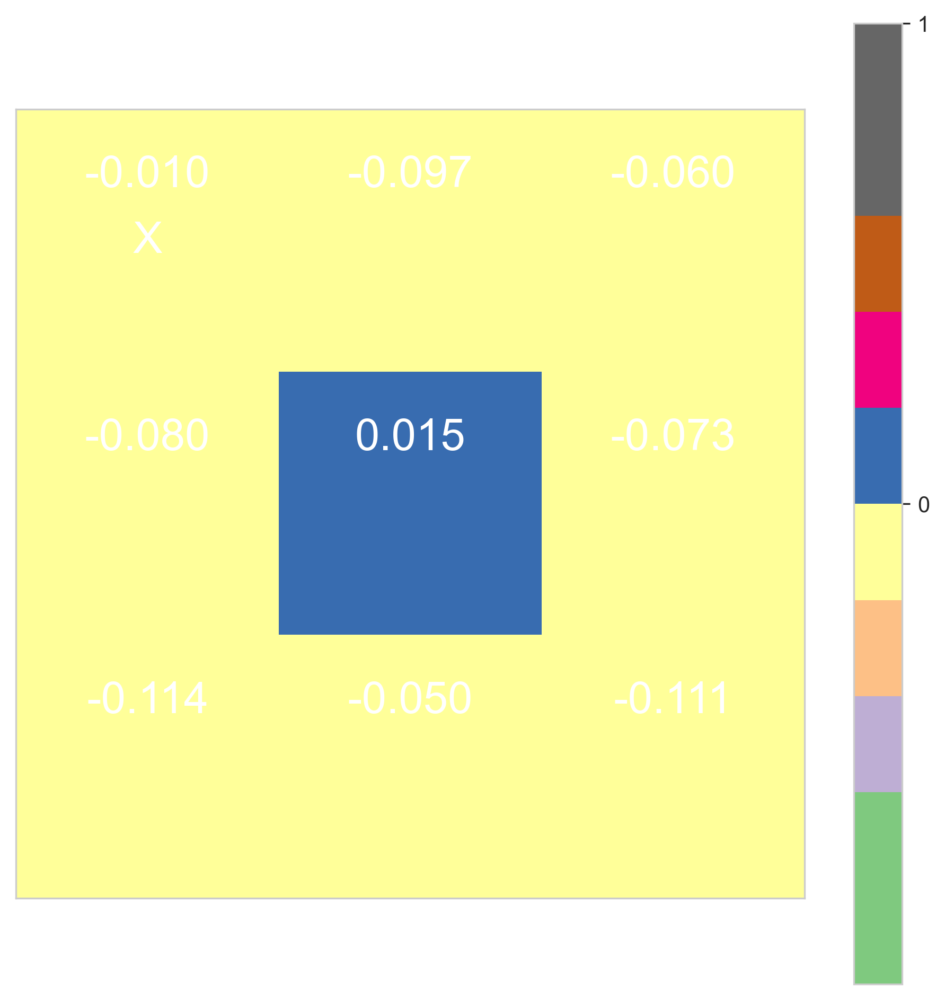

0 (0, 0) -0.01
1 (0, 1) -0.09715911906774656
2 (0, 2) -0.06049344422587581
3 (1, 0) -0.08034840216870101
4 (1, 1) 0.01463027450510366
5 (1, 2) -0.07319299456518376
6 (2, 0) -0.11444065076564722
7 (2, 1) -0.050486574968353105
8 (2, 2) -0.11104908720009772


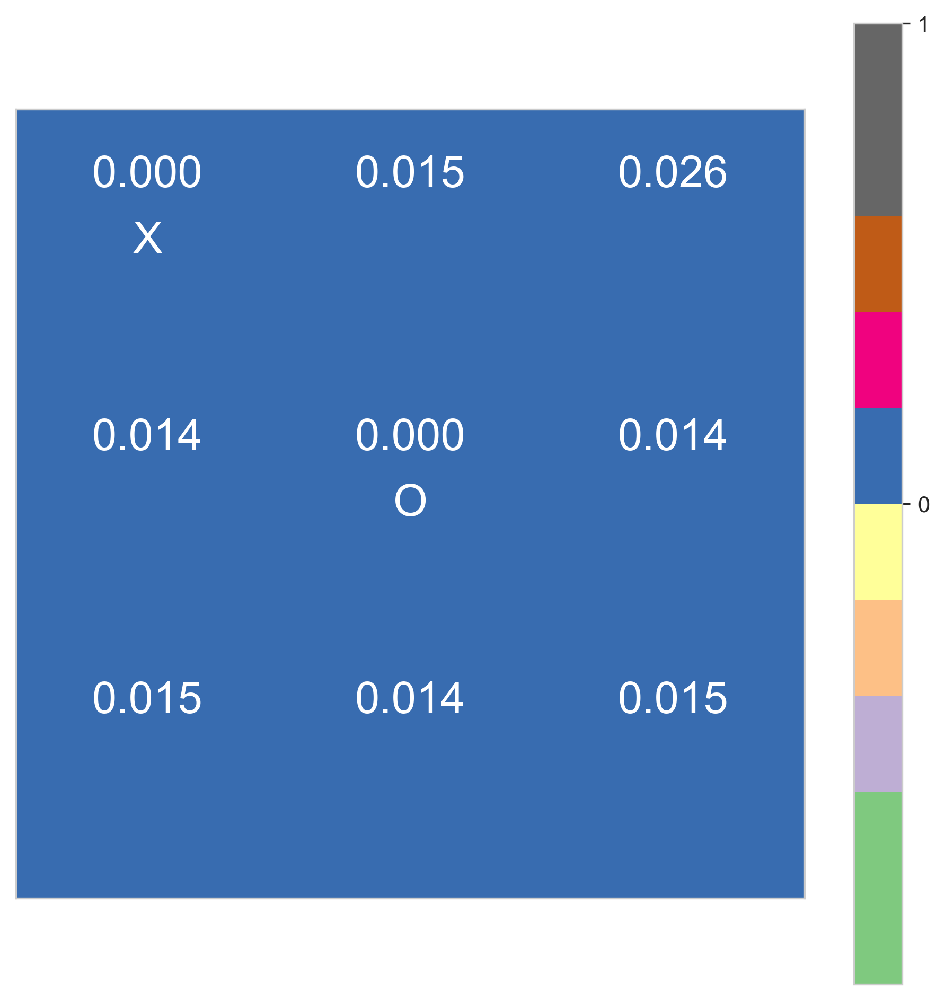

0 (0, 0) 0
1 (0, 1) 0.01460708949256513
2 (0, 2) 0.025708771699455405
3 (1, 0) 0.014285503443295038
4 (1, 1) 0
5 (1, 2) 0.014481607225786708
6 (2, 0) 0.01478237717551342
7 (2, 1) 0.014321800674234277
8 (2, 2) 0.014933113737282745


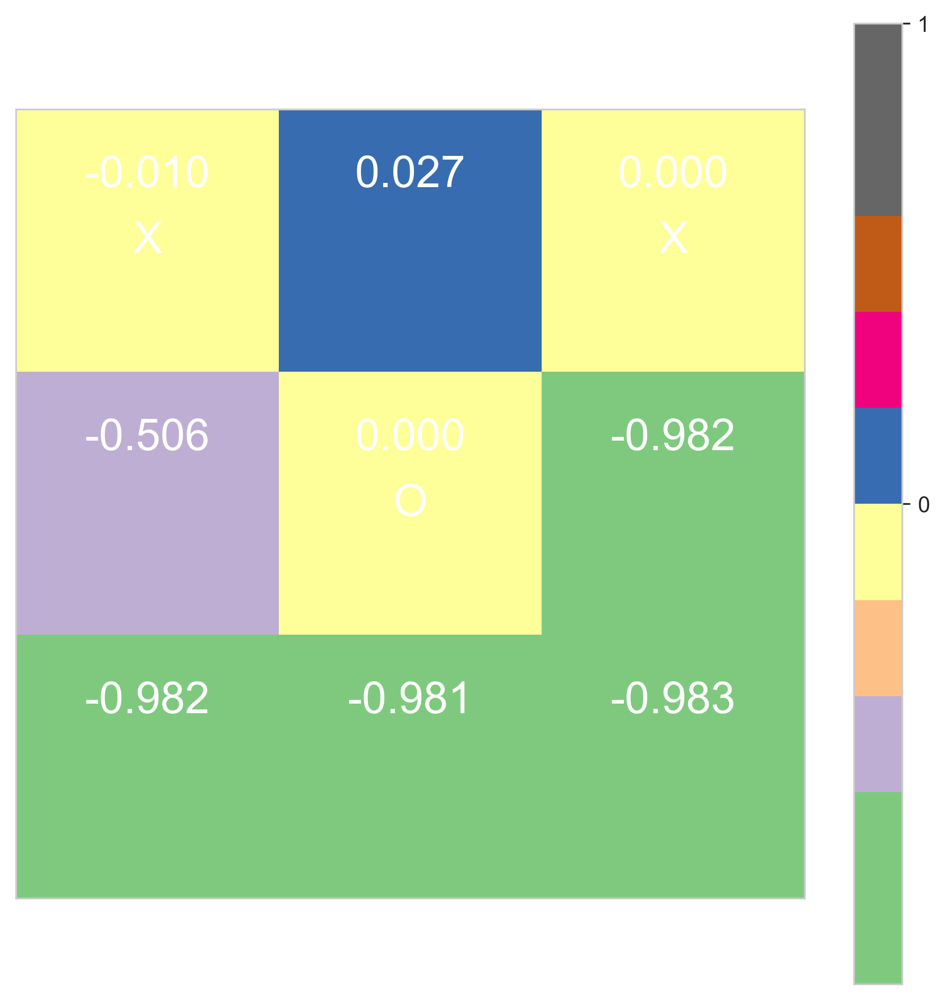

0 (0, 0) -0.01
1 (0, 1) 0.02747064208746915
2 (0, 2) 0
3 (1, 0) -0.5055031607652121
4 (1, 1) 0
5 (1, 2) -0.9823275127064631
6 (2, 0) -0.9824905756508411
7 (2, 1) -0.9807687315713578
8 (2, 2) -0.9828632419753125


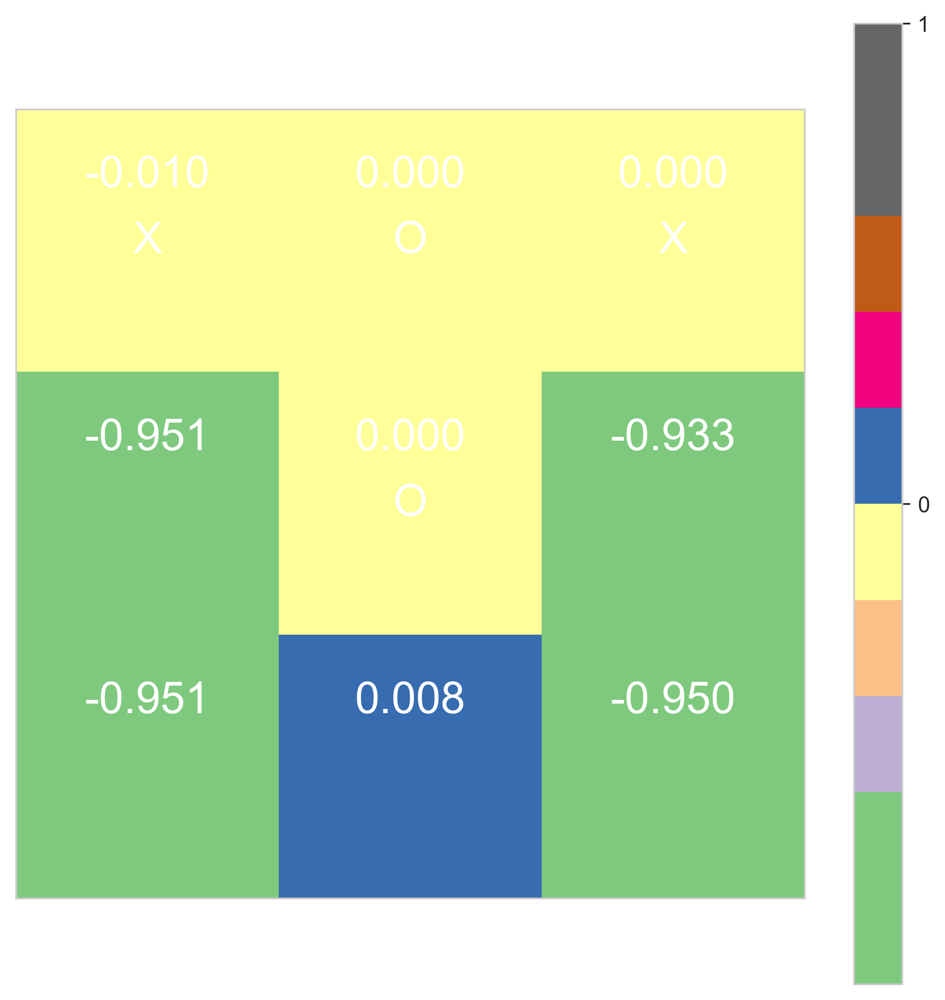

0 (0, 0) -0.01
1 (0, 1) 0
2 (0, 2) 0
3 (1, 0) -0.950578516172765
4 (1, 1) 0
5 (1, 2) -0.9333955282570313
6 (2, 0) -0.9507263357944641
7 (2, 1) 0.008367002170147388
8 (2, 2) -0.9501583149680105


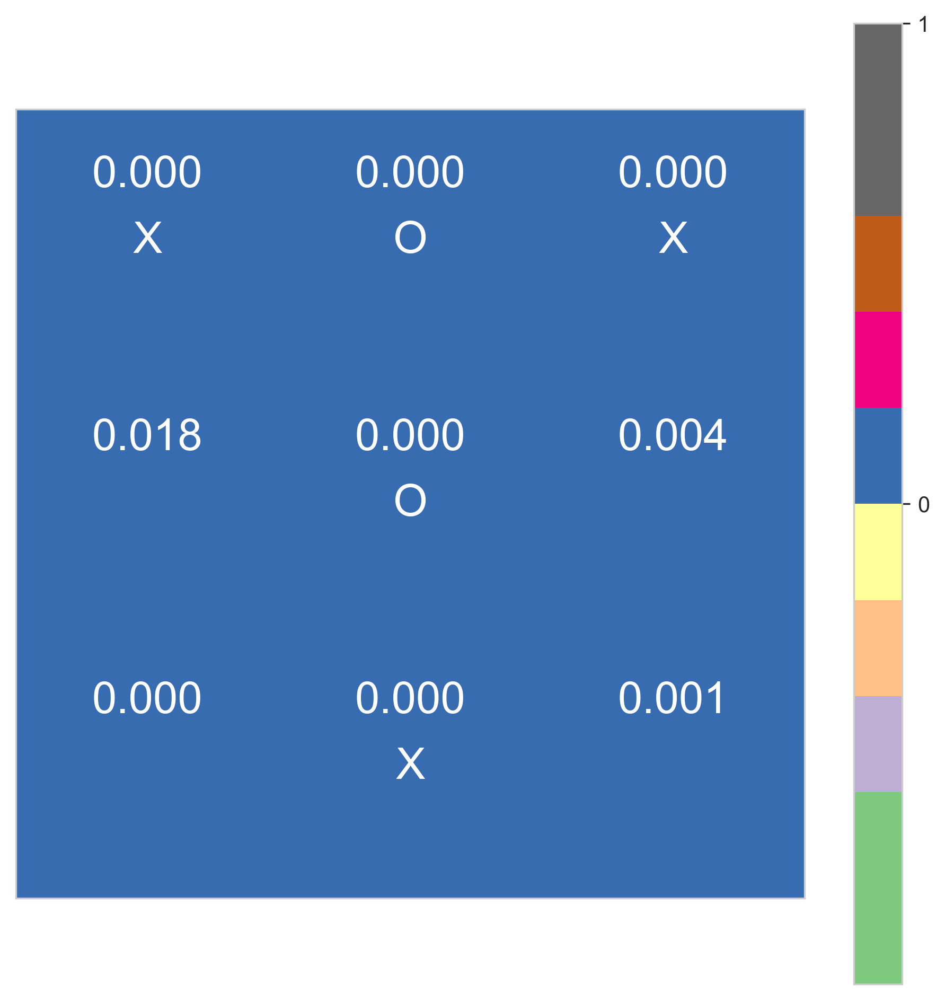

0 (0, 0) 0
1 (0, 1) 0
2 (0, 2) 0
3 (1, 0) 0.018485859056279384
4 (1, 1) 0
5 (1, 2) 0.00371649539844709
6 (2, 0) 8.90026550802019e-05
7 (2, 1) 0
8 (2, 2) 0.0012199491555517472


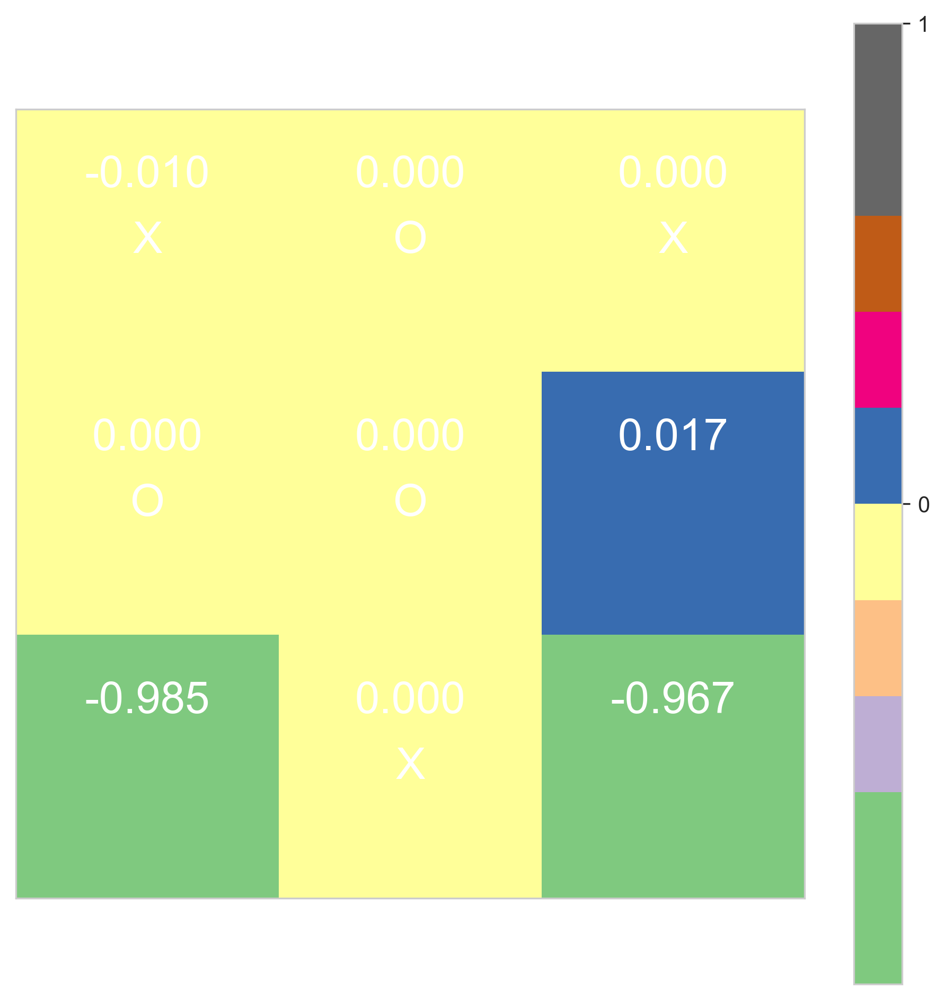

0 (0, 0) -0.01
1 (0, 1) 0
2 (0, 2) 0
3 (1, 0) 0
4 (1, 1) 0
5 (1, 2) 0.016699231168396785
6 (2, 0) -0.9847496921753393
7 (2, 1) 0
8 (2, 2) -0.9666179609311576


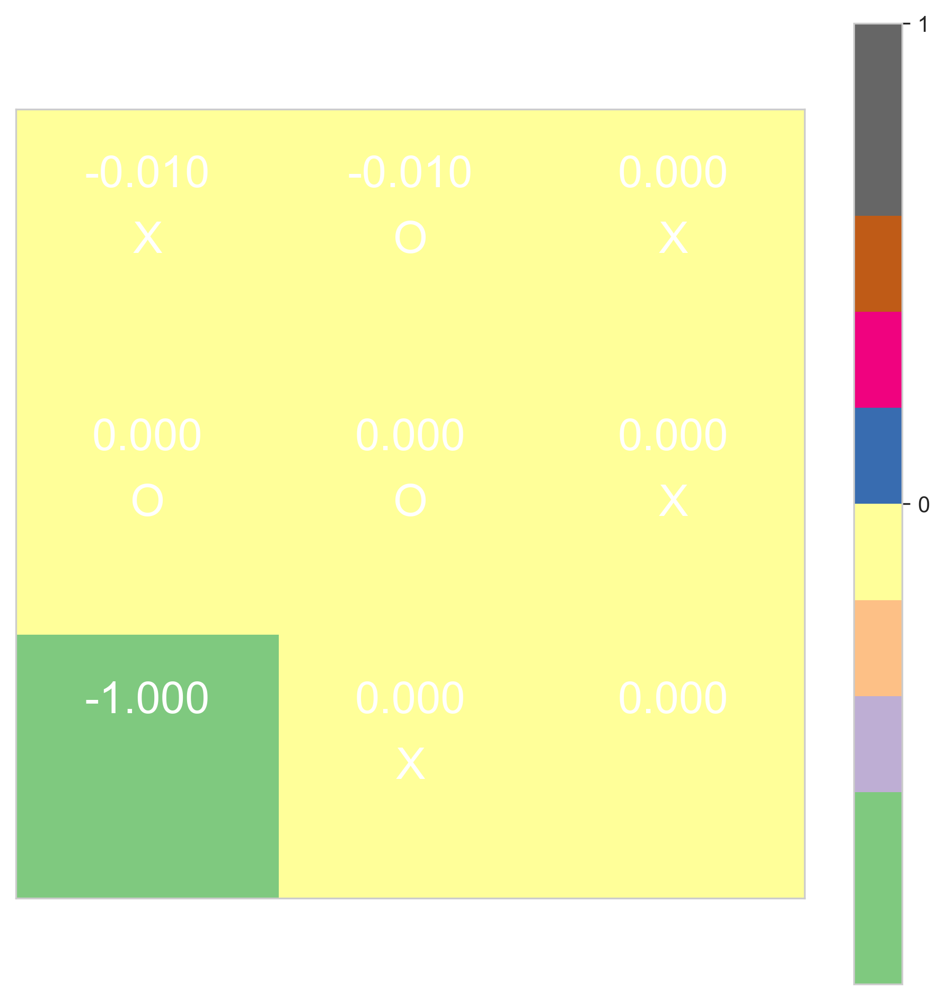

0 (0, 0) -0.01
1 (0, 1) -0.01
2 (0, 2) 0
3 (1, 0) 0
4 (1, 1) 0
5 (1, 2) 0
6 (2, 0) -0.9999999976805657
7 (2, 1) 0
8 (2, 2) 2.4843587712716147e-209


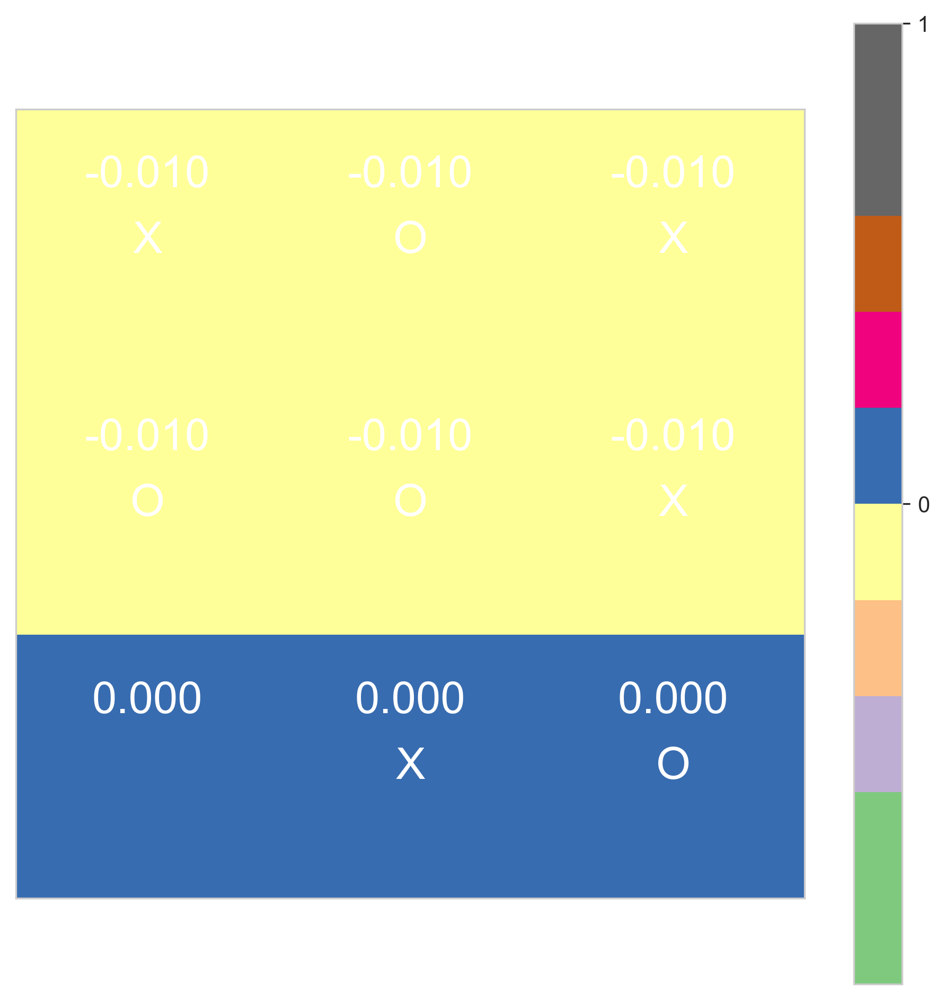

0 (0, 0) -0.01
1 (0, 1) -0.01
2 (0, 2) -0.01
3 (1, 0) -0.01
4 (1, 1) -0.01
5 (1, 2) -0.01
6 (2, 0) 0.0
7 (2, 1) 0
8 (2, 2) 0
time: 6.26 s


In [8]:
plot_test_game(env, x_model, o_model, random_crosses=False, random_naughts=False, verbose=True, fontx=20)

**Вывод:**

Сошлись к ничейной стратегии. В 3х3 видимо это можно считать "успехом".

## Задание 2
Попробуйте обучить стратегии крестиков и ноликов для доски 4х4 и/или 5х5.

**Disclaimer:** начиная с пункта 2, задания для досок размера больше 4х4 могут потребовать большого терпения или более сложных вычислительных реализаций (например, параллелизации). Не хочу в этом задании непременно требовать ни того ни другого, так что если не будет получаться доучить до победных стратегий, не страшно -- но покажите, что со временем что-то всё-таки улучшается.

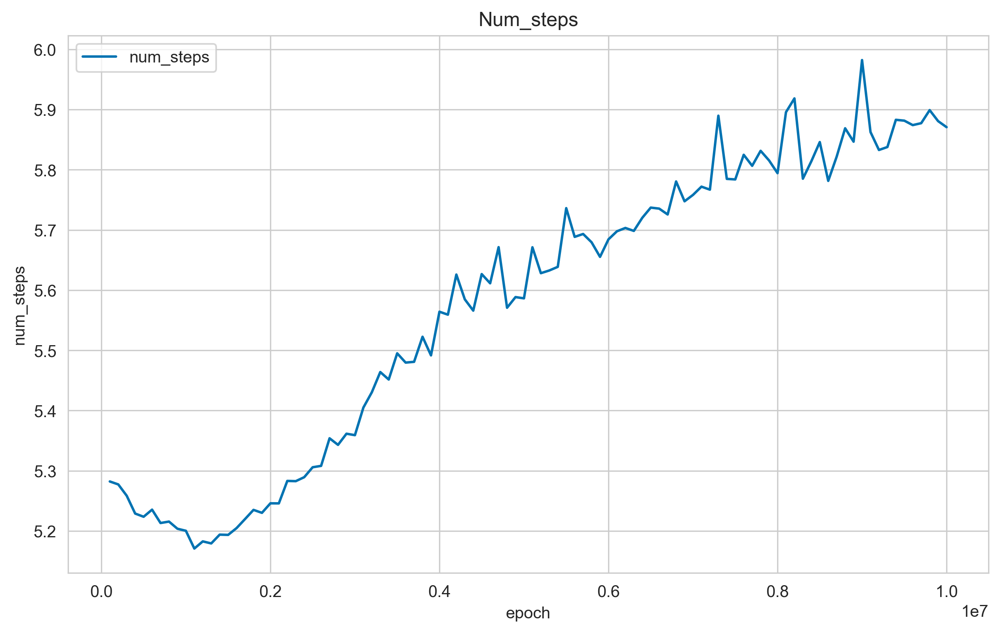

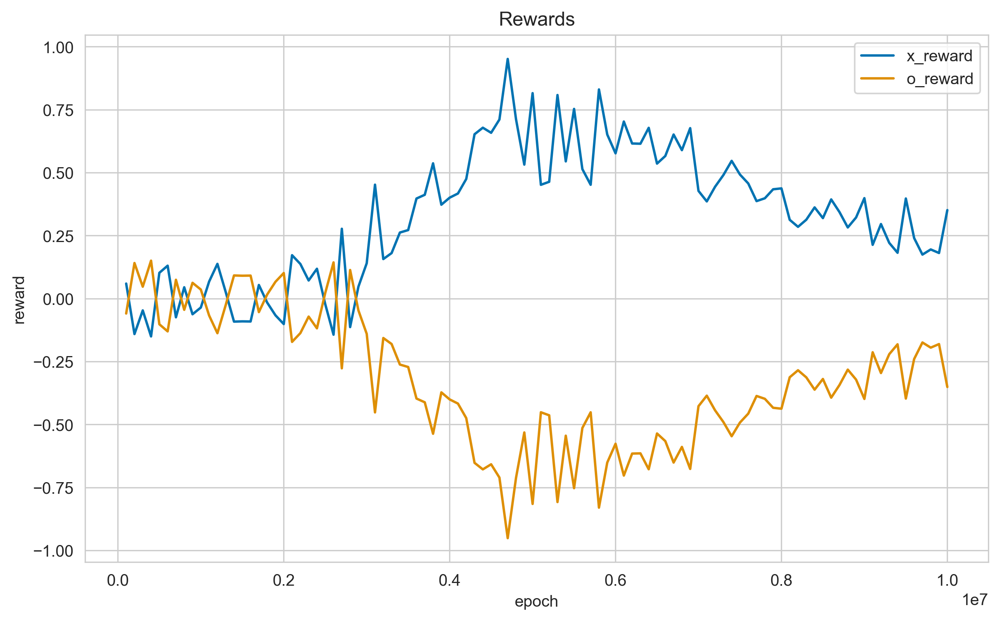

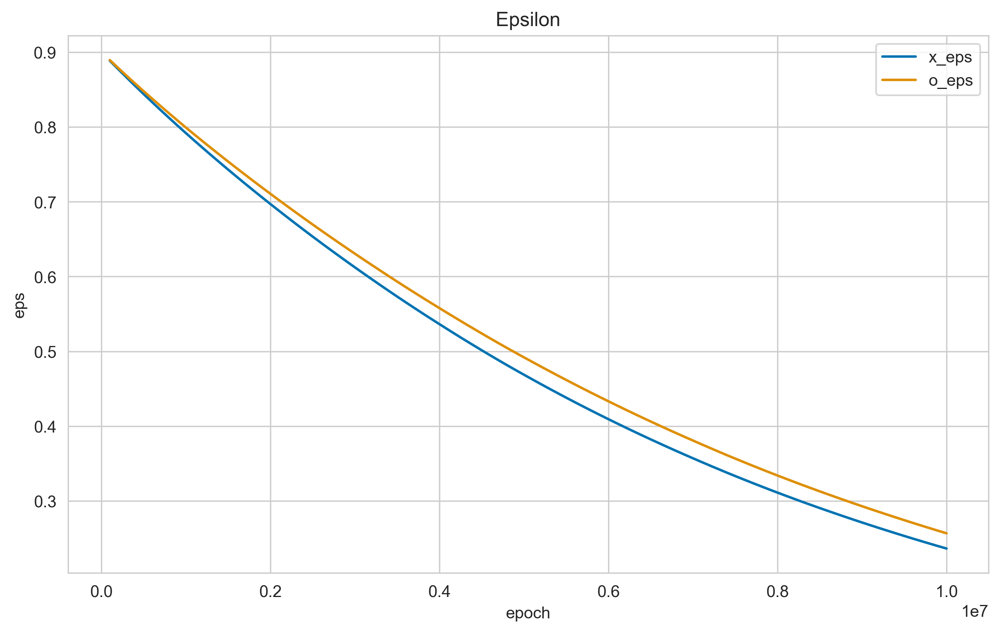


time: 4h 29min 40s


In [18]:
n_rows = 4
n_cols = 4
n_win = 4

n_episodes = int(1e7)
val_freq = int(1e5)
n_val_episodes = int(1e4)

actions_list = [(i, j) for i in range(n_rows) for j in range(n_cols)]
alpha = 1e-2
gamma = 0.7

eps_init = 0.9
eps_final = 0.01
eps_decay = 8e6 * 6 # 6 == mean n_steps

env = TicTacToe(n_rows=n_rows, n_cols=n_cols, n_win=n_win)
x_model = QLearningAgent(
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
)
o_model = QLearningAgent(
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
)
coordinator = TicTacToeCoordinator(env=env, x_model=x_model, o_model=o_model)

for e in tqdm(range(n_episodes)):
    coordinator.run_episode(do_learning=True, greedy=False, render=False)
    
    if (e + 1) % val_freq == 0:
        clear_output(wait=True)
        coordinator.validate(n_episodes=n_val_episodes)

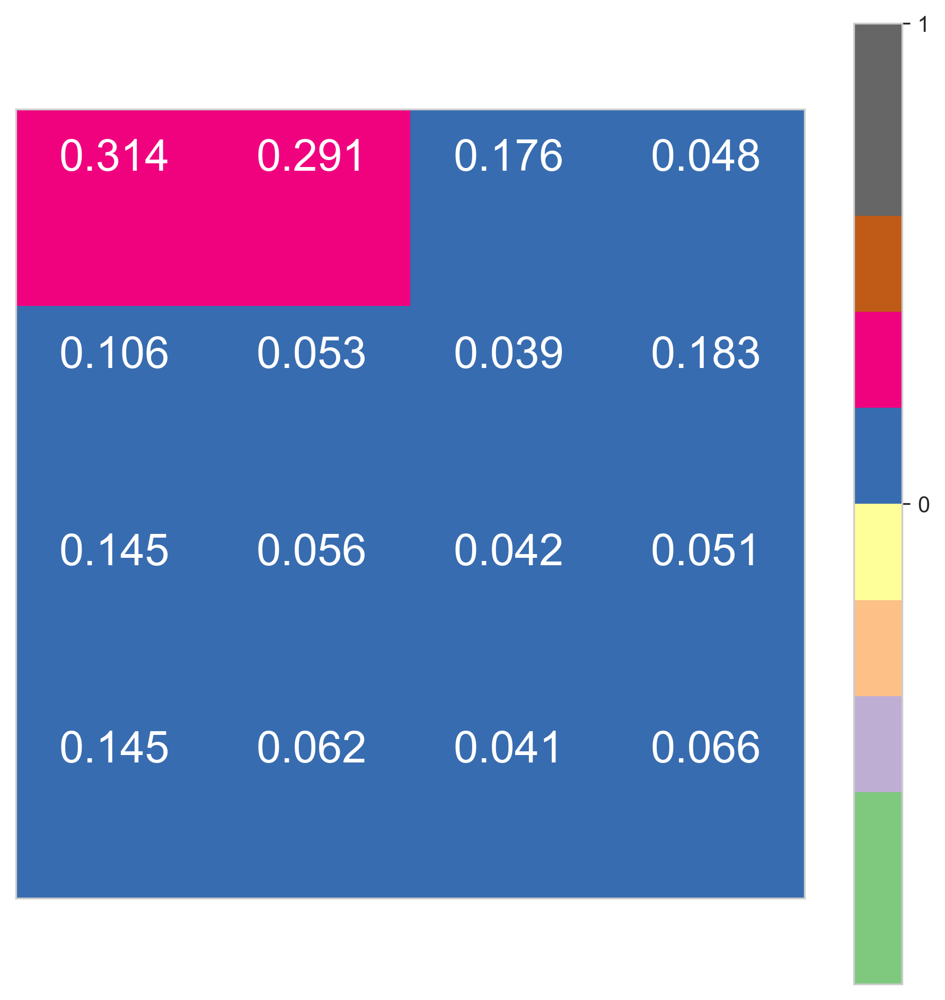

0 (0, 0) 0.314179957488548
1 (0, 1) 0.29088679300868303
2 (0, 2) 0.17636137830331136
3 (0, 3) 0.04776932128720584
4 (1, 0) 0.10570459818023922
5 (1, 1) 0.05280013723444579
6 (1, 2) 0.039072558989090865
7 (1, 3) 0.18275919666767926
8 (2, 0) 0.14473513888434453
9 (2, 1) 0.05555669881211648
10 (2, 2) 0.0423091550478757
11 (2, 3) 0.050616910641637945
12 (3, 0) 0.14548422794926272
13 (3, 1) 0.062366095203474504
14 (3, 2) 0.04139751134891602
15 (3, 3) 0.06638422730076758


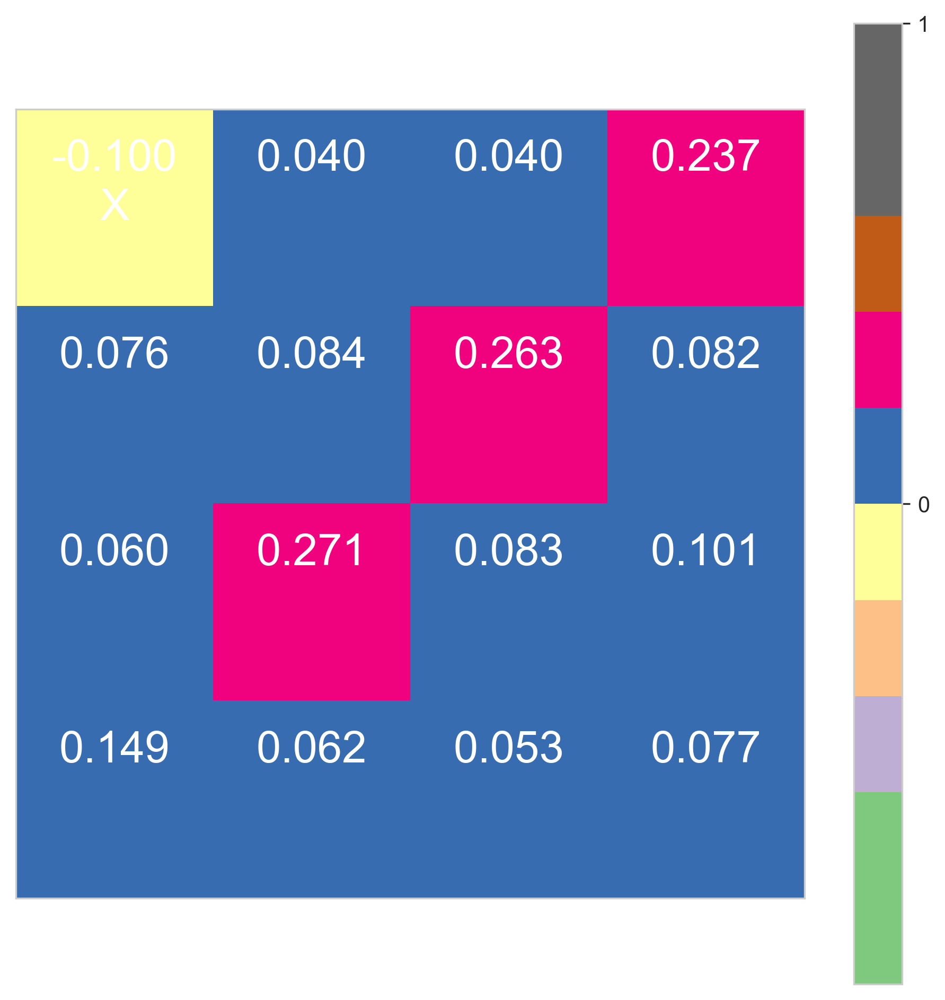

0 (0, 0) -0.1
1 (0, 1) 0.03968236390352491
2 (0, 2) 0.039697171182098985
3 (0, 3) 0.23681857925647107
4 (1, 0) 0.07587062454641368
5 (1, 1) 0.08426881064295763
6 (1, 2) 0.2625926309206864
7 (1, 3) 0.08224517957131783
8 (2, 0) 0.0600548607096538
9 (2, 1) 0.2714031406704936
10 (2, 2) 0.08326685233567674
11 (2, 3) 0.10069315284909203
12 (3, 0) 0.1491139240483431
13 (3, 1) 0.062242952745099424
14 (3, 2) 0.05277437149621719
15 (3, 3) 0.07674343054787688


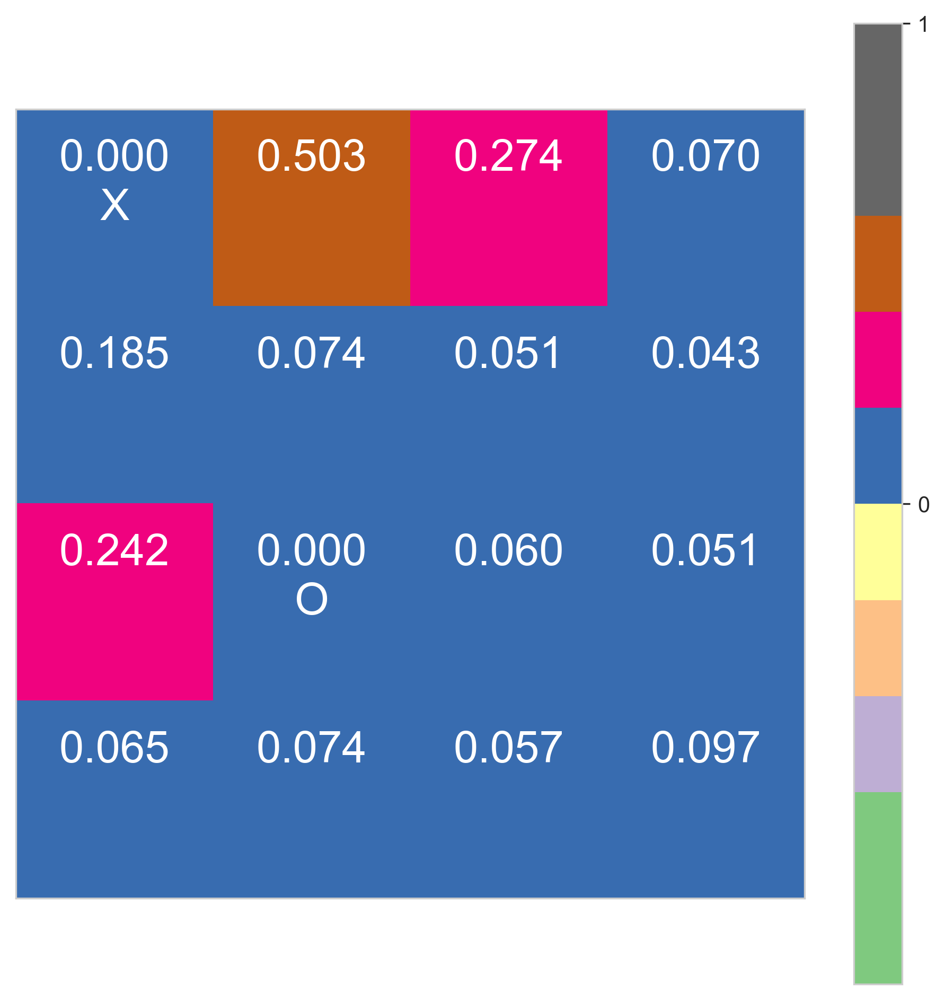

0 (0, 0) 0
1 (0, 1) 0.5030755027511863
2 (0, 2) 0.27369349096645695
3 (0, 3) 0.06995230927526185
4 (1, 0) 0.1850871083009215
5 (1, 1) 0.07361237894307875
6 (1, 2) 0.050640533099767904
7 (1, 3) 0.04297899209316013
8 (2, 0) 0.24183410496007085
9 (2, 1) 0
10 (2, 2) 0.06001056661900848
11 (2, 3) 0.05075074454395118
12 (3, 0) 0.0651959575601318
13 (3, 1) 0.07389583490018518
14 (3, 2) 0.05722150402913673
15 (3, 3) 0.0972712847778184


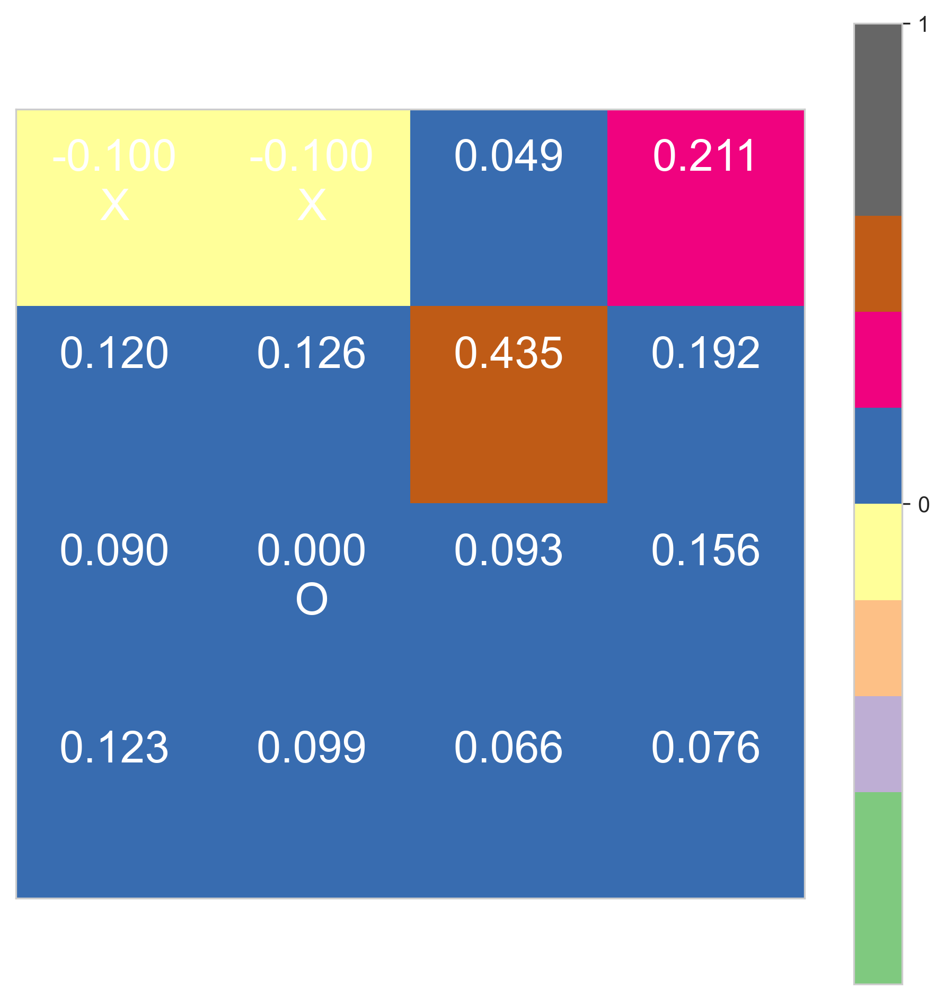

0 (0, 0) -0.1
1 (0, 1) -0.1
2 (0, 2) 0.04914659686431059
3 (0, 3) 0.21107270419531834
4 (1, 0) 0.1198878222799236
5 (1, 1) 0.1255733984109428
6 (1, 2) 0.43495043182663856
7 (1, 3) 0.19179685941708896
8 (2, 0) 0.08976799483286119
9 (2, 1) 0
10 (2, 2) 0.09347609192773967
11 (2, 3) 0.15623601118008446
12 (3, 0) 0.12288843169668882
13 (3, 1) 0.09853890893001084
14 (3, 2) 0.06554286064758152
15 (3, 3) 0.07561171424342404


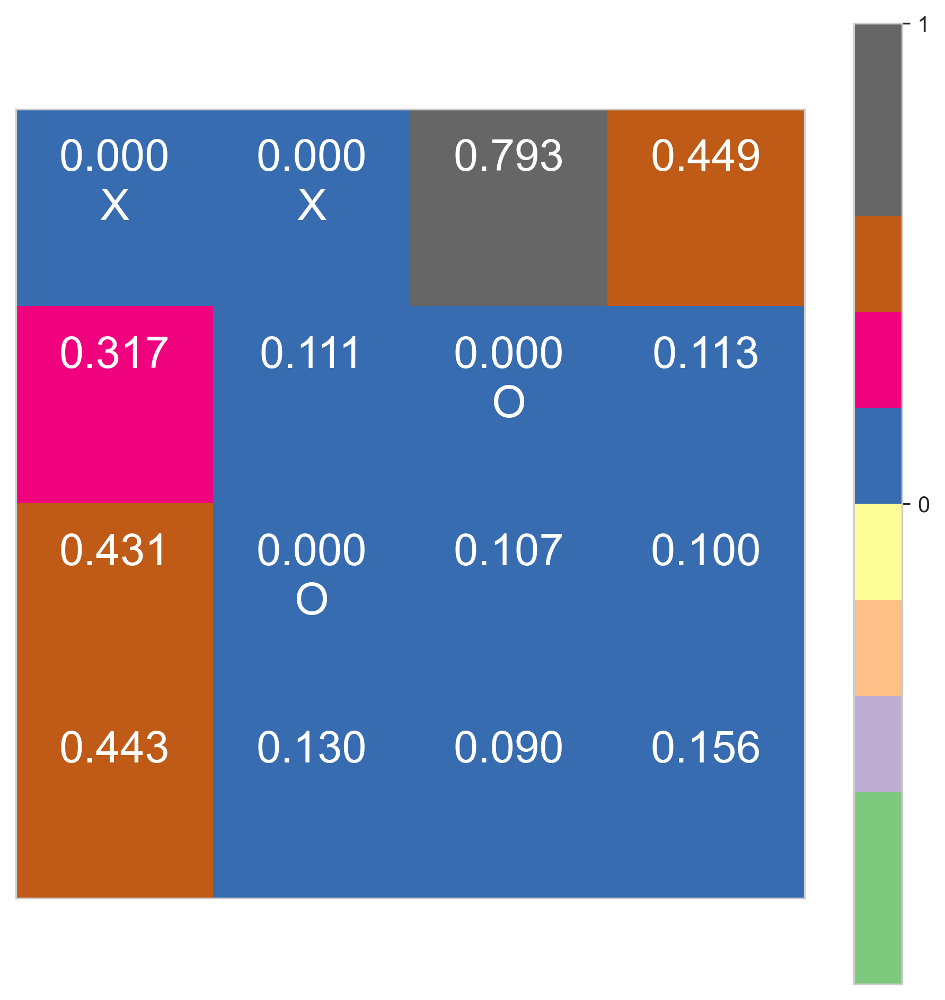

0 (0, 0) 0
1 (0, 1) 0
2 (0, 2) 0.7931038743055628
3 (0, 3) 0.44862023201518403
4 (1, 0) 0.31738219780571053
5 (1, 1) 0.11094482016039191
6 (1, 2) 0
7 (1, 3) 0.11268366897458998
8 (2, 0) 0.4305236686288738
9 (2, 1) 0
10 (2, 2) 0.10721558548416944
11 (2, 3) 0.0997742308247919
12 (3, 0) 0.4433761734919296
13 (3, 1) 0.13016857998675013
14 (3, 2) 0.09006564836504258
15 (3, 3) 0.15555961899159754


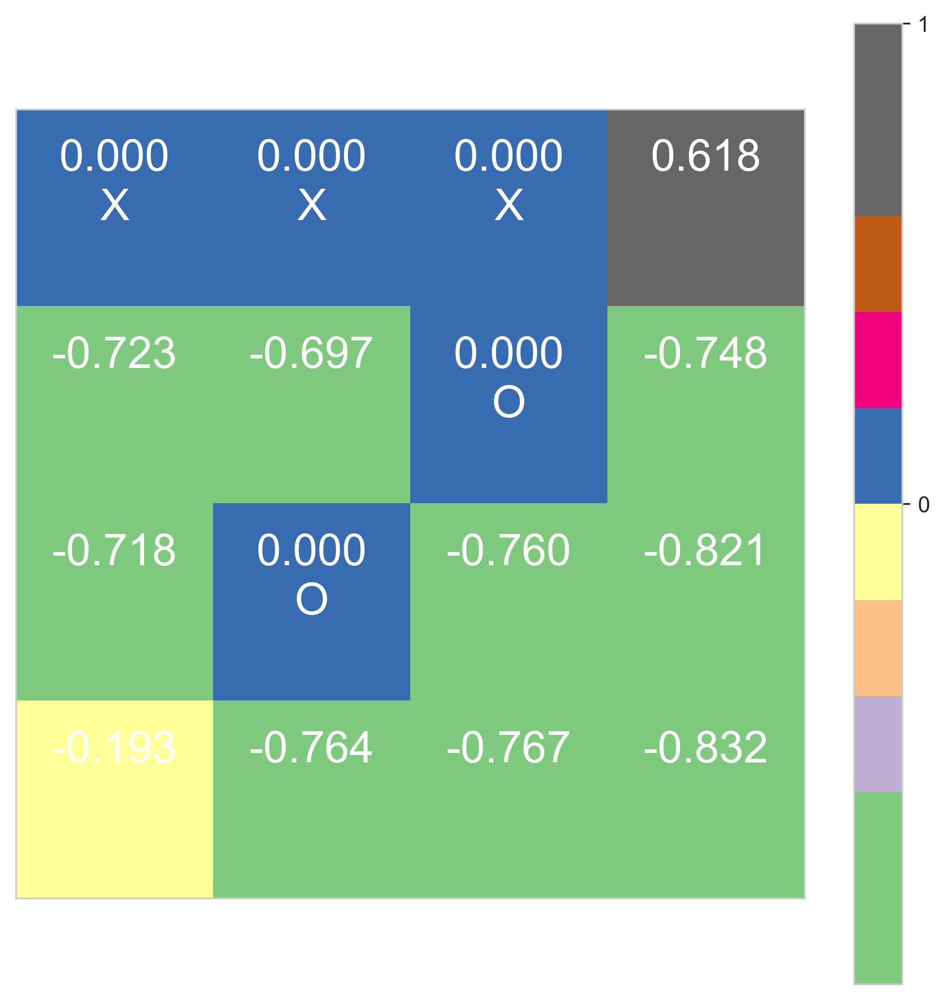

0 (0, 0) 0
1 (0, 1) 0
2 (0, 2) 0
3 (0, 3) 0.618107938996398
4 (1, 0) -0.722682751711468
5 (1, 1) -0.6966434154026235
6 (1, 2) 0
7 (1, 3) -0.7484302301495467
8 (2, 0) -0.7181124832447257
9 (2, 1) 0
10 (2, 2) -0.7596446791818031
11 (2, 3) -0.8213885088429524
12 (3, 0) -0.19266857754208433
13 (3, 1) -0.7636936991501476
14 (3, 2) -0.7670484007781486
15 (3, 3) -0.8317050058526684


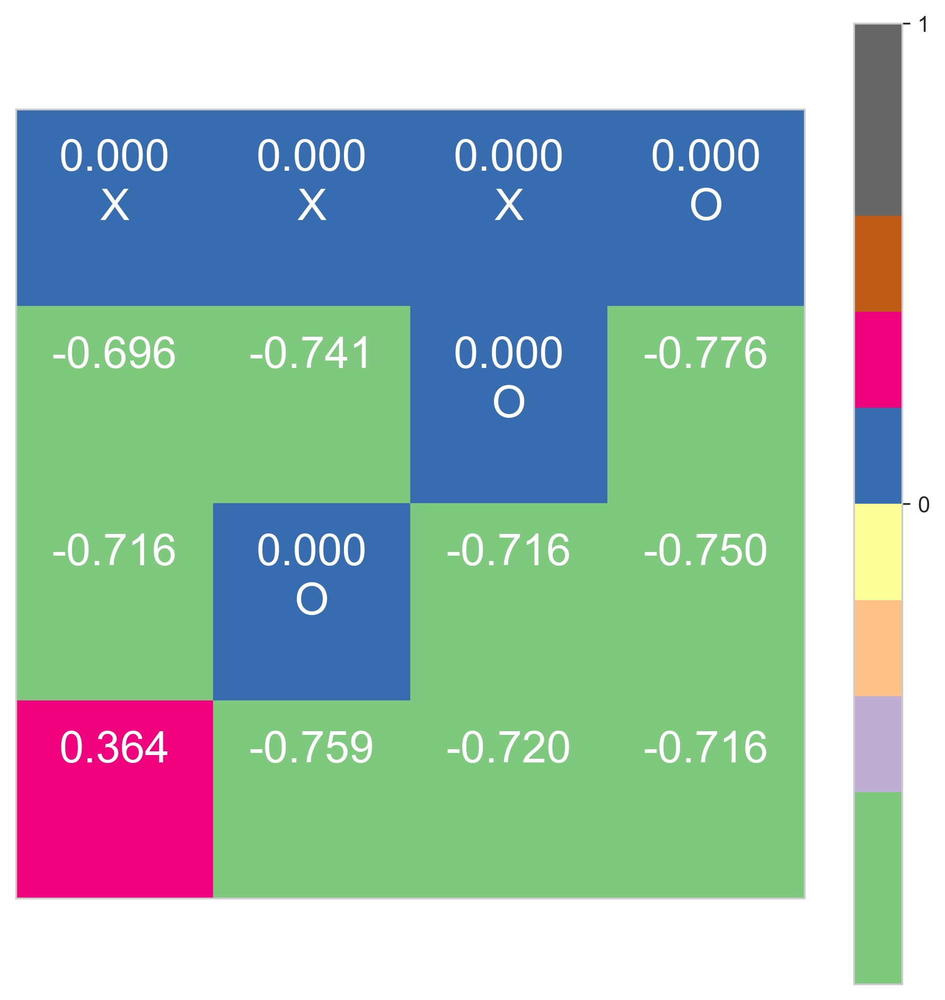

0 (0, 0) 0
1 (0, 1) 0
2 (0, 2) 0
3 (0, 3) 0
4 (1, 0) -0.6957149378724401
5 (1, 1) -0.7412256147765361
6 (1, 2) 0
7 (1, 3) -0.7764522049347305
8 (2, 0) -0.7163002114917381
9 (2, 1) 0
10 (2, 2) -0.7163358803232966
11 (2, 3) -0.7495370875336781
12 (3, 0) 0.36446573811459415
13 (3, 1) -0.7589858560140279
14 (3, 2) -0.7197097675545429
15 (3, 3) -0.7164938171015804


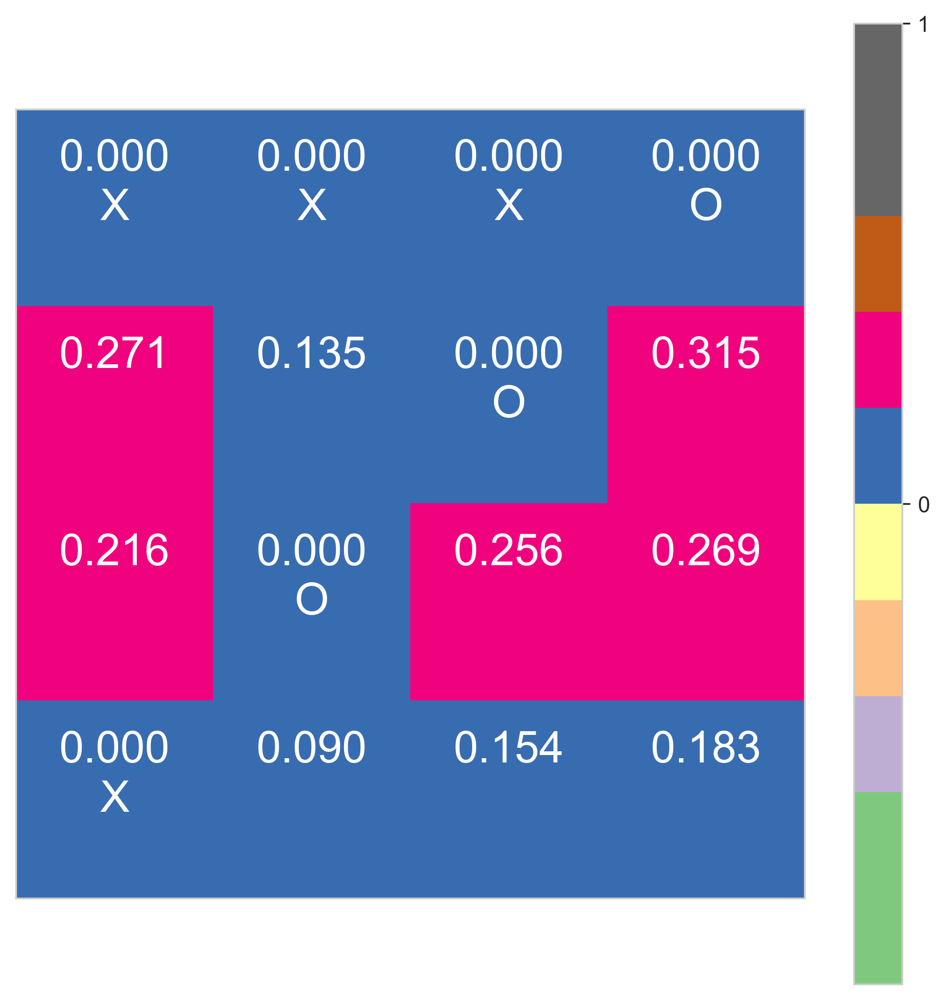

0 (0, 0) 0
1 (0, 1) 0
2 (0, 2) 0
3 (0, 3) 0
4 (1, 0) 0.2711087467805104
5 (1, 1) 0.13507128323105075
6 (1, 2) 0
7 (1, 3) 0.3153332604757939
8 (2, 0) 0.2160203485934305
9 (2, 1) 0
10 (2, 2) 0.25642940746231735
11 (2, 3) 0.26911090371722884
12 (3, 0) 0
13 (3, 1) 0.090403635892747
14 (3, 2) 0.1537366005798697
15 (3, 3) 0.18348482076986364


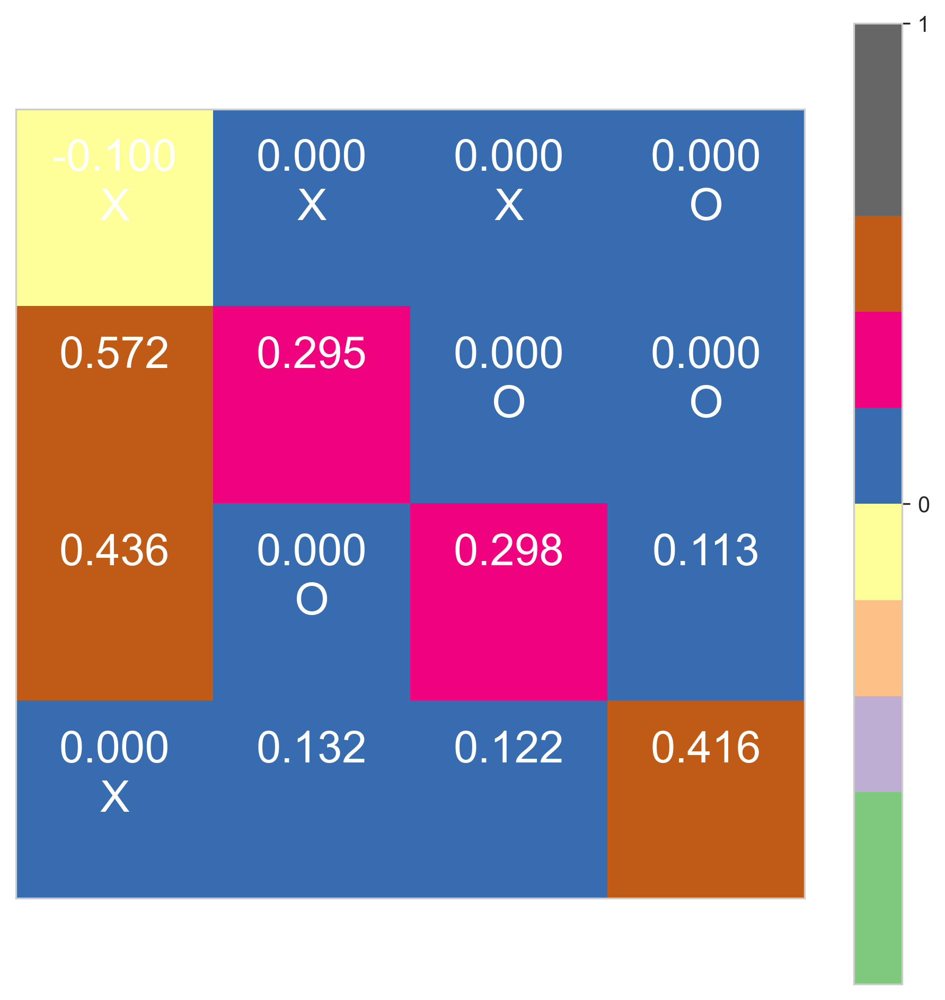

0 (0, 0) -0.1
1 (0, 1) 0
2 (0, 2) 0
3 (0, 3) 0
4 (1, 0) 0.5716285175524418
5 (1, 1) 0.2947503761232198
6 (1, 2) 0
7 (1, 3) 0
8 (2, 0) 0.43552957744136067
9 (2, 1) 0
10 (2, 2) 0.29794577638191855
11 (2, 3) 0.11346813254411507
12 (3, 0) 0
13 (3, 1) 0.13203194257392215
14 (3, 2) 0.12219850533817486
15 (3, 3) 0.4156315155948667


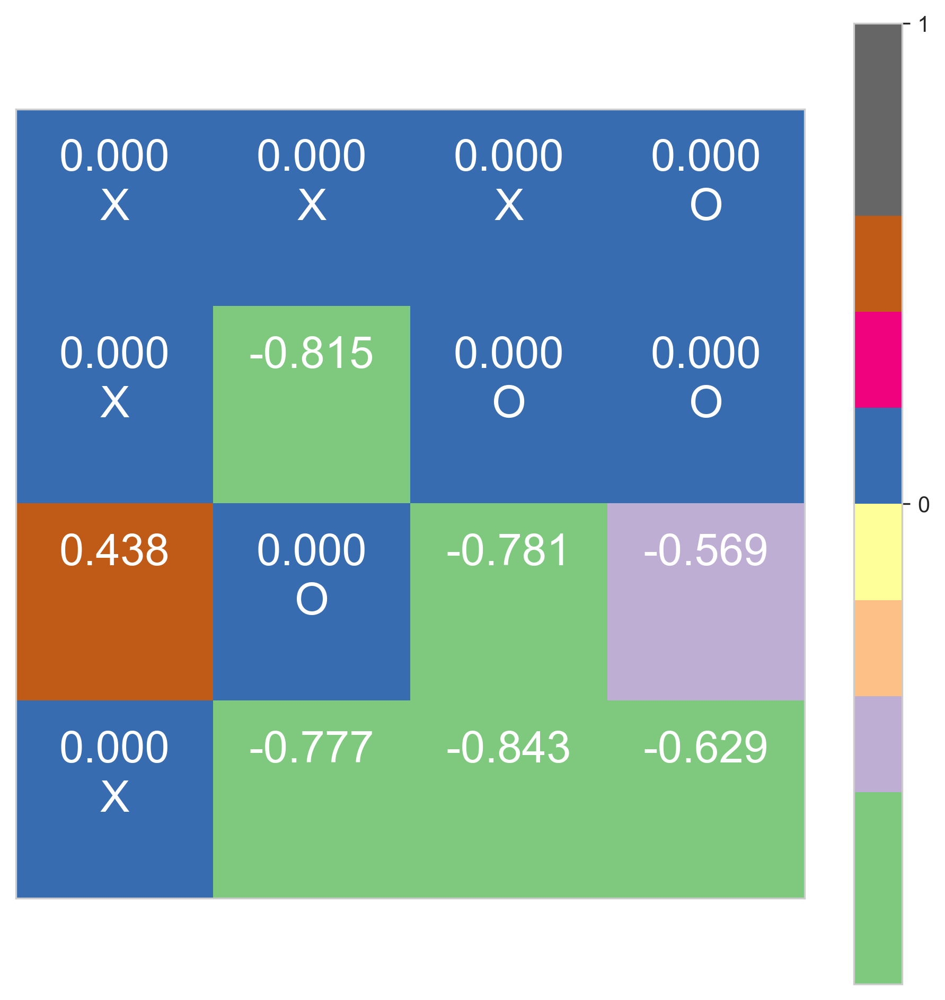

0 (0, 0) 0
1 (0, 1) 0
2 (0, 2) 0
3 (0, 3) 0
4 (1, 0) 0
5 (1, 1) -0.8147314727301994
6 (1, 2) 0
7 (1, 3) 0
8 (2, 0) 0.4375860463432732
9 (2, 1) 0
10 (2, 2) -0.7813467945093167
11 (2, 3) -0.5687466914879682
12 (3, 0) 0
13 (3, 1) -0.7773893457748844
14 (3, 2) -0.8431488313842218
15 (3, 3) -0.6287169084419403


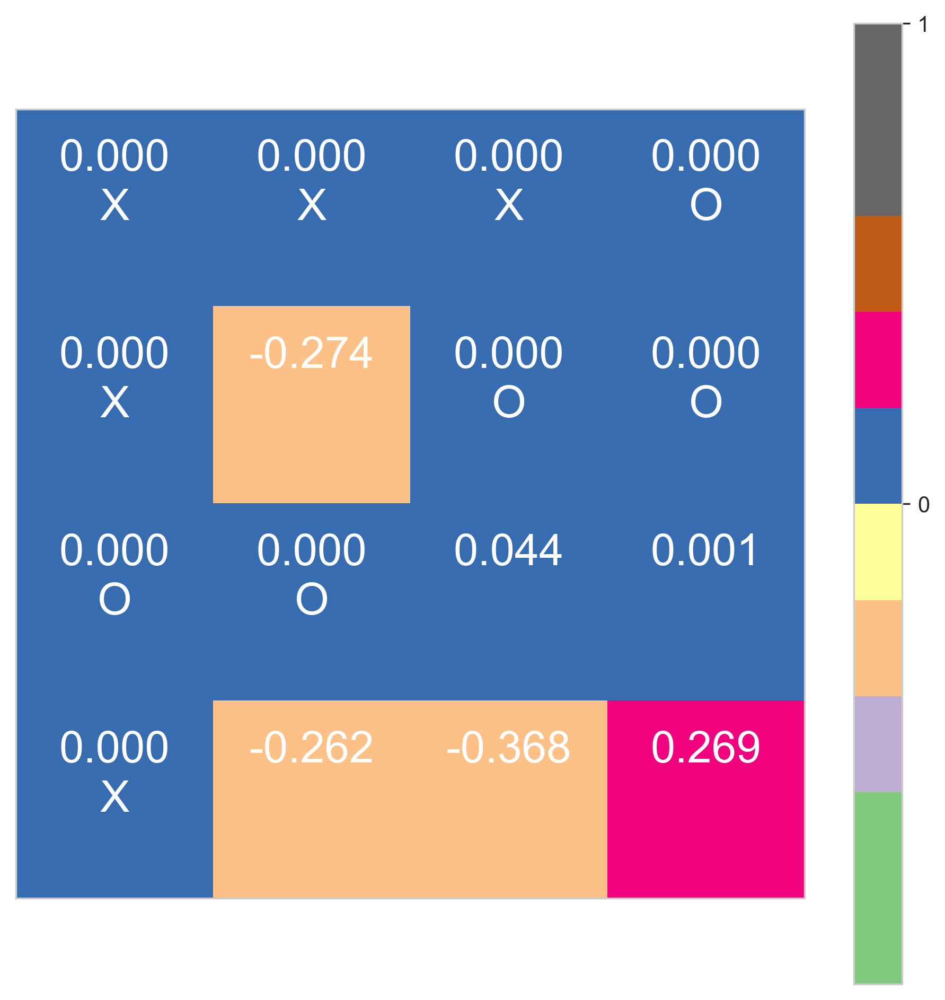

0 (0, 0) 0
1 (0, 1) 0
2 (0, 2) 0
3 (0, 3) 0
4 (1, 0) 0
5 (1, 1) -0.27391074536065035
6 (1, 2) 0
7 (1, 3) 0
8 (2, 0) 0
9 (2, 1) 0
10 (2, 2) 0.0442218842902712
11 (2, 3) 0.0014660299439978903
12 (3, 0) 0
13 (3, 1) -0.2615595568544652
14 (3, 2) -0.36757886419284996
15 (3, 3) 0.26858287909318296


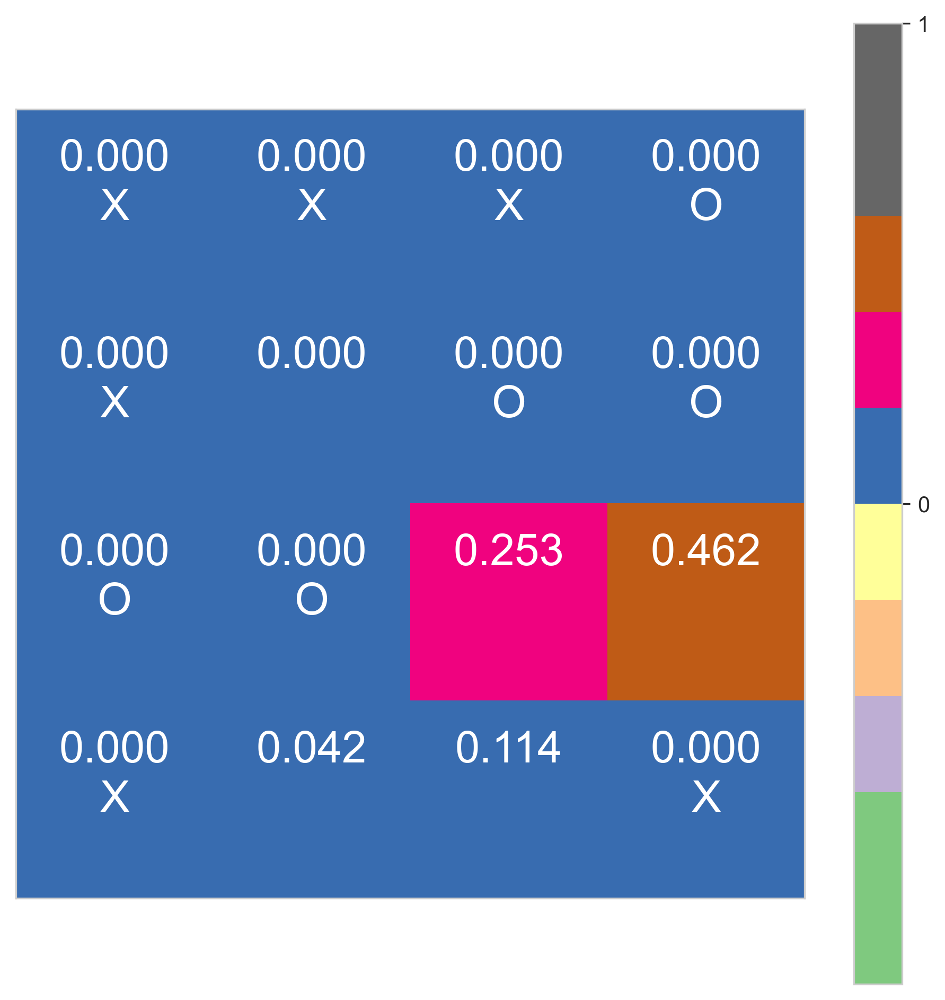

0 (0, 0) 0
1 (0, 1) 0
2 (0, 2) 0
3 (0, 3) 0
4 (1, 0) 0
5 (1, 1) 4.169981665129137e-06
6 (1, 2) 0
7 (1, 3) 0
8 (2, 0) 0
9 (2, 1) 0
10 (2, 2) 0.25279381108272037
11 (2, 3) 0.46232832029501064
12 (3, 0) 0
13 (3, 1) 0.04219335711908296
14 (3, 2) 0.11387553656432878
15 (3, 3) 0


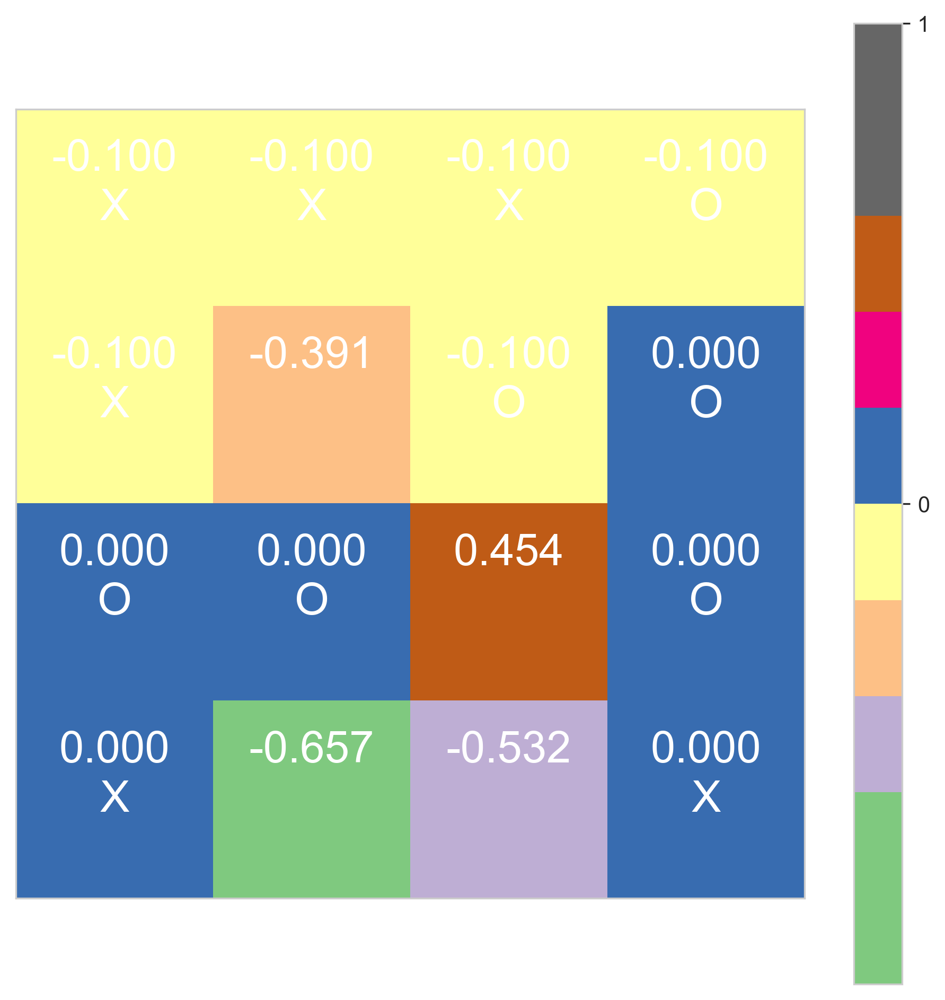

0 (0, 0) -0.1
1 (0, 1) -0.1
2 (0, 2) -0.1
3 (0, 3) -0.1
4 (1, 0) -0.1
5 (1, 1) -0.3908972605467589
6 (1, 2) -0.1
7 (1, 3) 0
8 (2, 0) 0
9 (2, 1) 0
10 (2, 2) 0.45398503811487617
11 (2, 3) 0
12 (3, 0) 0
13 (3, 1) -0.6573589774611692
14 (3, 2) -0.5320672098101604
15 (3, 3) 0


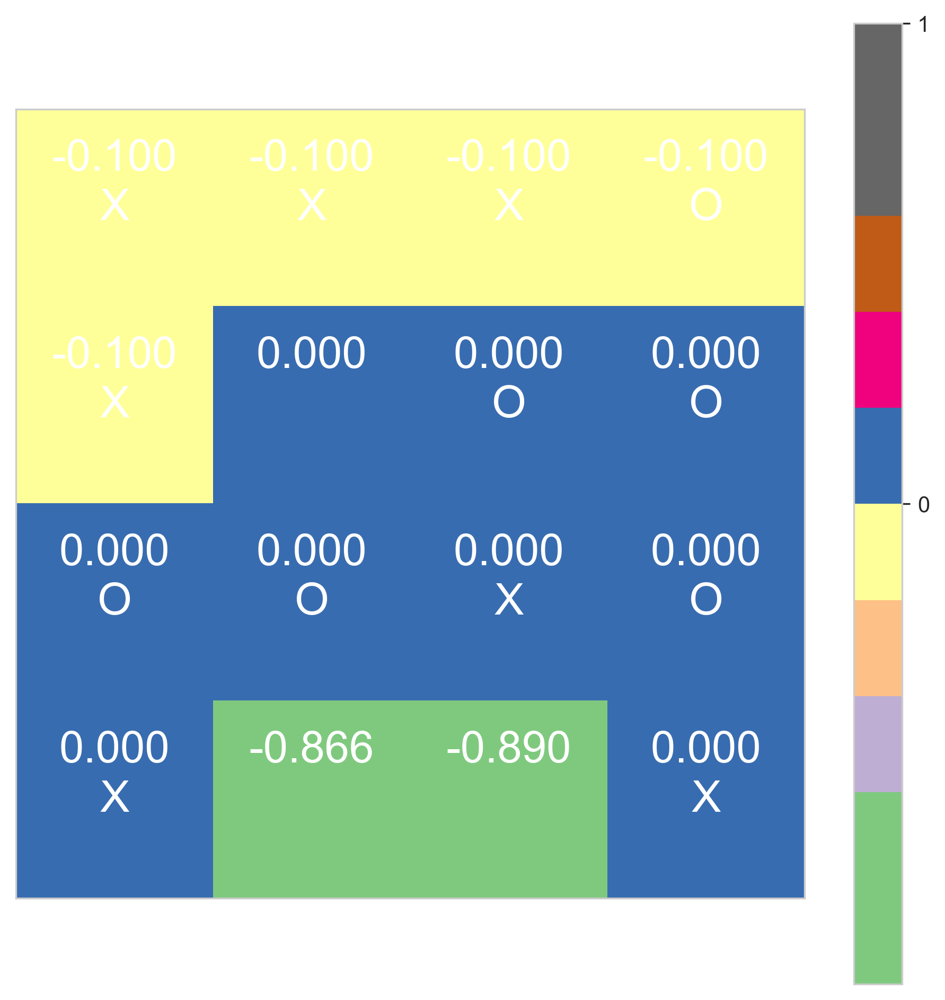

0 (0, 0) -0.1
1 (0, 1) -0.1
2 (0, 2) -0.1
3 (0, 3) -0.1
4 (1, 0) -0.1
5 (1, 1) 0.0
6 (1, 2) 0
7 (1, 3) 0
8 (2, 0) 0
9 (2, 1) 0
10 (2, 2) 0
11 (2, 3) 0
12 (3, 0) 0
13 (3, 1) -0.8656514213713031
14 (3, 2) -0.8903710617394154
15 (3, 3) 0


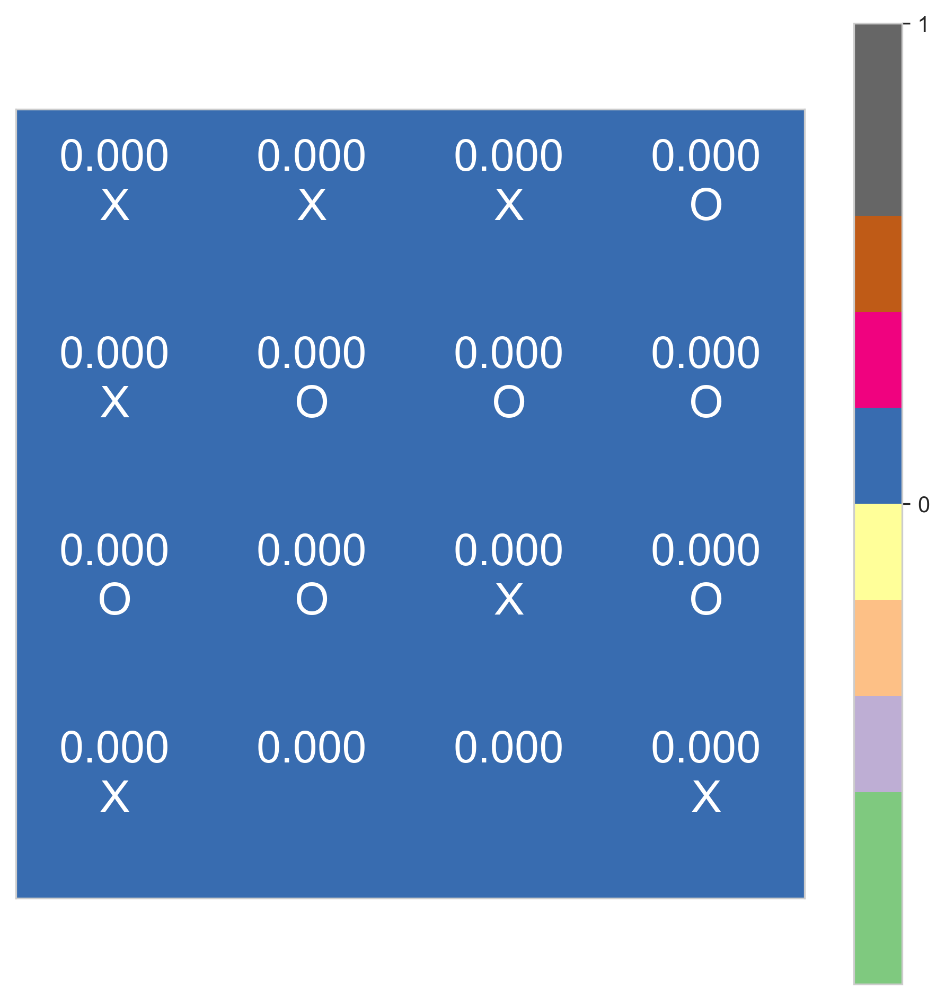

0 (0, 0) 0
1 (0, 1) 0
2 (0, 2) 0
3 (0, 3) 0
4 (1, 0) 0
5 (1, 1) 0
6 (1, 2) 0
7 (1, 3) 0
8 (2, 0) 0
9 (2, 1) 0
10 (2, 2) 0
11 (2, 3) 0
12 (3, 0) 0
13 (3, 1) 3.8899153239759087e-131
14 (3, 2) 0.0
15 (3, 3) 0


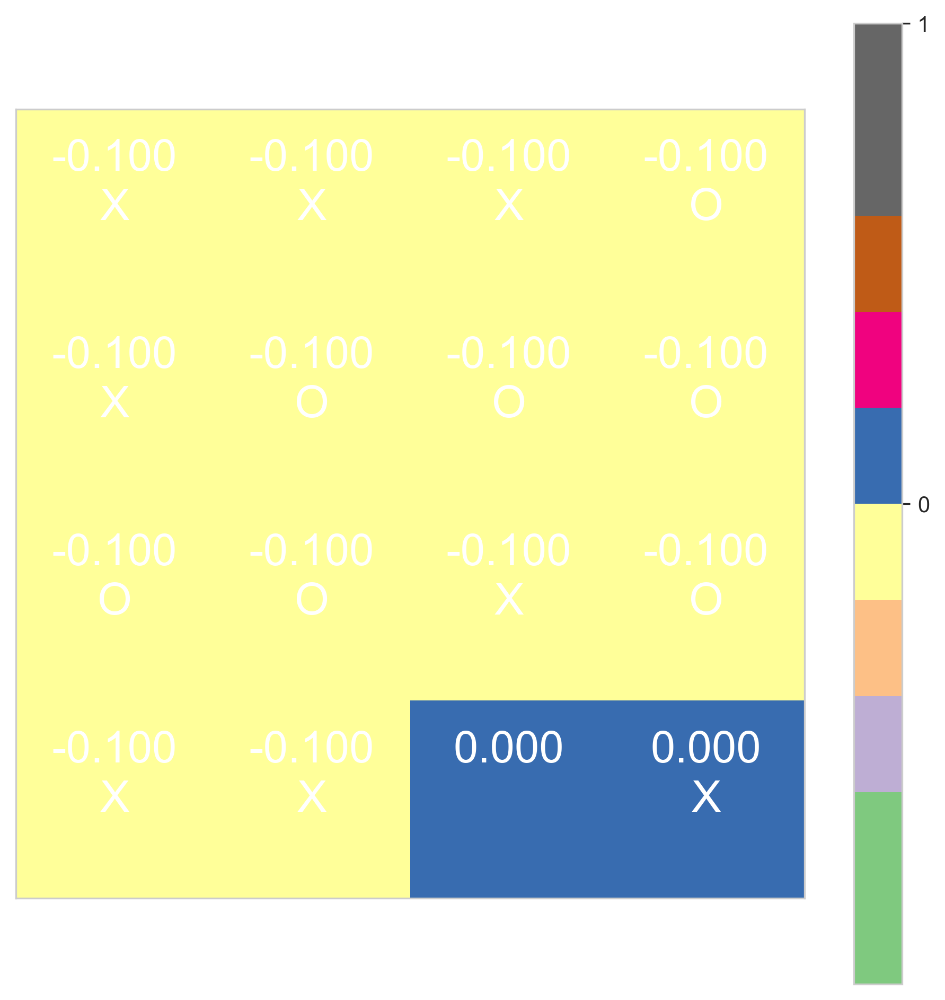

0 (0, 0) -0.1
1 (0, 1) -0.1
2 (0, 2) -0.1
3 (0, 3) -0.1
4 (1, 0) -0.1
5 (1, 1) -0.1
6 (1, 2) -0.1
7 (1, 3) -0.1
8 (2, 0) -0.1
9 (2, 1) -0.1
10 (2, 2) -0.1
11 (2, 3) -0.1
12 (3, 0) -0.1
13 (3, 1) -0.1
14 (3, 2) 0.0
15 (3, 3) 0
time: 13.4 s


In [19]:
plot_test_game(env, x_model, o_model, random_crosses=False, random_naughts=False, verbose=True, fontx=20)

**Вывод:**

Видно, что при больших epsilon модели больше исследуют, чем пытаются победить (средние reward'ы колеблются около нуля). 

Начиная с epsilon = 0.6 модель крестиков начинает активно побеждать. 

После epsilon = 0.5 ее отрыв от ноликовой модели начинает плавно и увернно сокращаться и в среднем reward крестиков порядка текущего значения epsilon. 

Пологаю, что при достижении маленького epsilon модели бы начали в среднем играть в ничью (что подтверждает пример жадной игры).

# Часть вторая: добавим нейронных сетей
Реализуйте нейронную сеть для метода DQN на доске для крестиков-ноликов. Не буду ограничивать фантазию, но кажется, что свёртки 3х3 здесь должны неплохо работать (в том числе обобщаться на доски размера побольше).

## Задание 3
Реализуйте DQN с нейронной сетью, обучите стратегии крестиков и ноликов. Замечание: скорее всего, experience replay потребуется сразу же.

In [30]:
import random

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as T
from torch.autograd import Variable

from torchsummary import summary

time: 138 ms


In [21]:
class ReplayMemory():
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = []
        self.position = 0

    def store(self, exptuple):
        if len(self.memory) < self.capacity:
            self.memory.append(None)
        self.memory[self.position] = exptuple
        self.position = (self.position + 1) % self.capacity
       
    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)
    
    def __len__(self):
        return len(self.memory)

time: 37.7 ms


In [37]:
class Network(nn.Module):
    def __init__(self, n_cols, n_rows, hid_size=64):
        nn.Module.__init__(self)
        self.l1 = nn.Conv2d(2, hid_size, 3)
        n_steps = n_rows - 3 + 1
        self.l2 = nn.Linear(hid_size * n_steps**2, n_cols * n_rows)

    def forward(self, x):
        x = self.l1(x)
        x = torch.flatten(x, start_dim=1)
        x = F.relu(x)
        x = self.l2(x)
        return x

time: 39.9 ms


In [23]:
def to_one_hot(y_tensor, n_dims=None):
    """ Take an integer vector and convert it to 1-hot matrix. """
    y_tensor = y_tensor.type(torch.LongTensor).view(-1, 1)
    n_dims = n_dims if n_dims is not None else int(torch.max(y_tensor)) + 1
    y_one_hot = torch.zeros(y_tensor.size()[0], n_dims).scatter_(1, y_tensor, 1)
    return y_one_hot

time: 35.2 ms


In [74]:
class DQNAgent:
    """ Agent, which fit policy by DQN. """
    
    def __init__(
        self, 
        actions_list: typing.List[typing.Tuple[int, int]], n_cols: int, n_rows: int,
        alpha: float = 1e-3, gamma: float = 1.0,
        eps_init: float = 0.9, eps_final: float = 0.01, eps_decay: int = 1000,
        memory_capacity: int = 10000, batch_size: int = 64, hid_size: int = 64,
    ):
        self._actions_list = actions_list
        self.n_actions = len(self._actions_list)
        self.model = Network(n_cols=n_cols, n_rows=n_rows, hid_size=hid_size)
        self.n_cols = n_cols
        self.n_rows = n_rows
        
        self.gamma = gamma
        
        self.eps_init, self.eps_final, self.eps_decay = eps_init, eps_final, eps_decay
        self.eps = 0
        self.num_step = 0
        
        self.memory = ReplayMemory(memory_capacity)
        self.batch_size = batch_size
        self.optimizer = optim.Adam(self.model.parameters(), alpha)
        
    def get_action(
        self, s, greedy=True, for_train=True, 
        empty_spaces: typing.List[typing.Tuple[int, int]] = None,
    ) -> typing.Tuple[int, int]:
        if for_train:
            self.num_step += 1
        
        if greedy:
            return self._get_optimal_action(hash_state=s)
        else:
            self.eps = self.eps_final + (self.eps_init - self.eps_final) * np.exp(-1. * self.num_step / self.eps_decay)
            if np.random.rand() <= self.eps:
                if empty_spaces is not None:
                    i = np.random.choice(len(empty_spaces))
                    return empty_spaces[i]
                else:
                    i = np.random.choice(len(self._actions_list))
                    return self._actions_list[i]
            else:
                return self._get_optimal_action(hash_state=s)
            
    def _get_optimal_action(self, hash_state: str):
        with torch.no_grad():
            state_tensor = self._board_hash2state(hash_state=hash_state).unsqueeze(0)
            idx = self.model(state_tensor).data.max(1)[1].numpy()[0]
        return self._actions_list[idx]
    
    def _board_hash2state(self, hash_state: str):
        board_3d = np.array(list(map(int, hash_state))).reshape(1, self.n_rows, self.n_cols) - 1
        board_3d = np.concatenate([
                np.where(board_3d == 1, 1, 0),
                np.where(board_3d == -1, 1, 0),
            ],
            axis=0,
        )
        return torch.tensor(board_3d, dtype=torch.float32, requires_grad=False)
    
    def update(self, s, a, r, next_s, is_done):
        # save sars
        a = tuple(a)
        state_tensor = self._board_hash2state(hash_state=s)
        action_tensor = torch.tensor([self._actions_list.index(a)], dtype=torch.float32, requires_grad=False)
        reward_tensor = torch.tensor([r], dtype=torch.float32, requires_grad=False)
        next_state_tensor = self._board_hash2state(hash_state=next_s)
        transition = (state_tensor, action_tensor, reward_tensor, next_state_tensor)
        self.memory.store(transition)
        
        # train
        if len(self.memory) < self.batch_size:
            return
        
        ## get batch
        transitions = self.memory.sample(self.batch_size)
        batch_state, batch_action, batch_reward, batch_next_state = zip(*transitions)
        
        ## eval loss
        loss = self.compute_td_loss(
            states=torch.stack(batch_state), 
            actions=torch.stack(batch_action), 
            rewards=torch.stack(batch_reward), 
            next_states=torch.stack(batch_next_state),
        )

#         Q = self.model(batch_state).gather(1, batch_action).reshape([self.batch_size])

#         Qmax = self.model(batch_next_state).detach().max(1)[0]
#         Qnext = batch_reward + (self.gamma * Qmax)

#         loss = F.smooth_l1_loss(Q, Qnext)
        
        ## optimize
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
    def compute_td_loss(self, states: torch.tensor, actions: torch.tensor, rewards: torch.tensor, next_states):
        # get q-values for all actions in current states
        predicted_qvalues = self.model(states)
#         print('predicted_qvalues', predicted_qvalues.size())

        # select q-values for chosen actions
        predicted_qvalues_for_actions = torch.sum(predicted_qvalues * to_one_hot(actions, self.n_actions), dim=1)  # shape: [batch_size]
#         print('predicted_qvalues_for_actions', predicted_qvalues_for_actions.size())

        # compute q-values for all actions in next states
        predicted_next_qvalues = self.model(next_states).detach()
#         print('predicted_next_qvalues', predicted_next_qvalues.size())

        # compute V*(next_states) using predicted next q-values
        next_state_values = torch.max(predicted_next_qvalues, dim=1)[0]
        assert next_state_values.dtype == torch.float32
#         print('next_state_values', next_state_values.size())

        # compute "target q-values" for loss
        target_qvalues_for_actions = rewards.flatten() + self.gamma*next_state_values
#         print('rewards', rewards.size())
        

#         print('predicted_qvalues_for_actions', predicted_qvalues_for_actions.size())
#         print('target_qvalues_for_actions', target_qvalues_for_actions.size())
        # mean squared error loss to minimize
        loss = F.smooth_l1_loss(predicted_qvalues_for_actions, target_qvalues_for_actions)
#         print('loss', loss.size())
#         print('loss', loss)
#         raise Exception()
        return loss
    
#     predicted_qvalues torch.Size([64, 16])
#     predicted_qvalues_for_actions torch.Size([64])
#     predicted_next_qvalues torch.Size([64, 16])
#     next_state_values torch.Size([64])
#     rewards torch.Size([64, 1])
#     predicted_qvalues_for_actions torch.Size([64])
#     target_qvalues_for_actions torch.Size([64, 64])
#     loss torch.Size([])
#     loss tensor(2.9743, grad_fn=<SmoothL1LossBackward>)

time: 38.3 ms


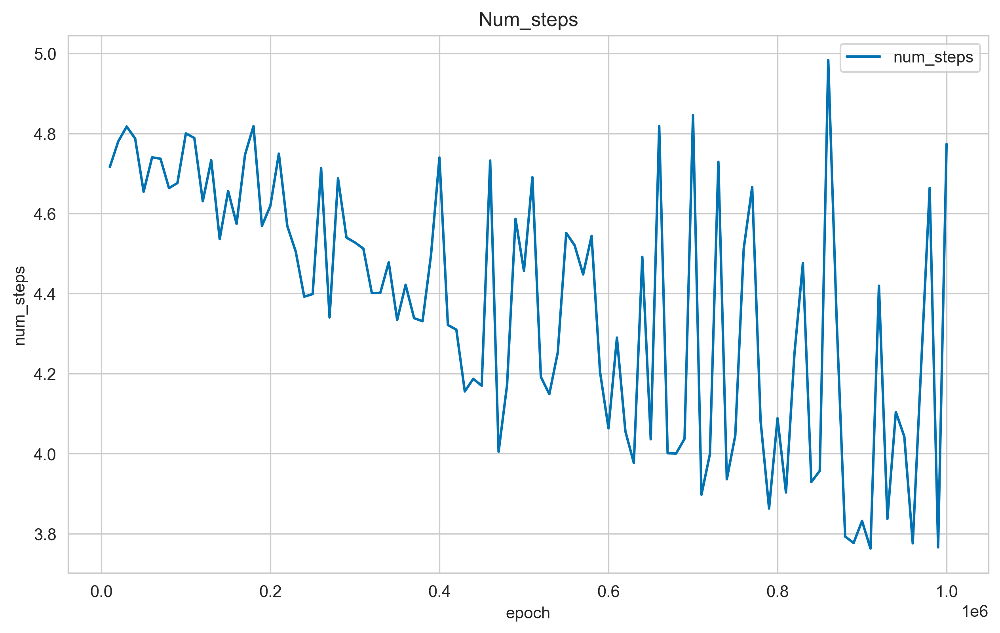

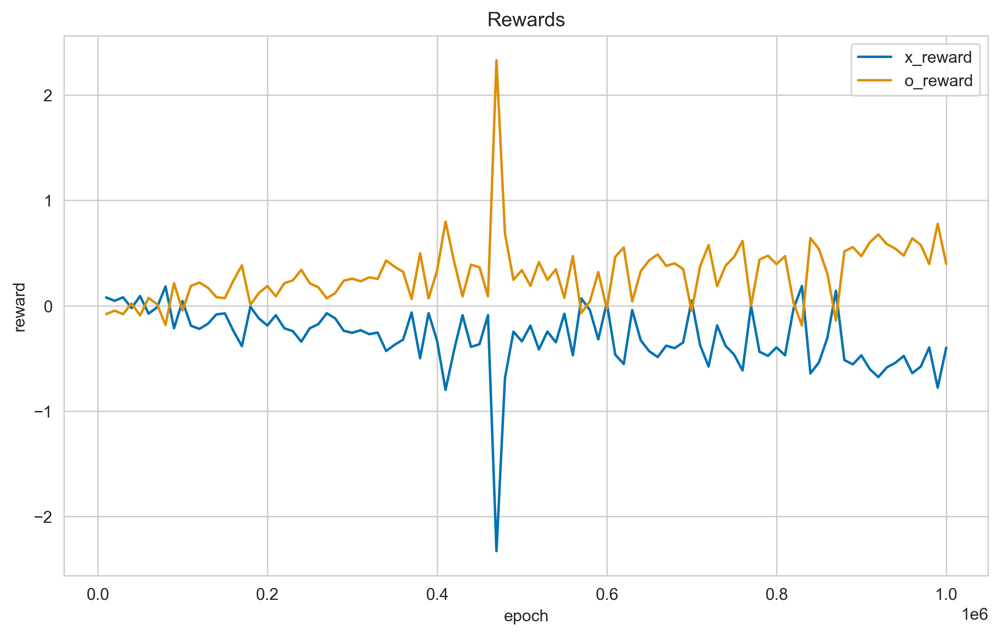

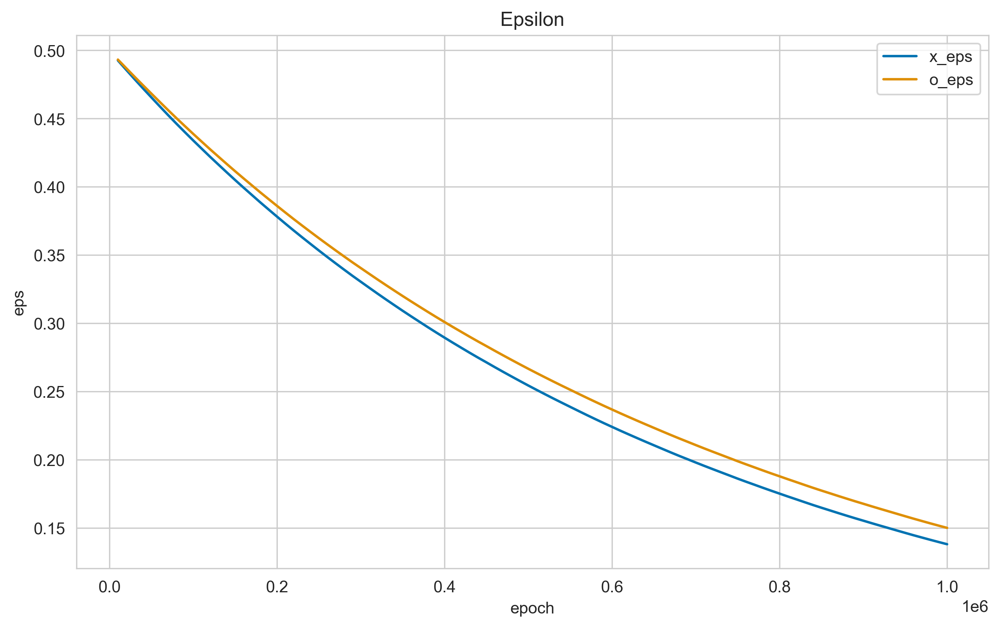


time: 6h 56min 16s


In [76]:
n_rows = 4
n_cols = 4
n_win = 4

n_episodes = int(1e6)
val_freq = int(1e4)
n_val_episodes = int(1e4)

actions_list = [(i, j) for i in range(n_rows) for j in range(n_cols)]
alpha = 1e-3
gamma = 0.6

eps_init = 0.5
eps_final = 0.01
eps_decay = 8e5 * 5 # 5 == mean n_steps

memory_capacity = 30000
batch_size = 64
hid_size = 64


env = TicTacToe(n_rows=n_rows, n_cols=n_cols, n_win=n_win)
x_model = DQNAgent(
    n_cols=n_cols, n_rows=n_rows,
    memory_capacity=memory_capacity, batch_size=batch_size, hid_size=hid_size,
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
)
o_model = DQNAgent(
    n_cols=n_cols, n_rows=n_rows,
    memory_capacity=memory_capacity, batch_size=batch_size, hid_size=hid_size,
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
)
coordinator = TicTacToeCoordinator(env=env, x_model=x_model, o_model=o_model)

for e in tqdm(range(n_episodes)):
    coordinator.run_episode(do_learning=True, greedy=False, render=False)
    
    if (e + 1) % val_freq == 0:
        clear_output(wait=True)
        coordinator.validate(n_episodes=n_val_episodes)

In [40]:
summary(x_model.model, input_size=(2, n_rows, n_cols))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1             [-1, 64, 2, 2]           1,216
            Linear-2                   [-1, 16]           4,112
Total params: 5,328
Trainable params: 5,328
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.02
Estimated Total Size (MB): 0.02
----------------------------------------------------------------
time: 150 ms


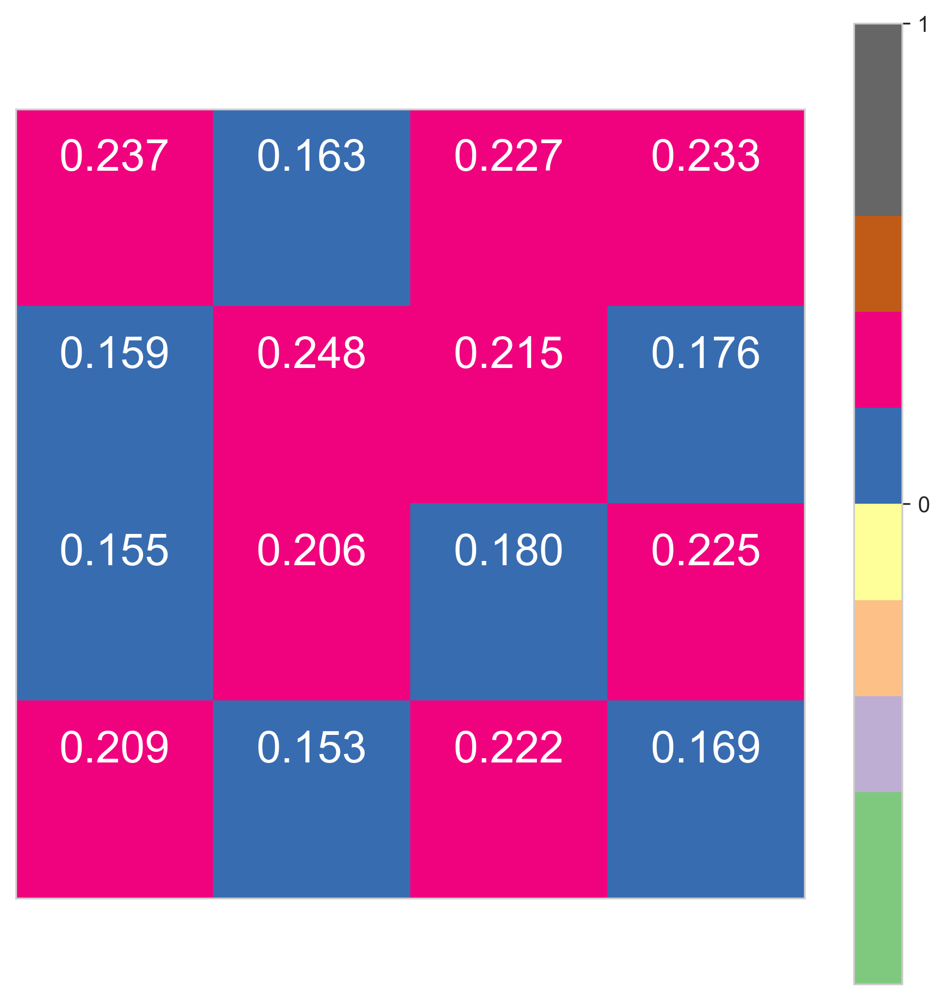

0 (0, 0) 0.23672429
1 (0, 1) 0.16262586
2 (0, 2) 0.22722913
3 (0, 3) 0.23320448
4 (1, 0) 0.15913332
5 (1, 1) 0.248351
6 (1, 2) 0.21505208
7 (1, 3) 0.17579646
8 (2, 0) 0.15506445
9 (2, 1) 0.20570488
10 (2, 2) 0.18003093
11 (2, 3) 0.22505243
12 (3, 0) 0.20931953
13 (3, 1) 0.15269998
14 (3, 2) 0.22238569
15 (3, 3) 0.16923177


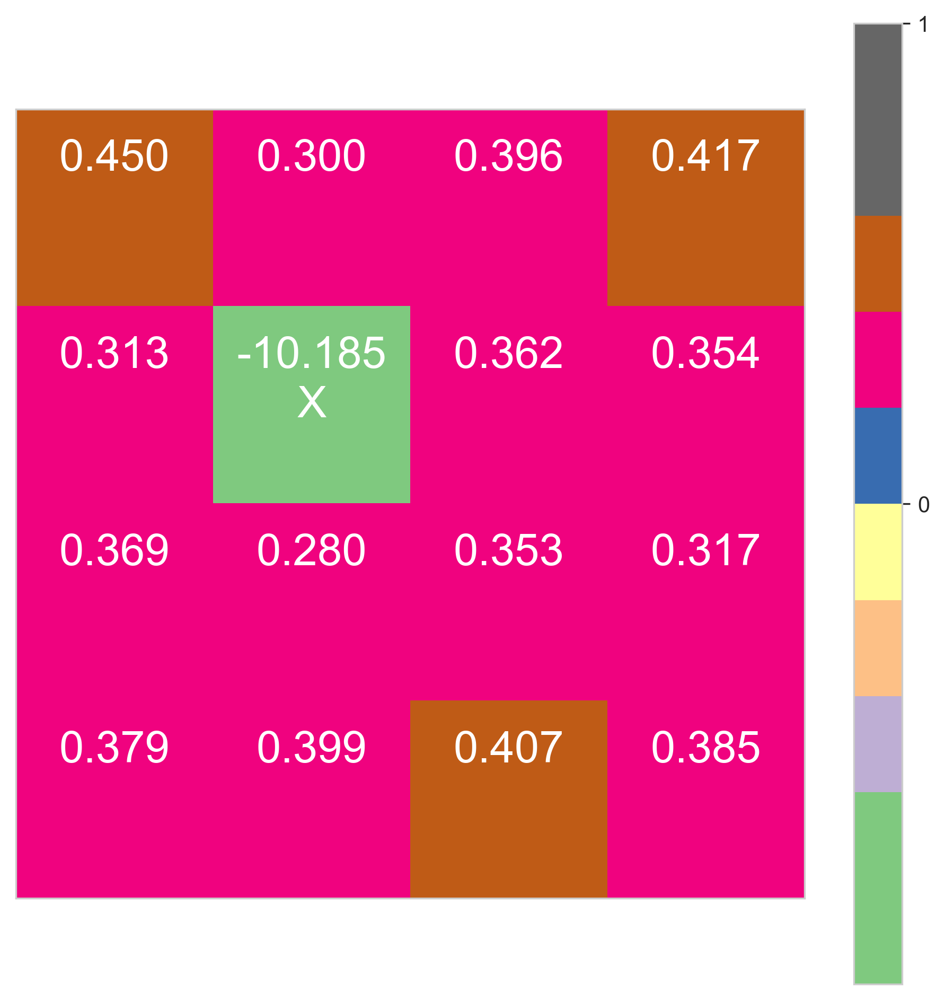

0 (0, 0) 0.44987047
1 (0, 1) 0.3002584
2 (0, 2) 0.3961866
3 (0, 3) 0.416612
4 (1, 0) 0.31308156
5 (1, 1) -10.184715
6 (1, 2) 0.36243132
7 (1, 3) 0.35412428
8 (2, 0) 0.36891156
9 (2, 1) 0.2798024
10 (2, 2) 0.35307544
11 (2, 3) 0.31652123
12 (3, 0) 0.37908
13 (3, 1) 0.39884698
14 (3, 2) 0.4069879
15 (3, 3) 0.38489938


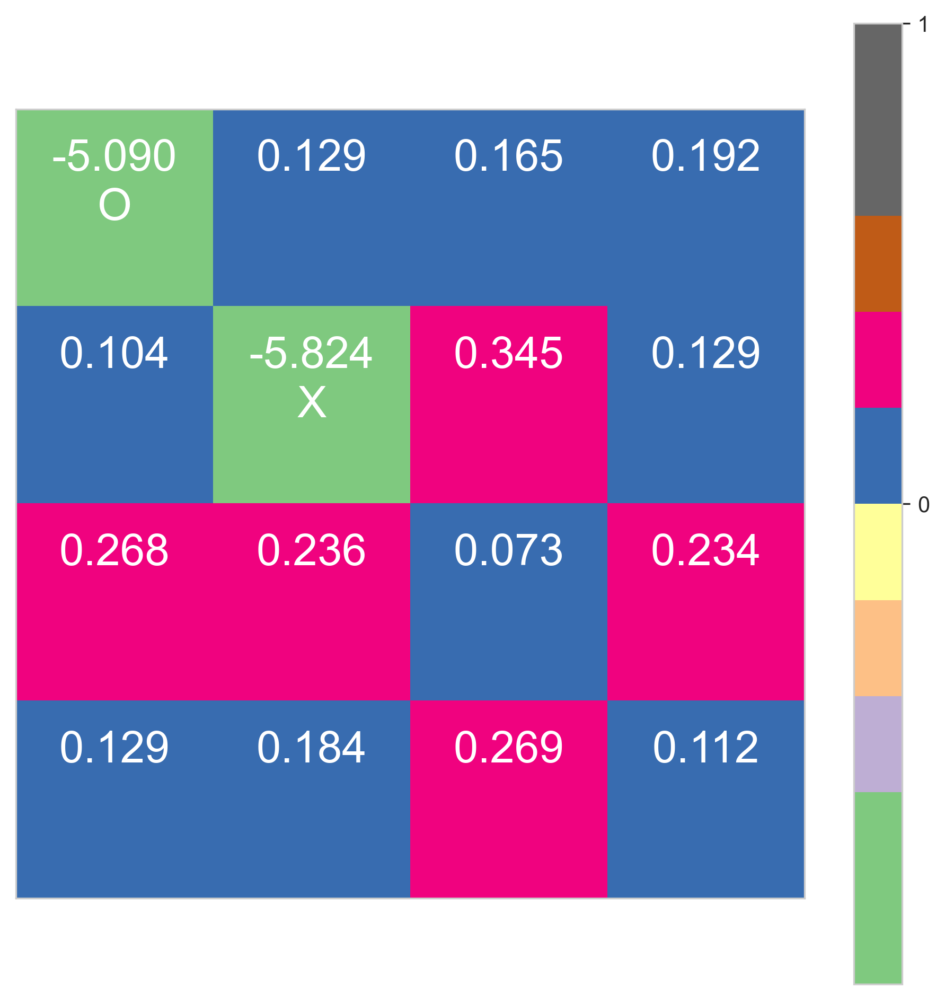

0 (0, 0) -5.0897145
1 (0, 1) 0.12853982
2 (0, 2) 0.16527885
3 (0, 3) 0.19238575
4 (1, 0) 0.10358247
5 (1, 1) -5.82405
6 (1, 2) 0.34498563
7 (1, 3) 0.12934801
8 (2, 0) 0.26786822
9 (2, 1) 0.23619121
10 (2, 2) 0.07312617
11 (2, 3) 0.23433587
12 (3, 0) 0.12878963
13 (3, 1) 0.18416525
14 (3, 2) 0.26873112
15 (3, 3) 0.11157563


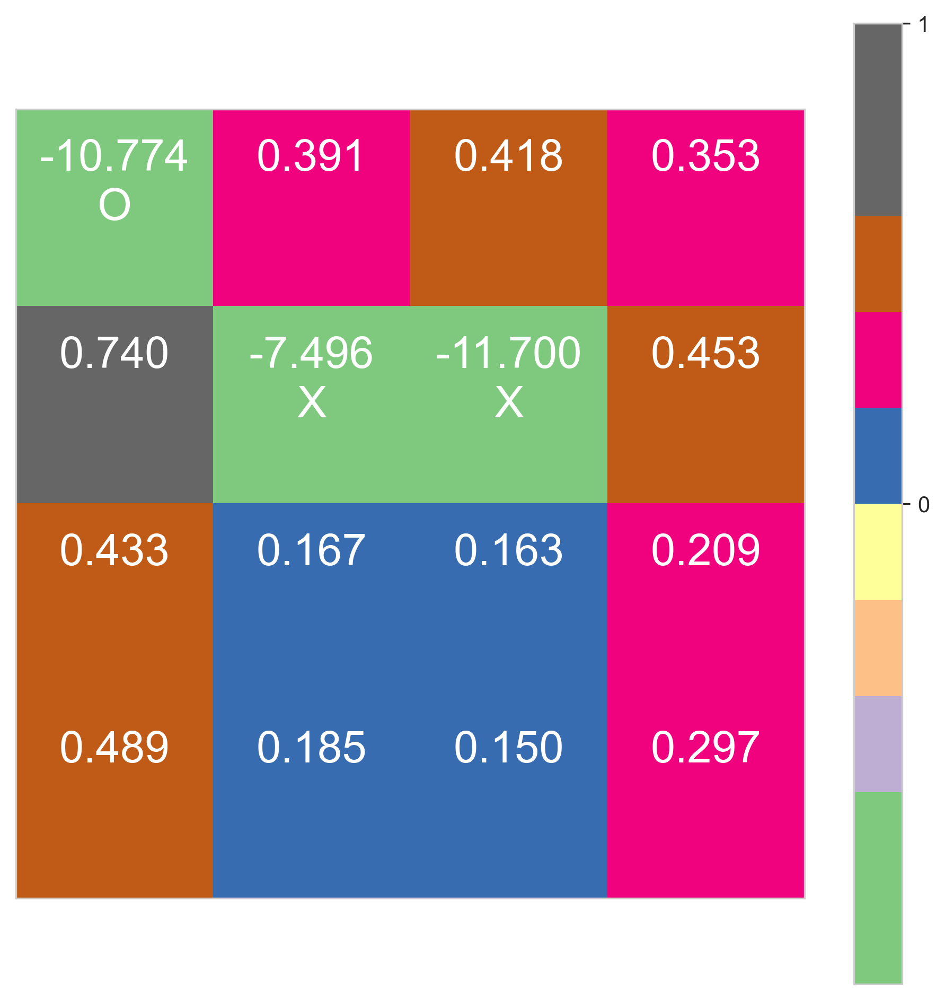

0 (0, 0) -10.77407
1 (0, 1) 0.39111274
2 (0, 2) 0.4177439
3 (0, 3) 0.35298684
4 (1, 0) 0.7397994
5 (1, 1) -7.4955244
6 (1, 2) -11.699908
7 (1, 3) 0.45253223
8 (2, 0) 0.4325584
9 (2, 1) 0.16700903
10 (2, 2) 0.16338369
11 (2, 3) 0.20872085
12 (3, 0) 0.4886733
13 (3, 1) 0.1854552
14 (3, 2) 0.14976616
15 (3, 3) 0.2973575


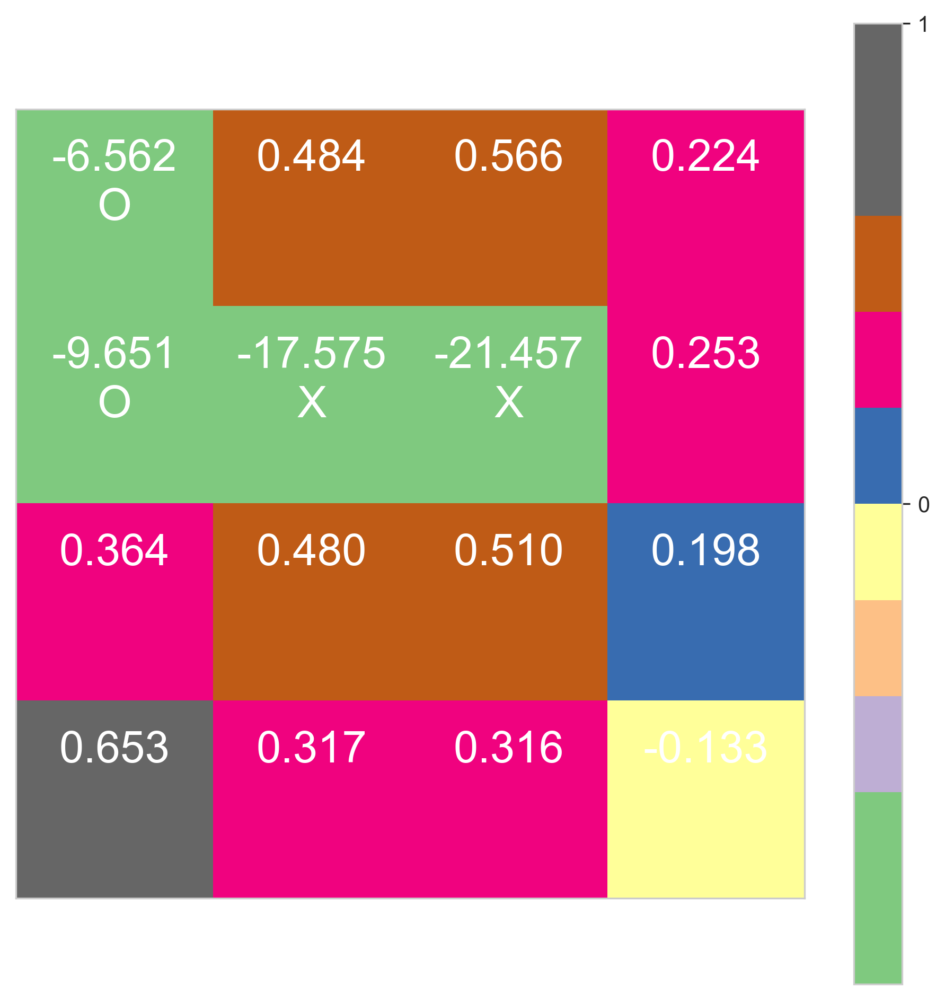

0 (0, 0) -6.562264
1 (0, 1) 0.48388153
2 (0, 2) 0.5663046
3 (0, 3) 0.22358903
4 (1, 0) -9.650569
5 (1, 1) -17.574896
6 (1, 2) -21.456873
7 (1, 3) 0.25300384
8 (2, 0) 0.36433563
9 (2, 1) 0.47964185
10 (2, 2) 0.51038307
11 (2, 3) 0.19757666
12 (3, 0) 0.65280646
13 (3, 1) 0.31717497
14 (3, 2) 0.3155988
15 (3, 3) -0.13315839


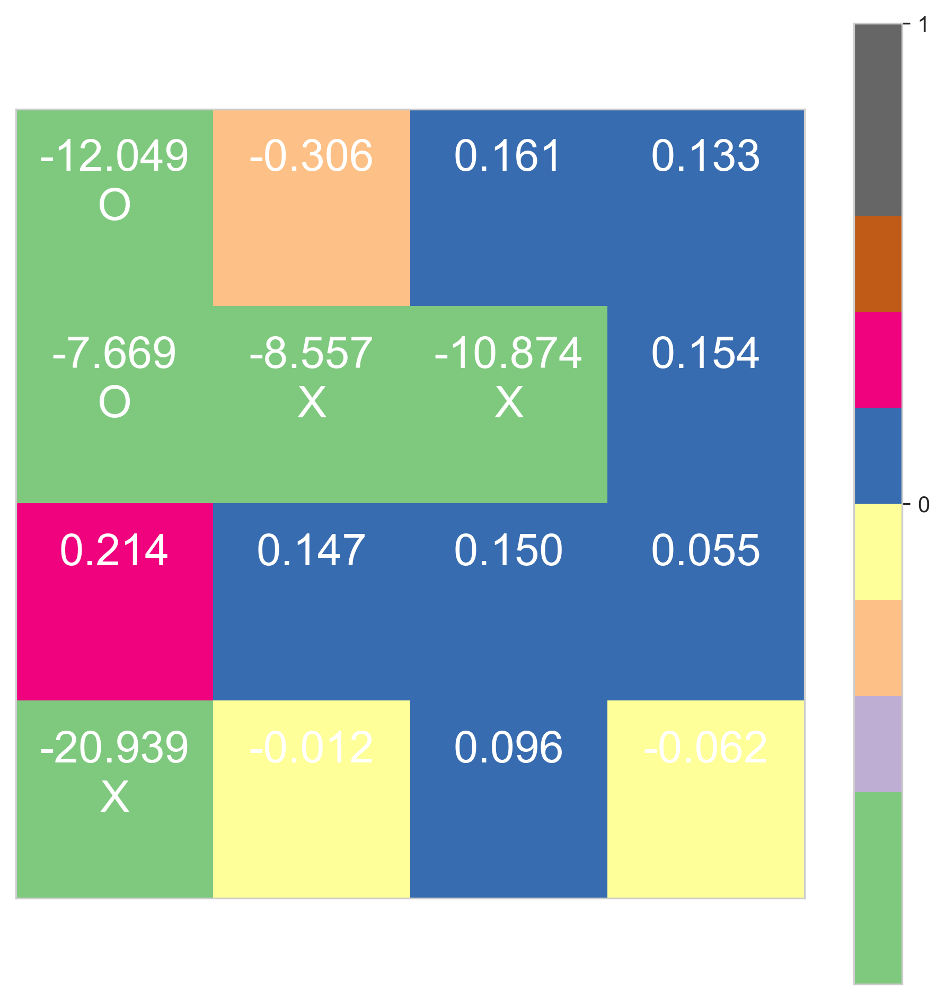

0 (0, 0) -12.048716
1 (0, 1) -0.30604917
2 (0, 2) 0.16081715
3 (0, 3) 0.13302043
4 (1, 0) -7.6687
5 (1, 1) -8.557292
6 (1, 2) -10.874334
7 (1, 3) 0.1539644
8 (2, 0) 0.21401268
9 (2, 1) 0.14696309
10 (2, 2) 0.14982674
11 (2, 3) 0.055197954
12 (3, 0) -20.939177
13 (3, 1) -0.011697829
14 (3, 2) 0.09589726
15 (3, 3) -0.062487066


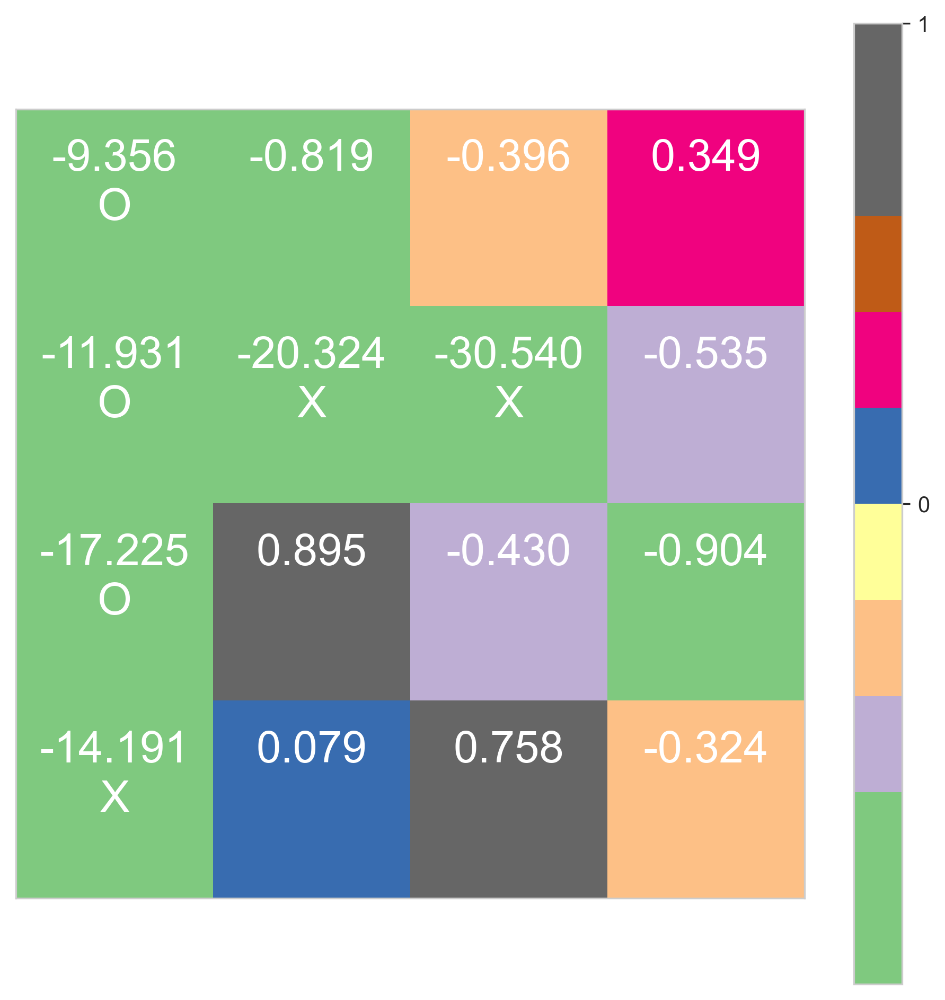

0 (0, 0) -9.356392
1 (0, 1) -0.81851673
2 (0, 2) -0.3961401
3 (0, 3) 0.3486644
4 (1, 0) -11.930502
5 (1, 1) -20.3243
6 (1, 2) -30.539984
7 (1, 3) -0.5347601
8 (2, 0) -17.224617
9 (2, 1) 0.89478594
10 (2, 2) -0.4302932
11 (2, 3) -0.9044351
12 (3, 0) -14.191103
13 (3, 1) 0.07935375
14 (3, 2) 0.7583708
15 (3, 3) -0.32442668


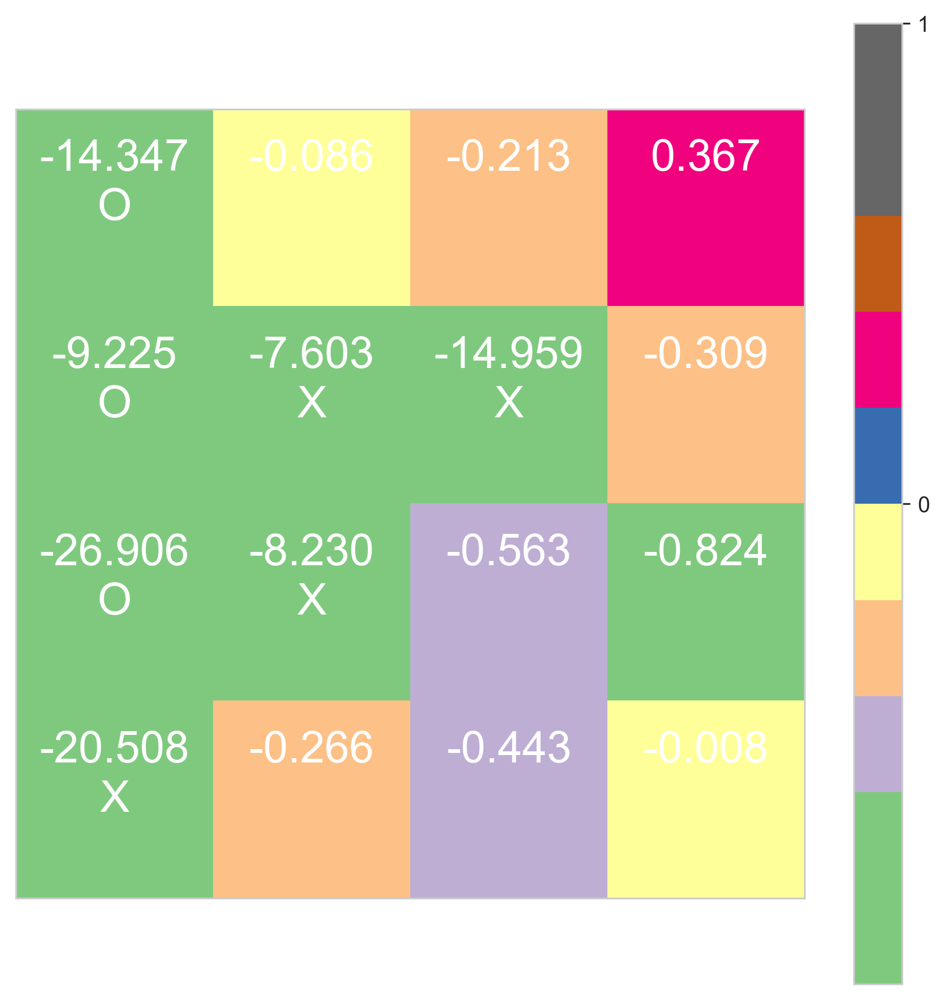

0 (0, 0) -14.346895
1 (0, 1) -0.085936785
2 (0, 2) -0.21288526
3 (0, 3) 0.36719382
4 (1, 0) -9.2252
5 (1, 1) -7.602516
6 (1, 2) -14.959252
7 (1, 3) -0.30934525
8 (2, 0) -26.905779
9 (2, 1) -8.230363
10 (2, 2) -0.5627407
11 (2, 3) -0.82410586
12 (3, 0) -20.508091
13 (3, 1) -0.26576018
14 (3, 2) -0.44313613
15 (3, 3) -0.0075015128


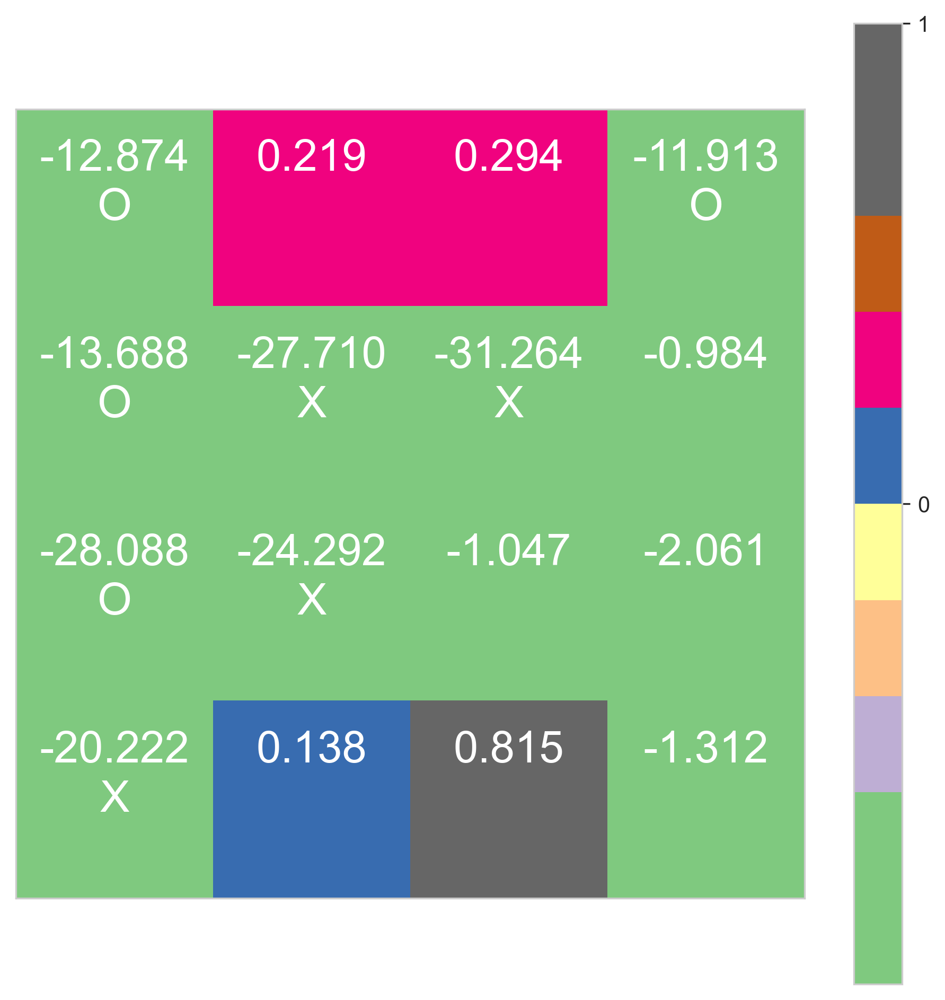

0 (0, 0) -12.873853
1 (0, 1) 0.21914984
2 (0, 2) 0.29415083
3 (0, 3) -11.913145
4 (1, 0) -13.687938
5 (1, 1) -27.710196
6 (1, 2) -31.263754
7 (1, 3) -0.98365504
8 (2, 0) -28.088423
9 (2, 1) -24.291986
10 (2, 2) -1.0473154
11 (2, 3) -2.0606258
12 (3, 0) -20.222214
13 (3, 1) 0.1376169
14 (3, 2) 0.8149467
15 (3, 3) -1.312082


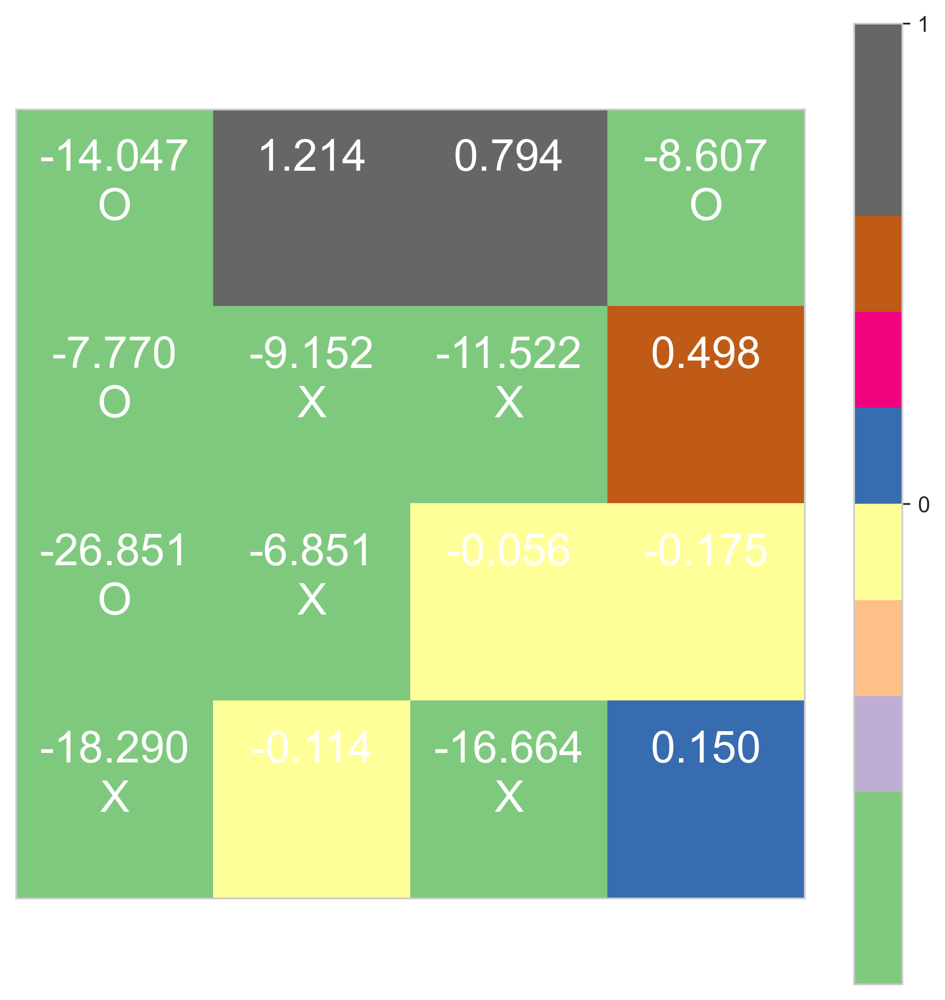

0 (0, 0) -14.047422
1 (0, 1) 1.2141484
2 (0, 2) 0.79387397
3 (0, 3) -8.607382
4 (1, 0) -7.770214
5 (1, 1) -9.151551
6 (1, 2) -11.521653
7 (1, 3) 0.49782777
8 (2, 0) -26.850544
9 (2, 1) -6.850596
10 (2, 2) -0.05621296
11 (2, 3) -0.1752558
12 (3, 0) -18.289911
13 (3, 1) -0.114258885
14 (3, 2) -16.664011
15 (3, 3) 0.14977702


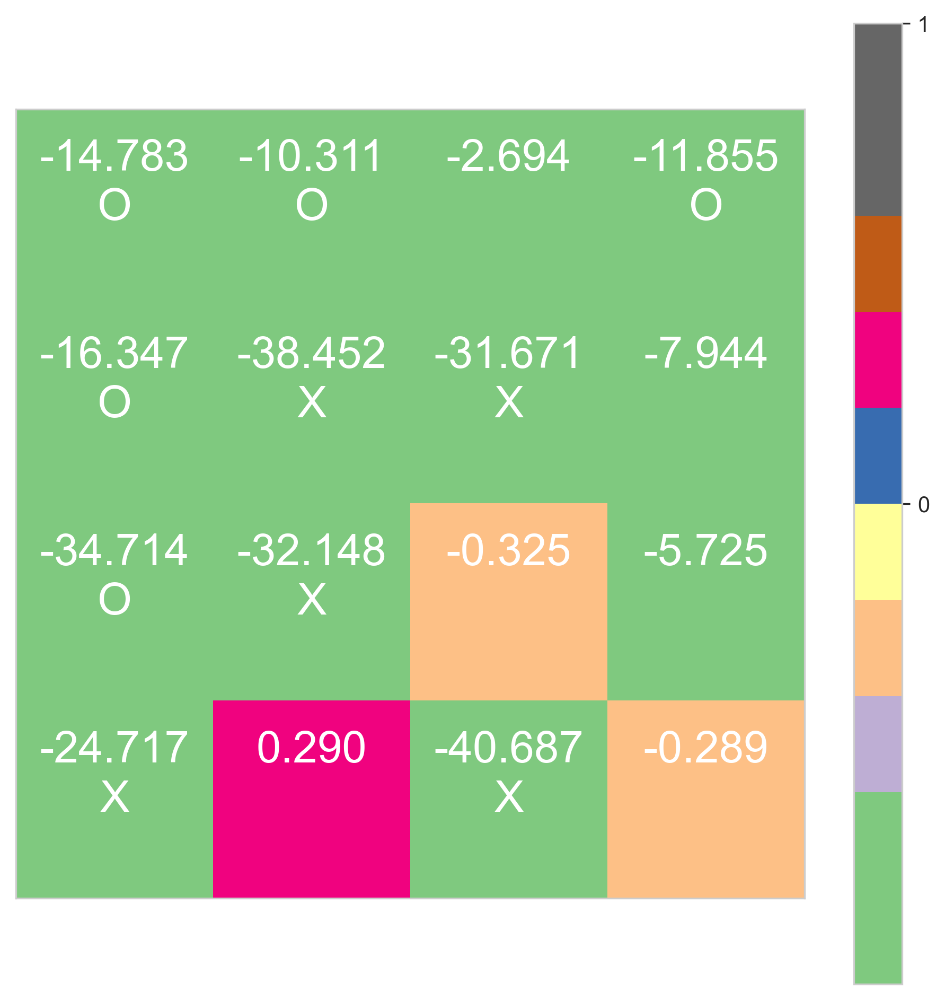

0 (0, 0) -14.782548
1 (0, 1) -10.310928
2 (0, 2) -2.6938834
3 (0, 3) -11.854924
4 (1, 0) -16.347027
5 (1, 1) -38.452175
6 (1, 2) -31.670639
7 (1, 3) -7.9439745
8 (2, 0) -34.71365
9 (2, 1) -32.148487
10 (2, 2) -0.32510358
11 (2, 3) -5.724879
12 (3, 0) -24.71701
13 (3, 1) 0.2896264
14 (3, 2) -40.687195
15 (3, 3) -0.2892114


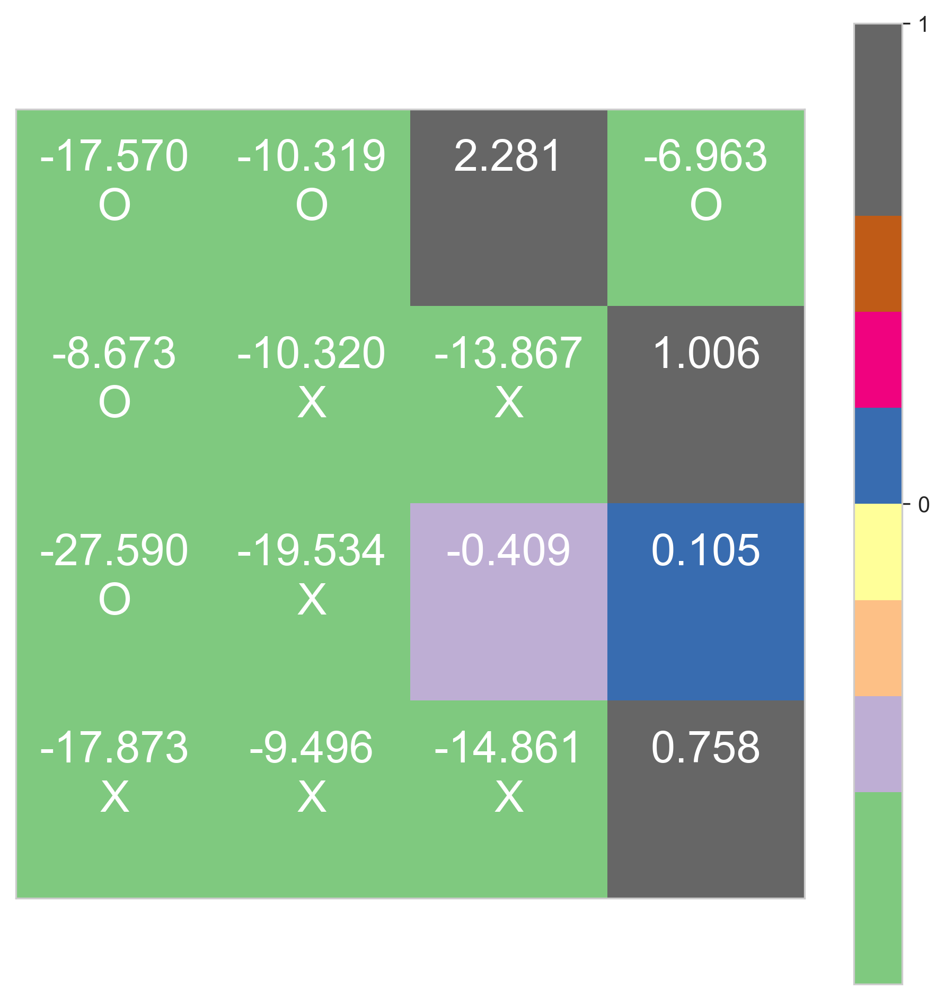

0 (0, 0) -17.569893
1 (0, 1) -10.319466
2 (0, 2) 2.281372
3 (0, 3) -6.9633045
4 (1, 0) -8.67305
5 (1, 1) -10.320401
6 (1, 2) -13.8673935
7 (1, 3) 1.0055406
8 (2, 0) -27.589884
9 (2, 1) -19.534147
10 (2, 2) -0.40864804
11 (2, 3) 0.10541901
12 (3, 0) -17.873484
13 (3, 1) -9.496395
14 (3, 2) -14.860509
15 (3, 3) 0.7577117
РќРѕР»РёРєРё РІС‹РёРіСЂР°Р»Рё!


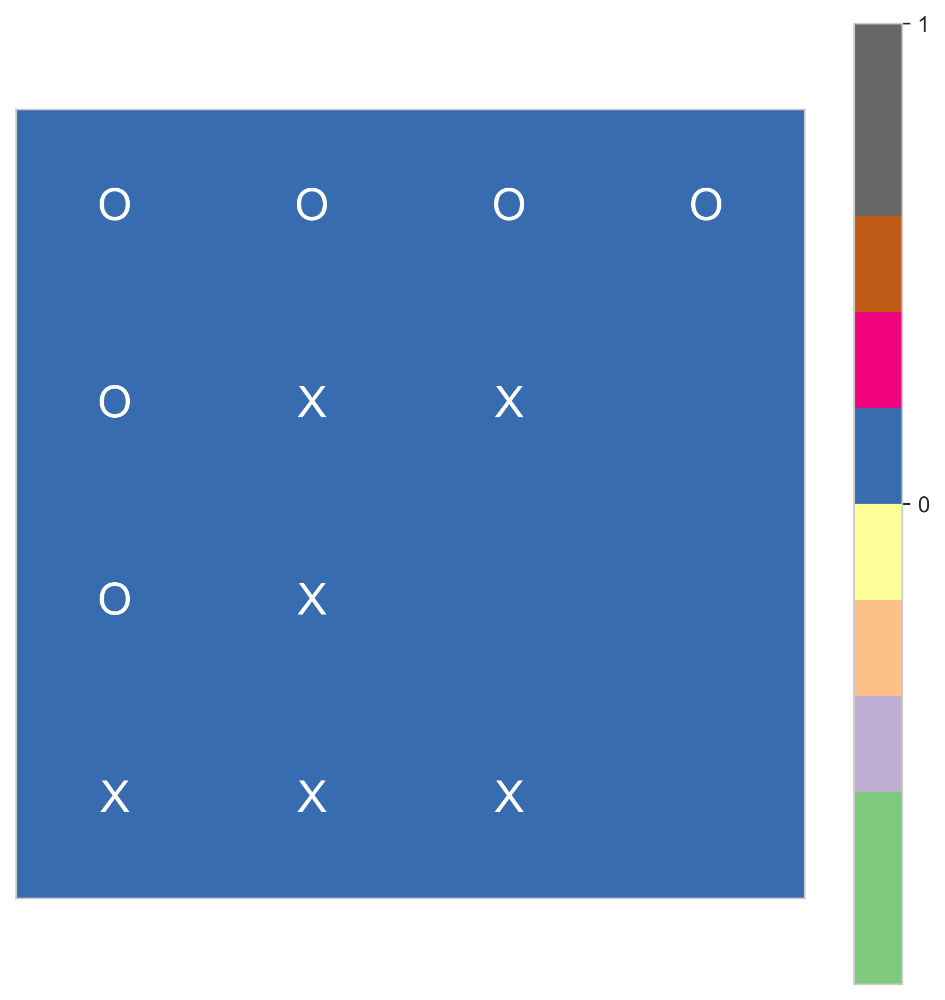

time: 9.96 s


In [83]:
plot_test_game(env, x_model, o_model, random_crosses=False, random_naughts=False, verbose=True, fontx=20)

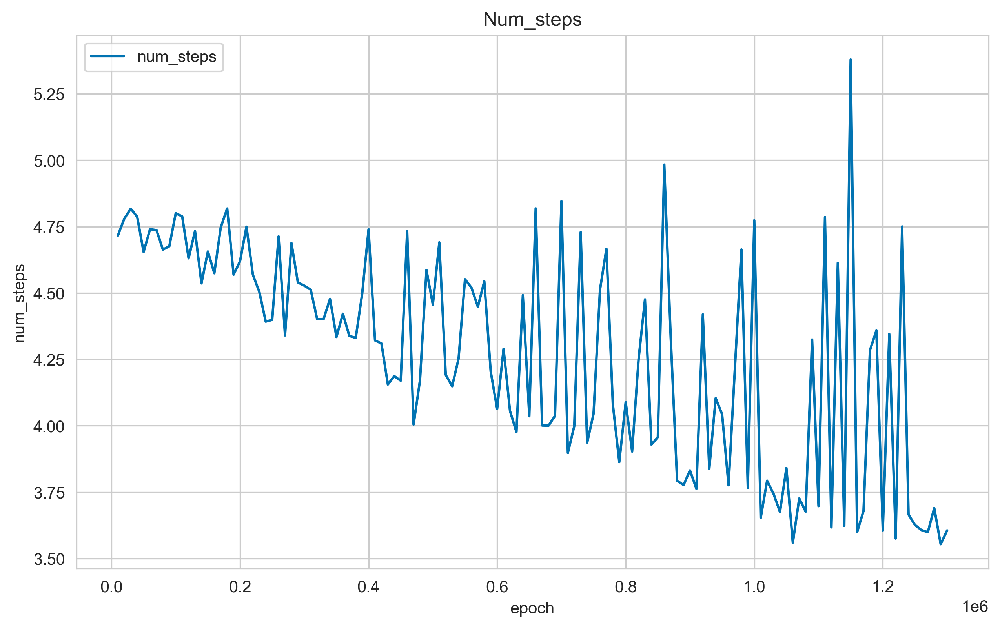

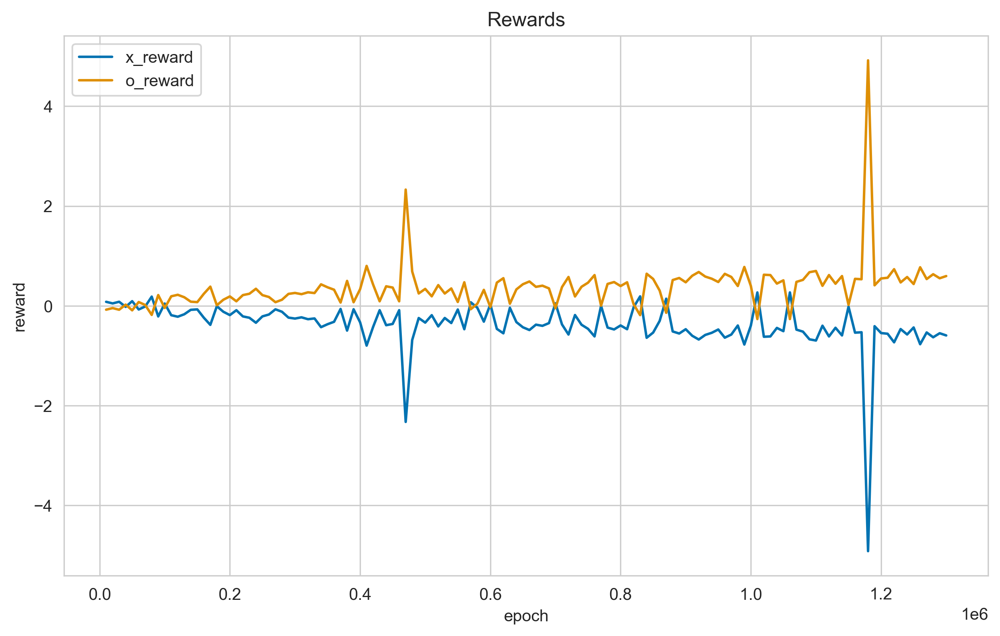

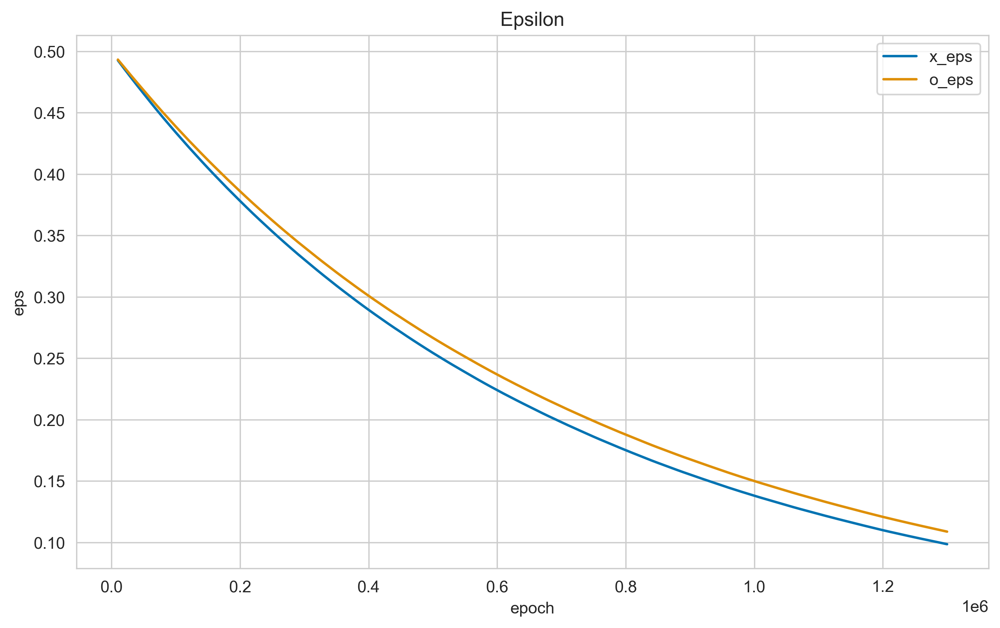


time: 2h 4min 42s


In [84]:
for e in tqdm(range(n_episodes, int(n_episodes*1.3))):
    coordinator.run_episode(do_learning=True, greedy=False, render=False)
    
    if (e + 1) % val_freq == 0:
        clear_output(wait=True)
        coordinator.validate(n_episodes=n_val_episodes)

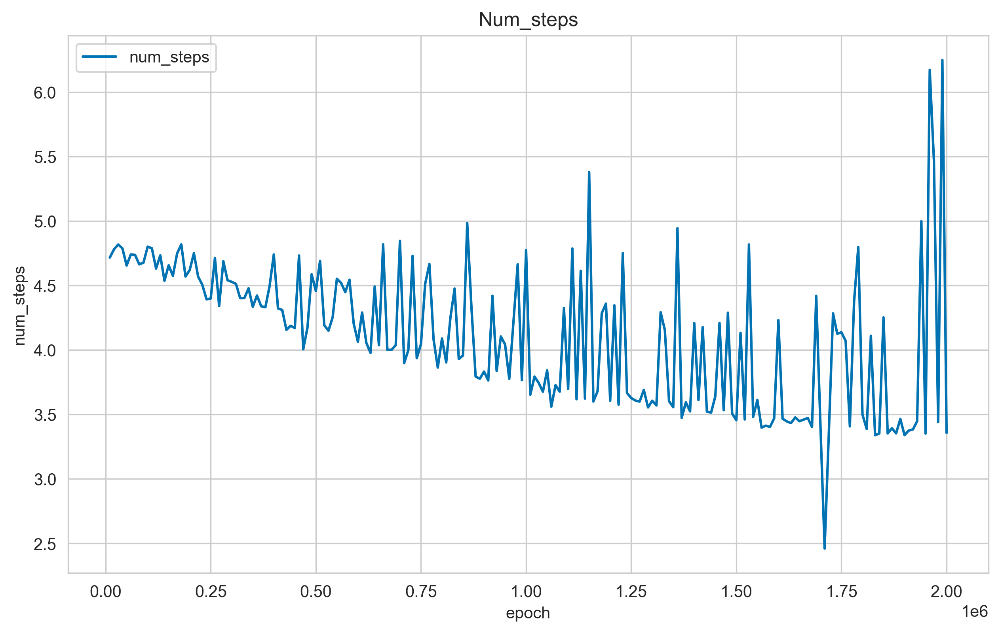

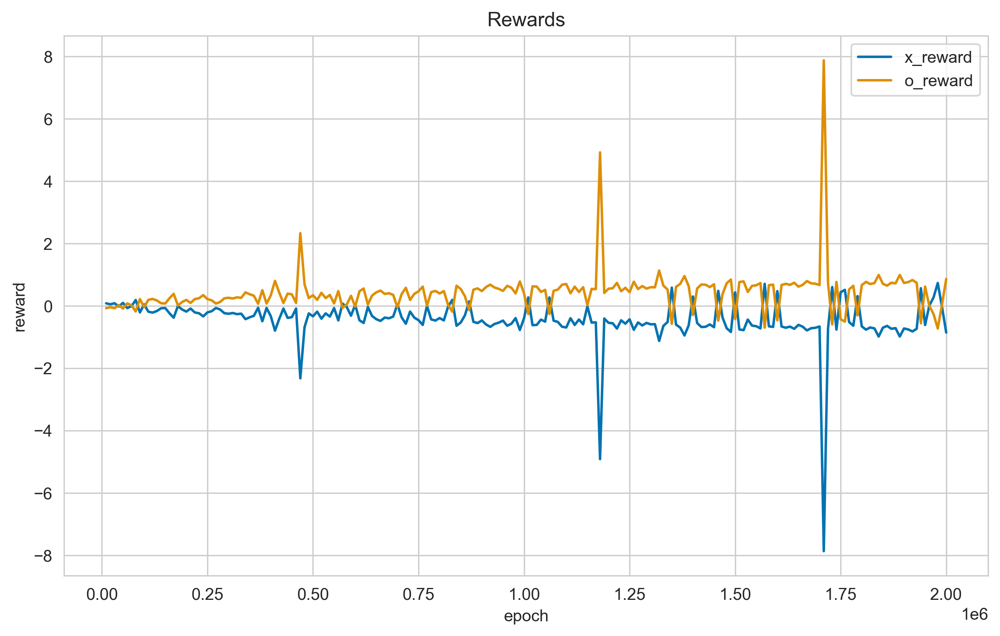

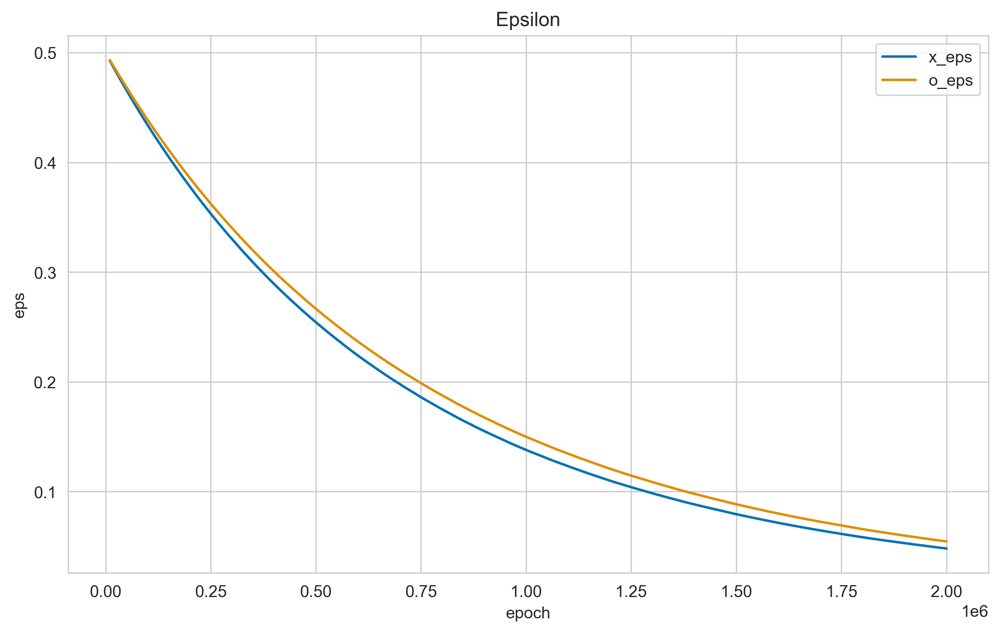


time: 4h 35min 16s


In [85]:
for e in tqdm(range(int(n_episodes*1.3), int(n_episodes*2))):
    coordinator.run_episode(do_learning=True, greedy=False, render=False)
    
    if (e + 1) % val_freq == 0:
        clear_output(wait=True)
        coordinator.validate(n_episodes=n_val_episodes)

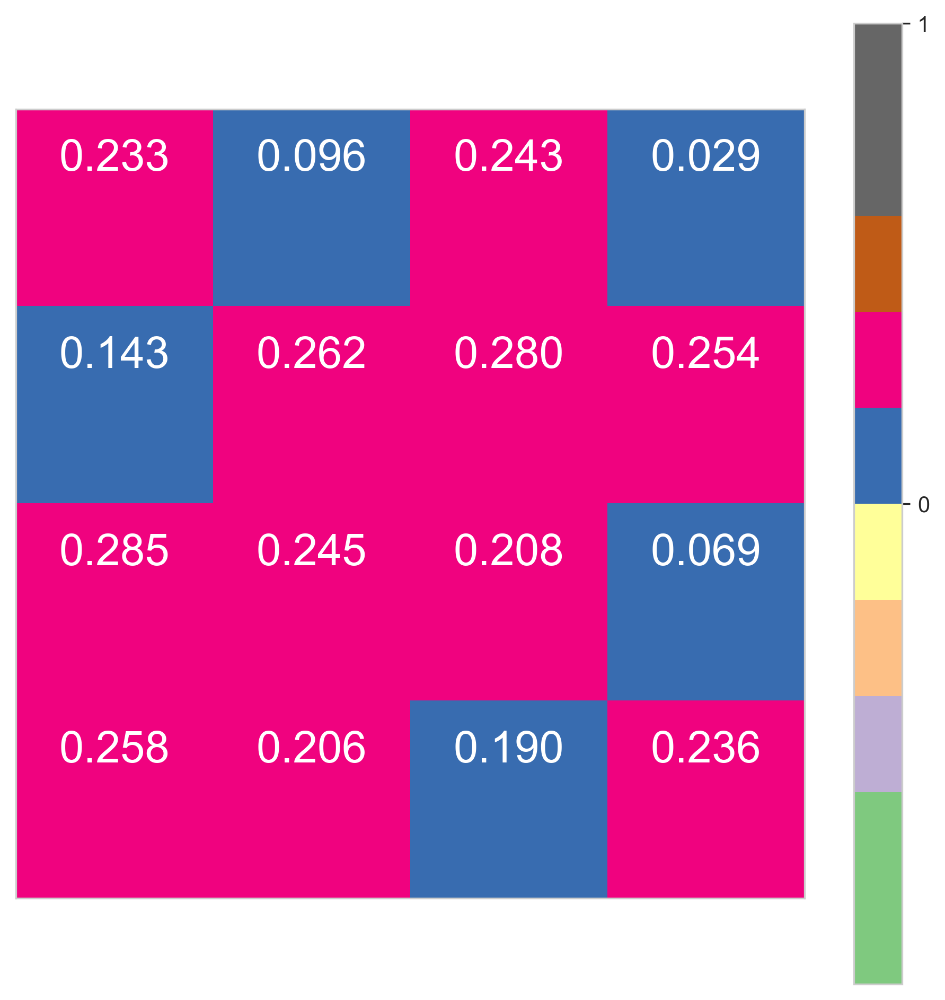

0 (0, 0) 0.23301503
1 (0, 1) 0.09609171
2 (0, 2) 0.2434739
3 (0, 3) 0.028666329
4 (1, 0) 0.14262936
5 (1, 1) 0.26163173
6 (1, 2) 0.2796627
7 (1, 3) 0.2539719
8 (2, 0) 0.2850042
9 (2, 1) 0.24476512
10 (2, 2) 0.20762411
11 (2, 3) 0.06948161
12 (3, 0) 0.25819683
13 (3, 1) 0.20552133
14 (3, 2) 0.18981229
15 (3, 3) 0.23552844


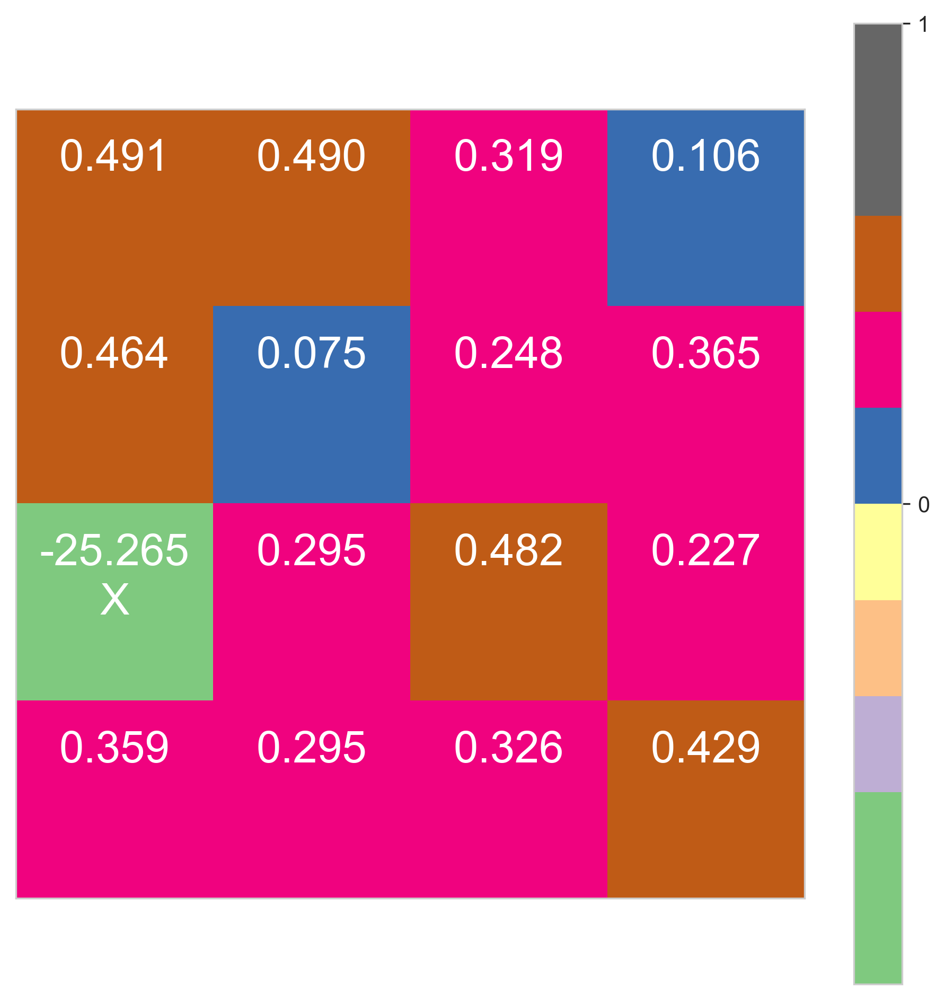

0 (0, 0) 0.4912117
1 (0, 1) 0.48984975
2 (0, 2) 0.31918216
3 (0, 3) 0.10595924
4 (1, 0) 0.46351257
5 (1, 1) 0.07463884
6 (1, 2) 0.24842149
7 (1, 3) 0.36461425
8 (2, 0) -25.264524
9 (2, 1) 0.29548496
10 (2, 2) 0.4821409
11 (2, 3) 0.22708842
12 (3, 0) 0.35936755
13 (3, 1) 0.29501802
14 (3, 2) 0.32613534
15 (3, 3) 0.42865378


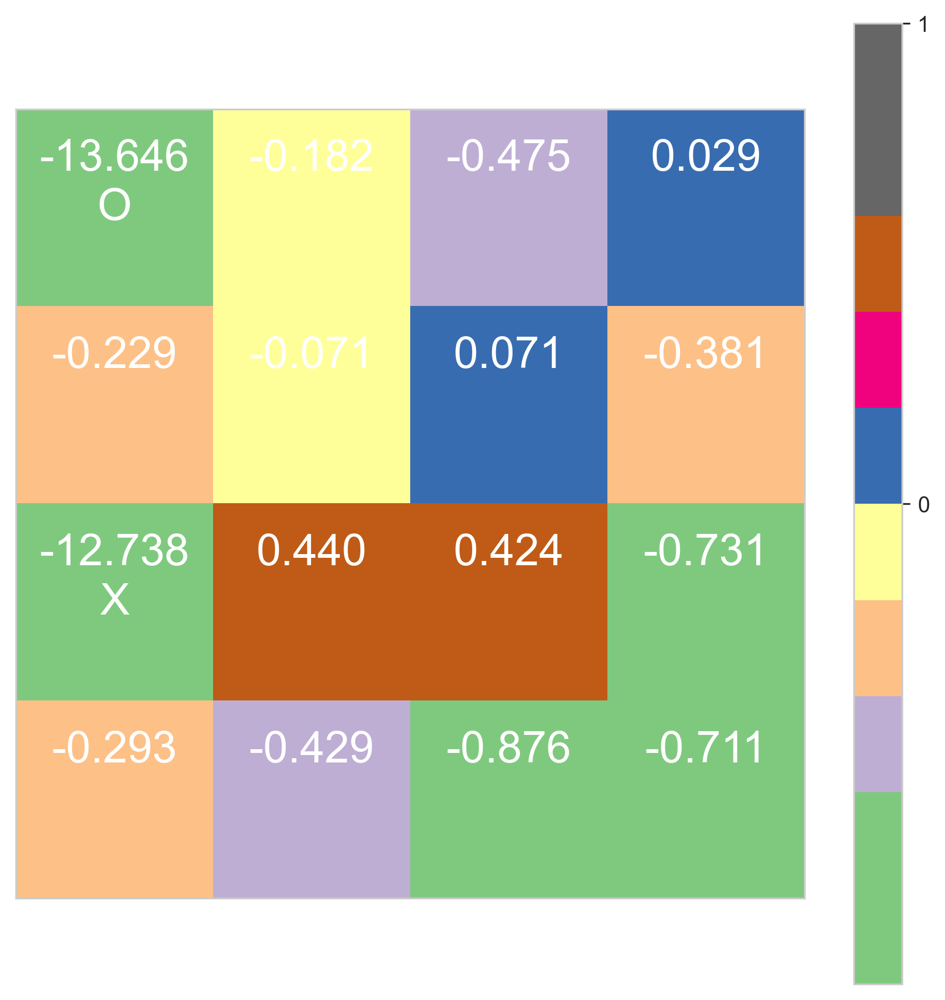

0 (0, 0) -13.645811
1 (0, 1) -0.18159822
2 (0, 2) -0.47495753
3 (0, 3) 0.028780011
4 (1, 0) -0.22862306
5 (1, 1) -0.07146242
6 (1, 2) 0.07143222
7 (1, 3) -0.3812934
8 (2, 0) -12.737614
9 (2, 1) 0.43996924
10 (2, 2) 0.42361644
11 (2, 3) -0.73148036
12 (3, 0) -0.29289967
13 (3, 1) -0.42864758
14 (3, 2) -0.8757243
15 (3, 3) -0.71144235


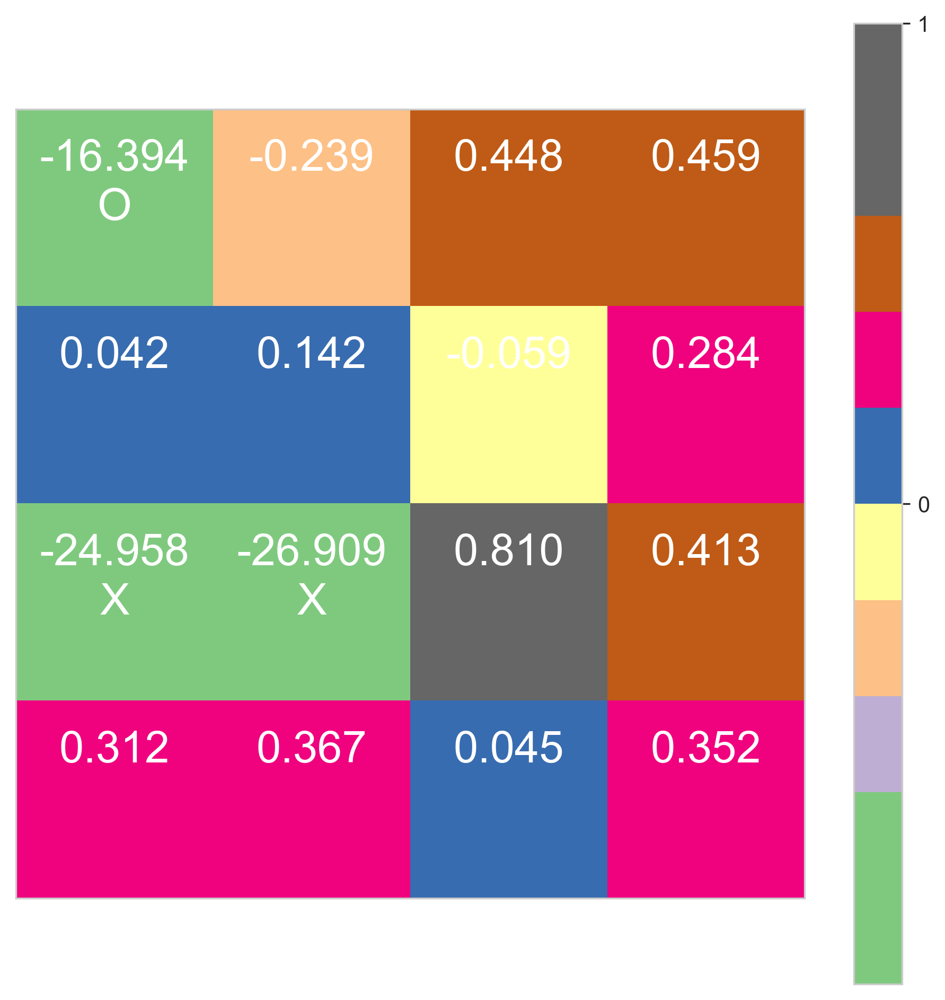

0 (0, 0) -16.393682
1 (0, 1) -0.23859632
2 (0, 2) 0.44813782
3 (0, 3) 0.4591143
4 (1, 0) 0.042339295
5 (1, 1) 0.14175564
6 (1, 2) -0.05858034
7 (1, 3) 0.28407174
8 (2, 0) -24.957966
9 (2, 1) -26.90888
10 (2, 2) 0.8100126
11 (2, 3) 0.41345212
12 (3, 0) 0.31199524
13 (3, 1) 0.36650956
14 (3, 2) 0.045206487
15 (3, 3) 0.35222316


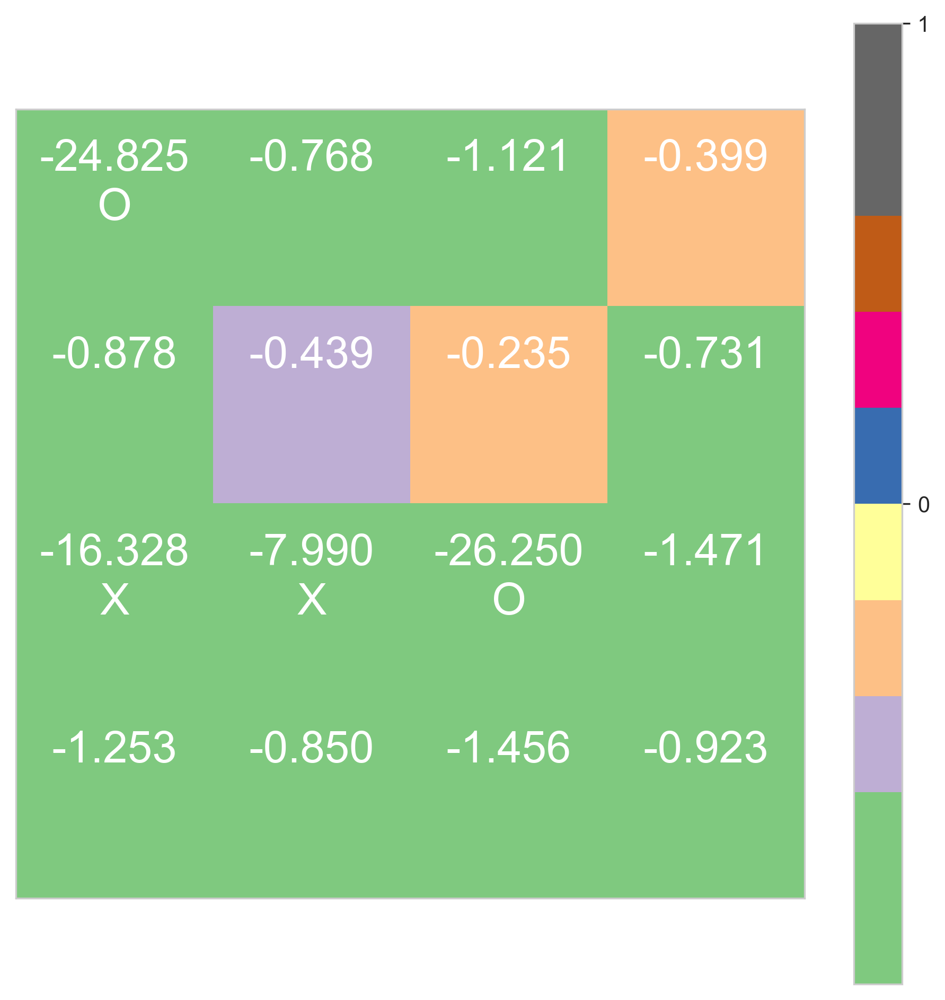

0 (0, 0) -24.824522
1 (0, 1) -0.76829773
2 (0, 2) -1.1206429
3 (0, 3) -0.39889508
4 (1, 0) -0.8778765
5 (1, 1) -0.43932414
6 (1, 2) -0.23505542
7 (1, 3) -0.7306099
8 (2, 0) -16.327957
9 (2, 1) -7.9900055
10 (2, 2) -26.24984
11 (2, 3) -1.4709734
12 (3, 0) -1.2531539
13 (3, 1) -0.8495635
14 (3, 2) -1.4555502
15 (3, 3) -0.9231261


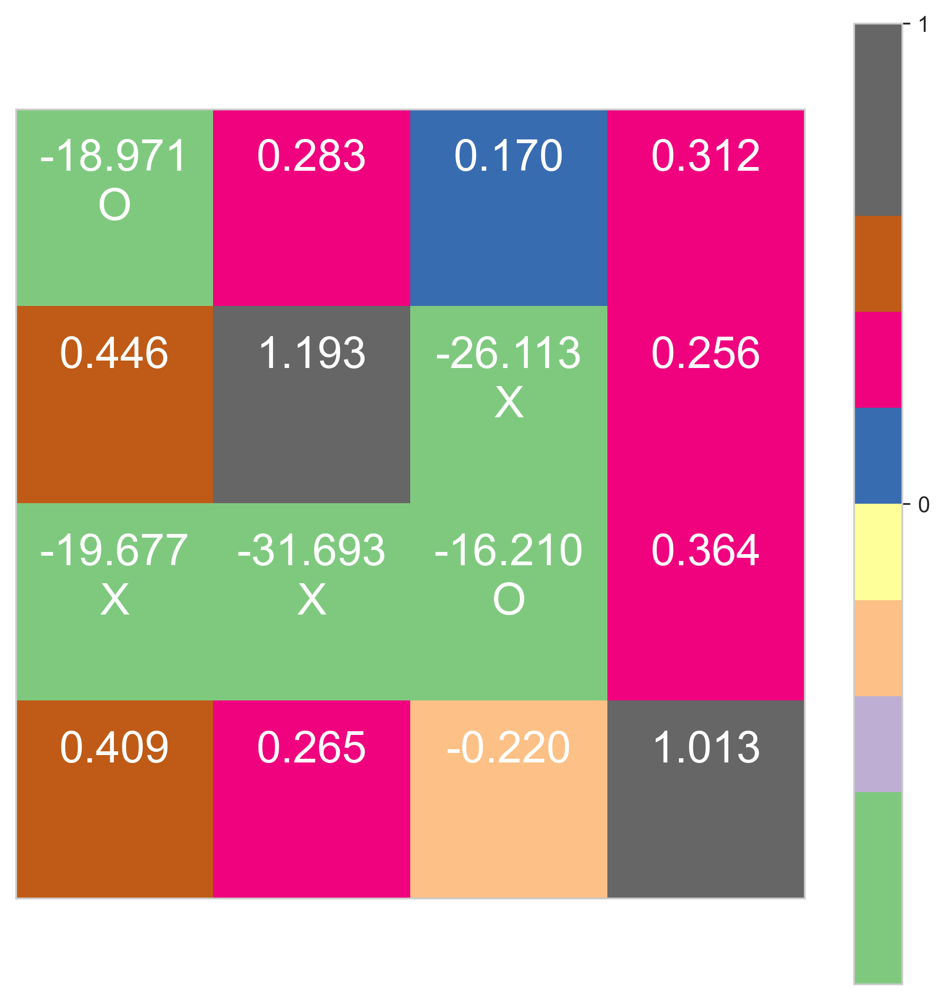

0 (0, 0) -18.970774
1 (0, 1) 0.28281668
2 (0, 2) 0.17013726
3 (0, 3) 0.31185645
4 (1, 0) 0.4461518
5 (1, 1) 1.1934012
6 (1, 2) -26.113026
7 (1, 3) 0.25567967
8 (2, 0) -19.677212
9 (2, 1) -31.692785
10 (2, 2) -16.210052
11 (2, 3) 0.36443126
12 (3, 0) 0.4086412
13 (3, 1) 0.2654876
14 (3, 2) -0.21999931
15 (3, 3) 1.0125451


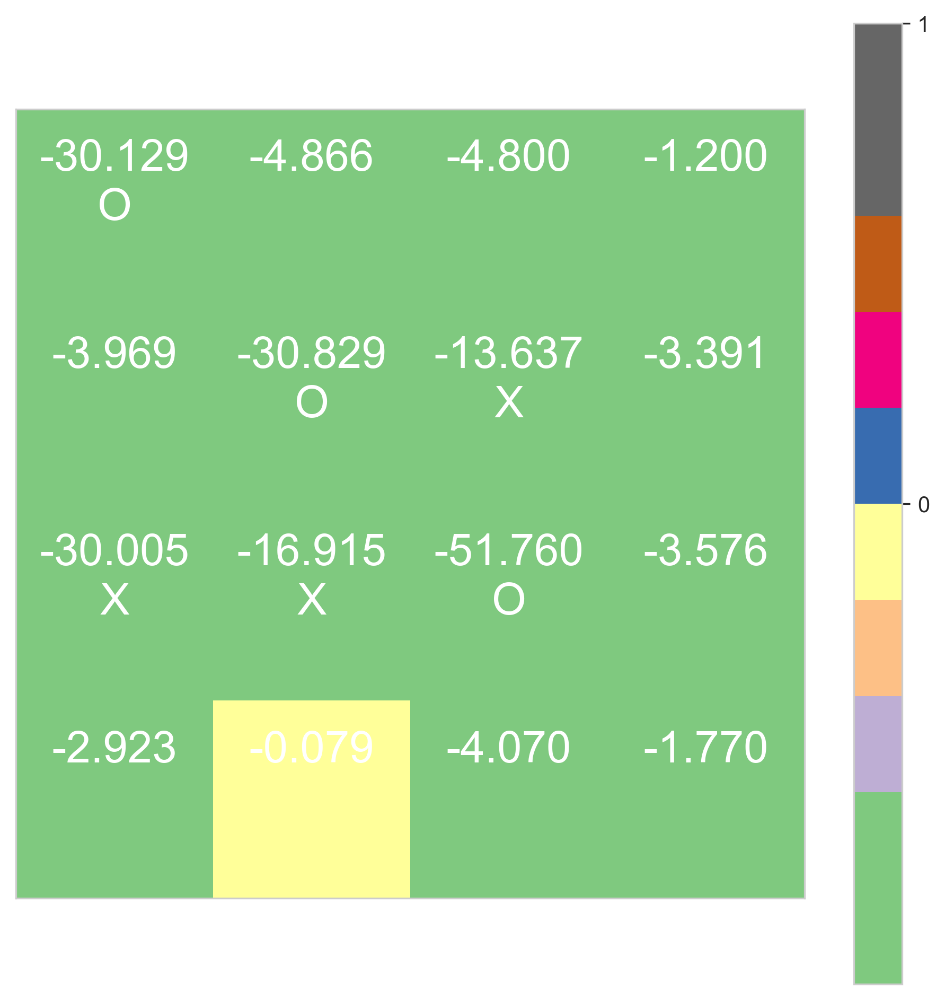

0 (0, 0) -30.129177
1 (0, 1) -4.866429
2 (0, 2) -4.8002944
3 (0, 3) -1.1997844
4 (1, 0) -3.9693
5 (1, 1) -30.828516
6 (1, 2) -13.637274
7 (1, 3) -3.3913732
8 (2, 0) -30.004622
9 (2, 1) -16.915129
10 (2, 2) -51.76014
11 (2, 3) -3.5755434
12 (3, 0) -2.9232366
13 (3, 1) -0.079059795
14 (3, 2) -4.070344
15 (3, 3) -1.769788


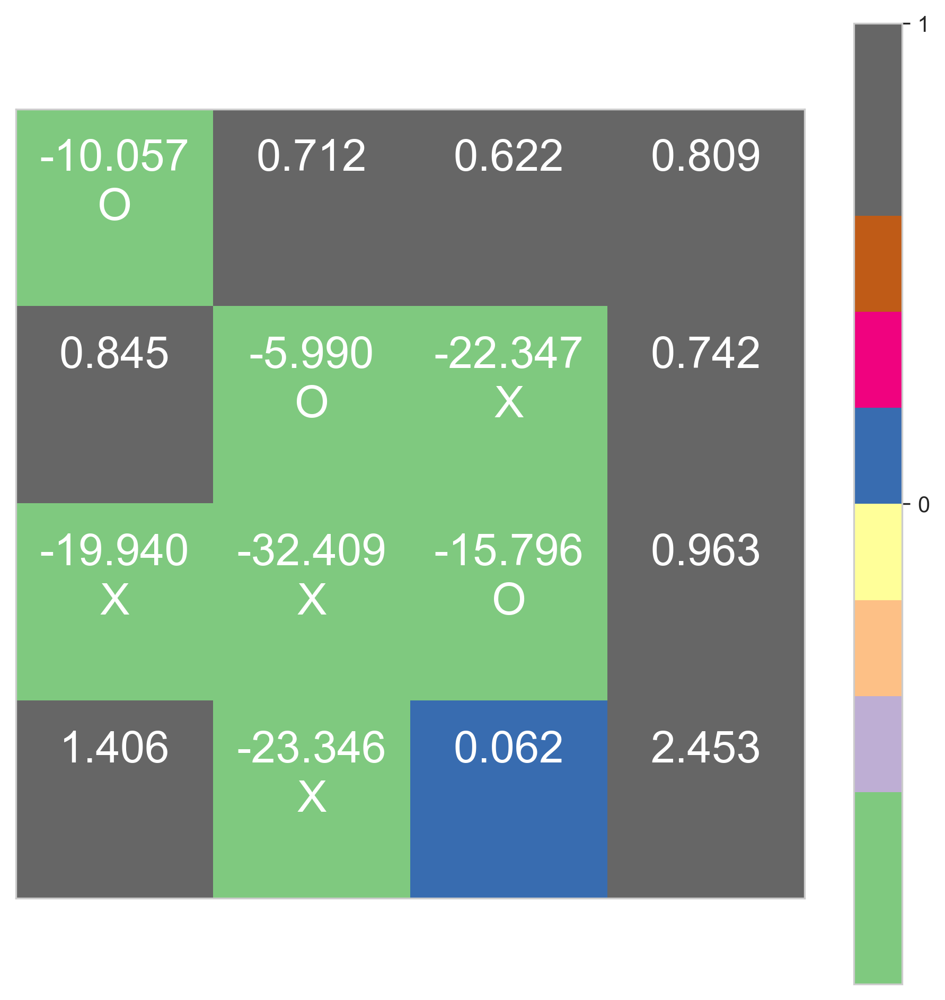

0 (0, 0) -10.057352
1 (0, 1) 0.7119989
2 (0, 2) 0.6223269
3 (0, 3) 0.8089268
4 (1, 0) 0.84512424
5 (1, 1) -5.989832
6 (1, 2) -22.346756
7 (1, 3) 0.74240184
8 (2, 0) -19.940313
9 (2, 1) -32.40861
10 (2, 2) -15.795634
11 (2, 3) 0.9627512
12 (3, 0) 1.4056386
13 (3, 1) -23.34578
14 (3, 2) 0.06152886
15 (3, 3) 2.4526124
РќРѕР»РёРєРё РІС‹РёРіСЂР°Р»Рё!


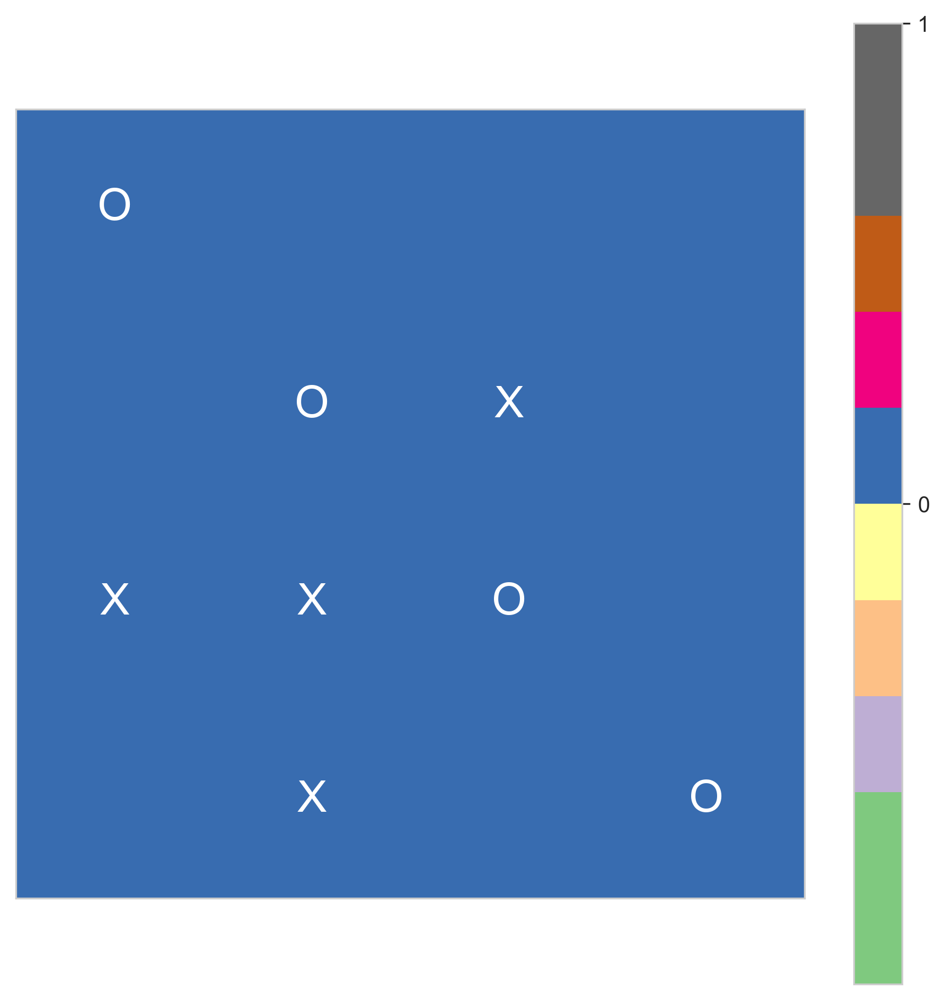

time: 7.91 s


In [86]:
plot_test_game(env, x_model, o_model, random_crosses=False, random_naughts=False, verbose=True, fontx=20)

In [89]:
dqn_x_model = x_model
dqn_o_model = o_model
dqn_coordinator = coordinator

time: 36.2 ms


**Вывод:**

Если честно, мне не понятно, что можно считать "успехом", когда модели учаться играть друг против друга. Наверное то, что они сходятся к ничейной стратегии. При этом иногда возможны смены лидера, когда соперник начинает понимать, как обыгрывать выйгрышную стратегию текущего лидера. 

Примерно это и наблюдается с поправкой на то, что нолики нашли уверенную стратегию победителя, а у крестиков получилась довольно кривая стратегия, не оставляющая шансов на победу. Почему крестики играют так странно для меня осталось загадкой.

## Задание 4
Реализуйте Double DQN и/или Dueling DQN.

In [121]:
import copy

class DoubleDQNAgent(DQNAgent):
    """ Agent, which fit policy by DoubleDQN. """
    
    def __init__(
        self, 
        actions_list: typing.List[typing.Tuple[int, int]], n_cols: int, n_rows: int,
        alpha: float = 1e-3, gamma: float = 1.0,
        eps_init: float = 0.9, eps_final: float = 0.01, eps_decay: int = 1000,
        memory_capacity: int = 10000, batch_size: int = 64, hid_size: int = 64,
        clone_sync_freq: int = 10000,
    ):
        super().__init__(
            n_cols=n_cols, n_rows=n_rows,
            memory_capacity=memory_capacity, batch_size=batch_size, hid_size=hid_size,
            actions_list=actions_list, alpha=alpha, gamma=gamma,
            eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
        )
        self.clone_sync_freq = clone_sync_freq
        self.clone_model = copy.deepcopy(self.model)
    
    def update(self, s, a, r, next_s, is_done):
        if (self.num_step + 1) % self.clone_sync_freq == 0:
            self.clone_model = copy.deepcopy(self.model)
            
        super().update(s=s, a=a, r=r, next_s=next_s, is_done=is_done)
        
    def compute_td_loss(self, states: torch.tensor, actions: torch.tensor, rewards: torch.tensor, next_states):
        # get q-values for all actions in current states
        predicted_qvalues = self.model(states)

        # select q-values for chosen actions
        predicted_qvalues_for_actions = torch.sum(predicted_qvalues * to_one_hot(actions, self.n_actions), dim=1)  # shape: [batch_size]

        # compute q-values for all actions in next states
        predicted_next_qvalues = self.clone_model(next_states).detach()

        # compute V*(next_states) using predicted next q-values
        next_state_values = torch.max(predicted_next_qvalues, dim=1)[0]
        assert next_state_values.dtype == torch.float32

        # compute "target q-values" for loss
        rewards = rewards.flatten()
        target_qvalues_for_actions = rewards + self.gamma*next_state_values
        
        # mean squared error loss to minimize (don't forget to .detach())
        loss = F.smooth_l1_loss(predicted_qvalues_for_actions, target_qvalues_for_actions)

        return loss

time: 32.7 ms


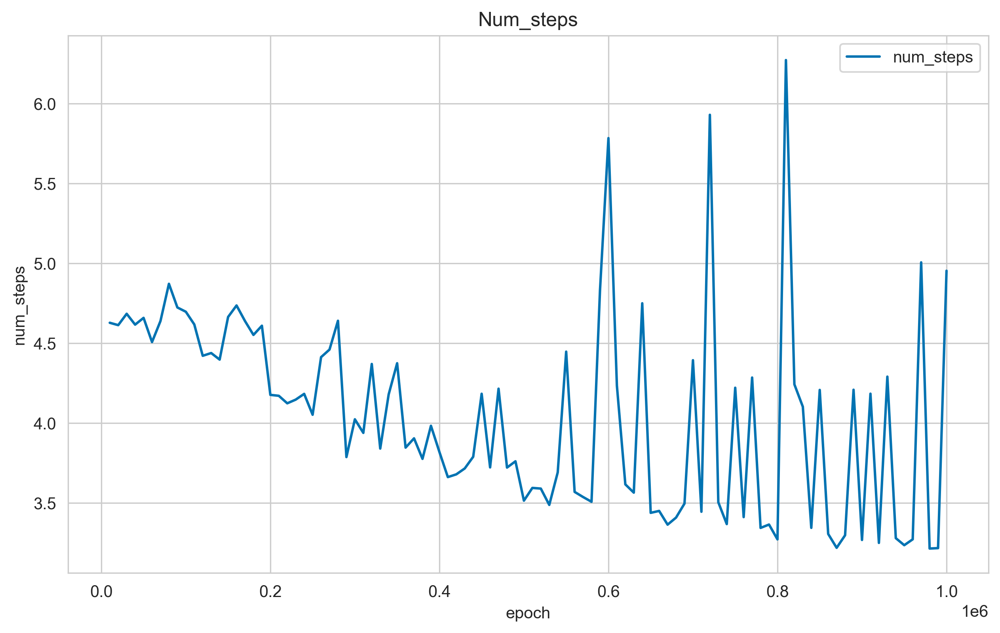

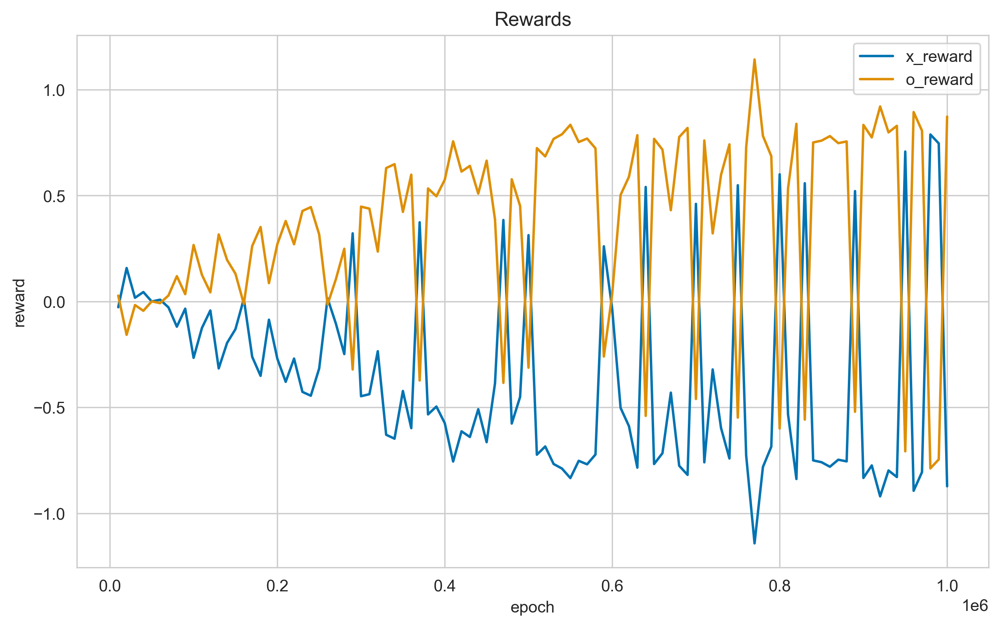

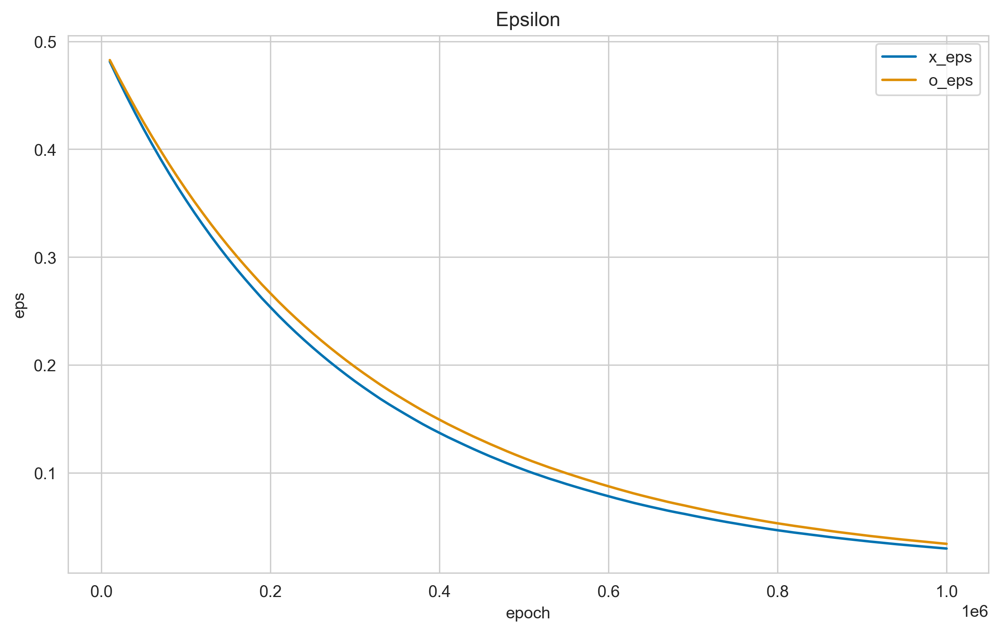


time: 7h 4min 17s


In [95]:
n_rows = 4
n_cols = 4
n_win = 4

n_episodes = int(1e6)
val_freq = int(1e4)
n_val_episodes = int(1e4)

actions_list = [(i, j) for i in range(n_rows) for j in range(n_cols)]
alpha = 1e-3
gamma = 0.6

eps_init = 0.5
eps_final = 0.01
eps_decay = 8e5 * 2

memory_capacity = 30000
batch_size = 64
hid_size = 64

clone_sync_freq = 5000


env = TicTacToe(n_rows=n_rows, n_cols=n_cols, n_win=n_win)
x_model = DoubleDQNAgent(
    n_cols=n_cols, n_rows=n_rows,
    memory_capacity=memory_capacity, batch_size=batch_size, hid_size=hid_size,
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
    clone_sync_freq=clone_sync_freq,
)
o_model = DoubleDQNAgent(
    n_cols=n_cols, n_rows=n_rows,
    memory_capacity=memory_capacity, batch_size=batch_size, hid_size=hid_size,
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
    clone_sync_freq=clone_sync_freq,
)
coordinator = TicTacToeCoordinator(env=env, x_model=x_model, o_model=o_model)

for e in tqdm(range(n_episodes)):
    coordinator.run_episode(do_learning=True, greedy=False, render=False)
    
    if (e + 1) % val_freq == 0:
        clear_output(wait=True)
        coordinator.validate(n_episodes=n_val_episodes)

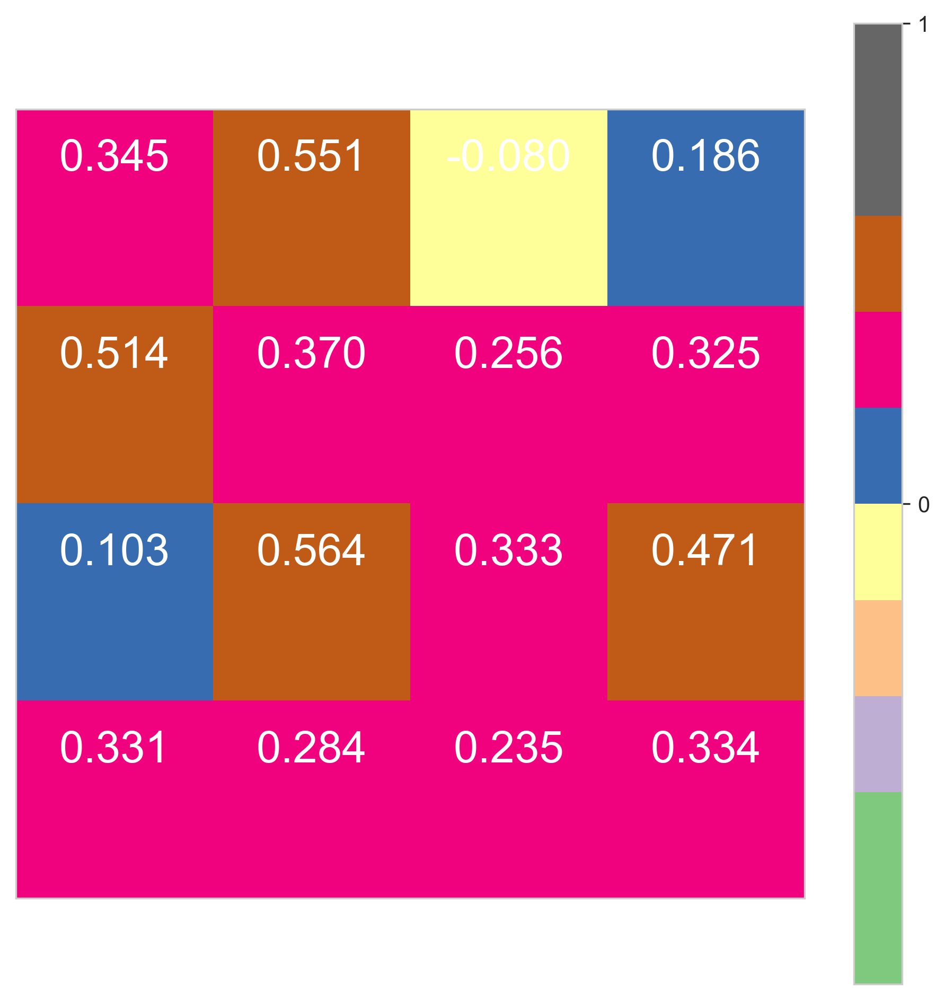

0 (0, 0) 0.34504548
1 (0, 1) 0.5512709
2 (0, 2) -0.08015843
3 (0, 3) 0.18571201
4 (1, 0) 0.51433814
5 (1, 1) 0.3704689
6 (1, 2) 0.25601652
7 (1, 3) 0.32543144
8 (2, 0) 0.10335716
9 (2, 1) 0.5641746
10 (2, 2) 0.33339903
11 (2, 3) 0.47057796
12 (3, 0) 0.33074185
13 (3, 1) 0.2837302
14 (3, 2) 0.2352282
15 (3, 3) 0.33440495


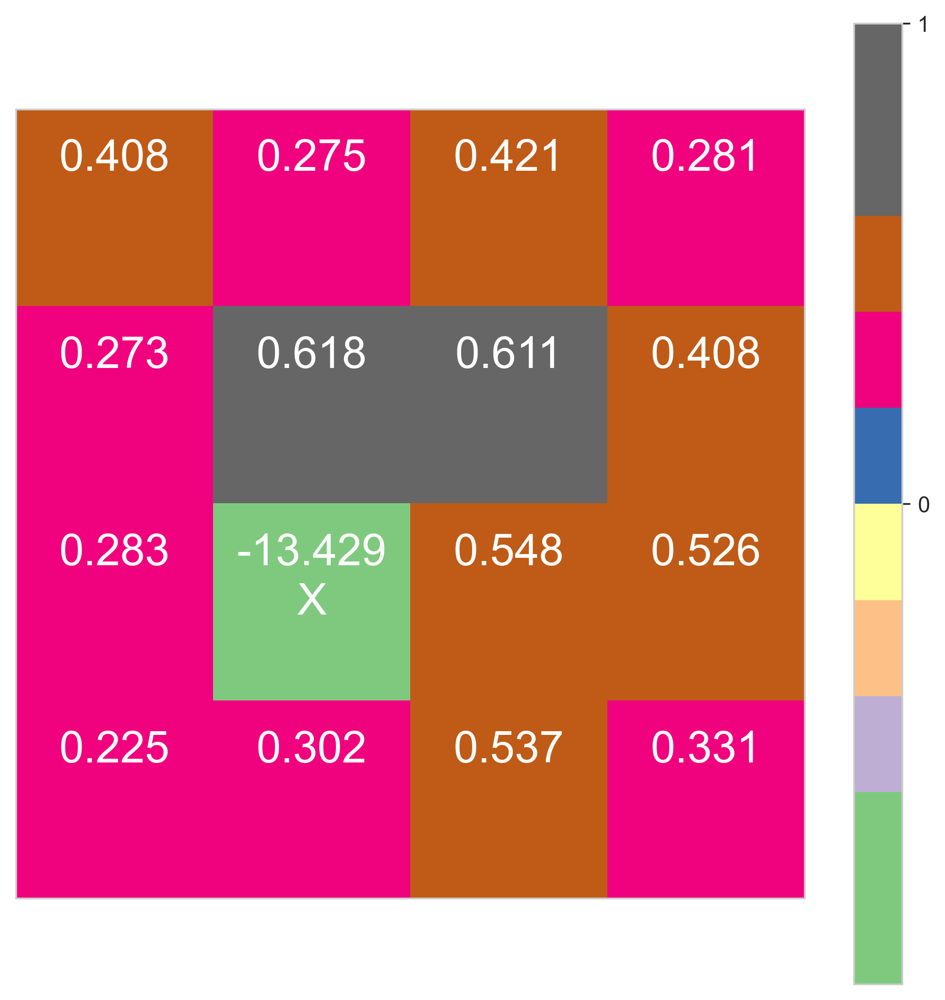

0 (0, 0) 0.40794957
1 (0, 1) 0.27480367
2 (0, 2) 0.4209836
3 (0, 3) 0.2809134
4 (1, 0) 0.2732254
5 (1, 1) 0.6178719
6 (1, 2) 0.6109477
7 (1, 3) 0.40790904
8 (2, 0) 0.28327215
9 (2, 1) -13.42871
10 (2, 2) 0.5480222
11 (2, 3) 0.5259329
12 (3, 0) 0.22514684
13 (3, 1) 0.30211195
14 (3, 2) 0.53736097
15 (3, 3) 0.3314807


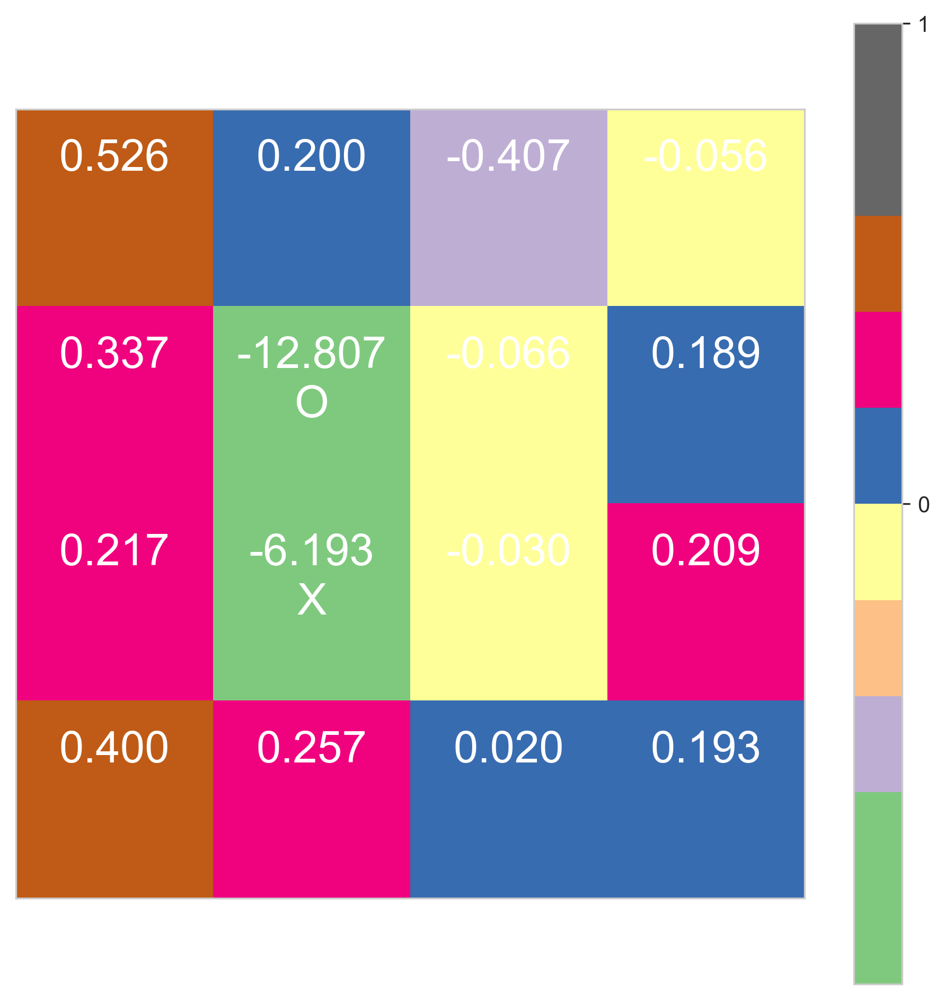

0 (0, 0) 0.5262299
1 (0, 1) 0.1999732
2 (0, 2) -0.40686882
3 (0, 3) -0.055774435
4 (1, 0) 0.3369142
5 (1, 1) -12.806826
6 (1, 2) -0.06557569
7 (1, 3) 0.18931895
8 (2, 0) 0.21657056
9 (2, 1) -6.1925864
10 (2, 2) -0.029726595
11 (2, 3) 0.20917806
12 (3, 0) 0.40048474
13 (3, 1) 0.25657946
14 (3, 2) 0.01993525
15 (3, 3) 0.19311248


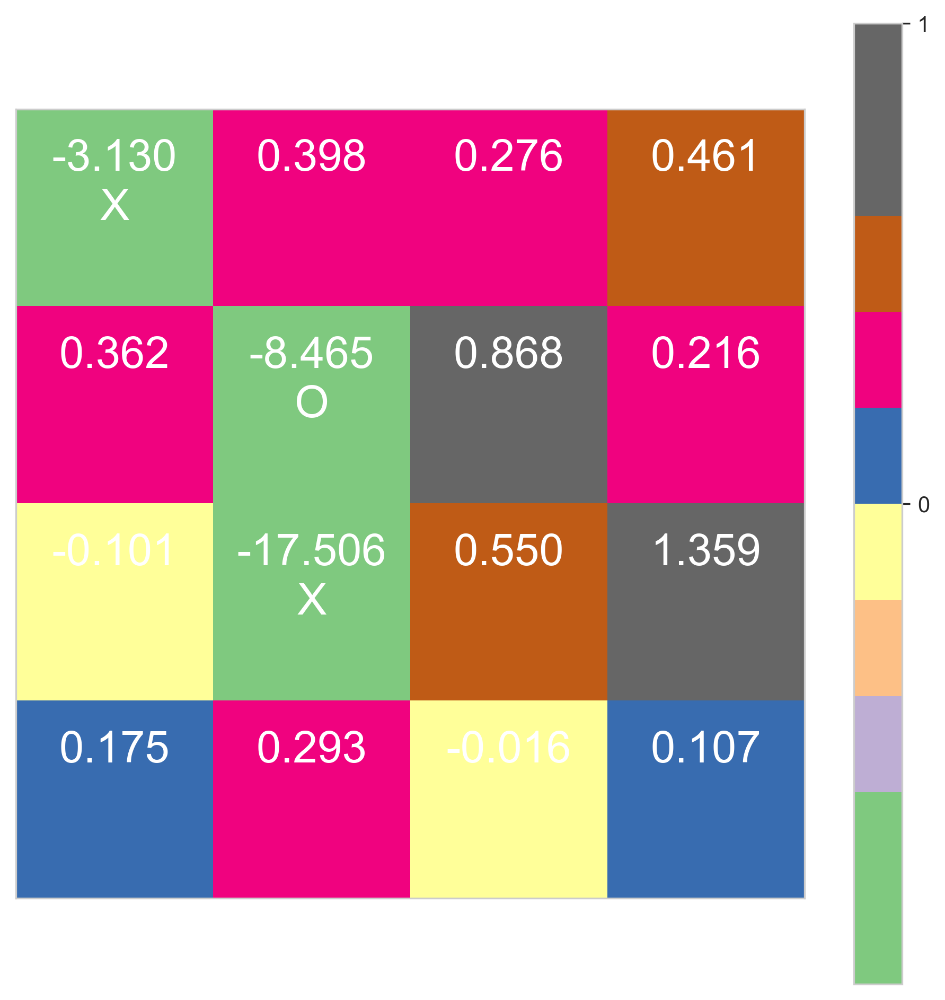

0 (0, 0) -3.129919
1 (0, 1) 0.398107
2 (0, 2) 0.27565372
3 (0, 3) 0.46064052
4 (1, 0) 0.36218065
5 (1, 1) -8.464506
6 (1, 2) 0.8678781
7 (1, 3) 0.21610442
8 (2, 0) -0.101047695
9 (2, 1) -17.506496
10 (2, 2) 0.5497914
11 (2, 3) 1.3593268
12 (3, 0) 0.17470382
13 (3, 1) 0.29329368
14 (3, 2) -0.015663862
15 (3, 3) 0.106794655


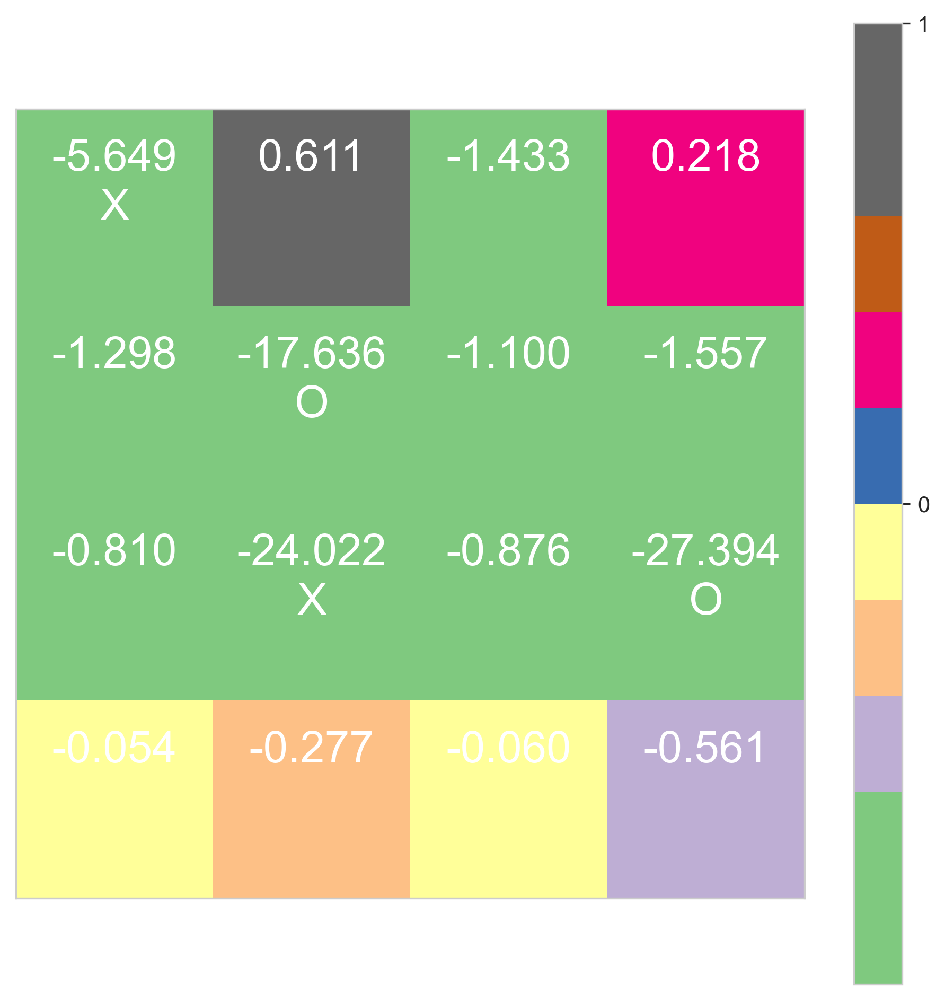

0 (0, 0) -5.649412
1 (0, 1) 0.6108385
2 (0, 2) -1.4325265
3 (0, 3) 0.21755633
4 (1, 0) -1.2975326
5 (1, 1) -17.636093
6 (1, 2) -1.0997235
7 (1, 3) -1.556879
8 (2, 0) -0.8097443
9 (2, 1) -24.022144
10 (2, 2) -0.8761325
11 (2, 3) -27.393852
12 (3, 0) -0.054274052
13 (3, 1) -0.27725422
14 (3, 2) -0.059525415
15 (3, 3) -0.5609391


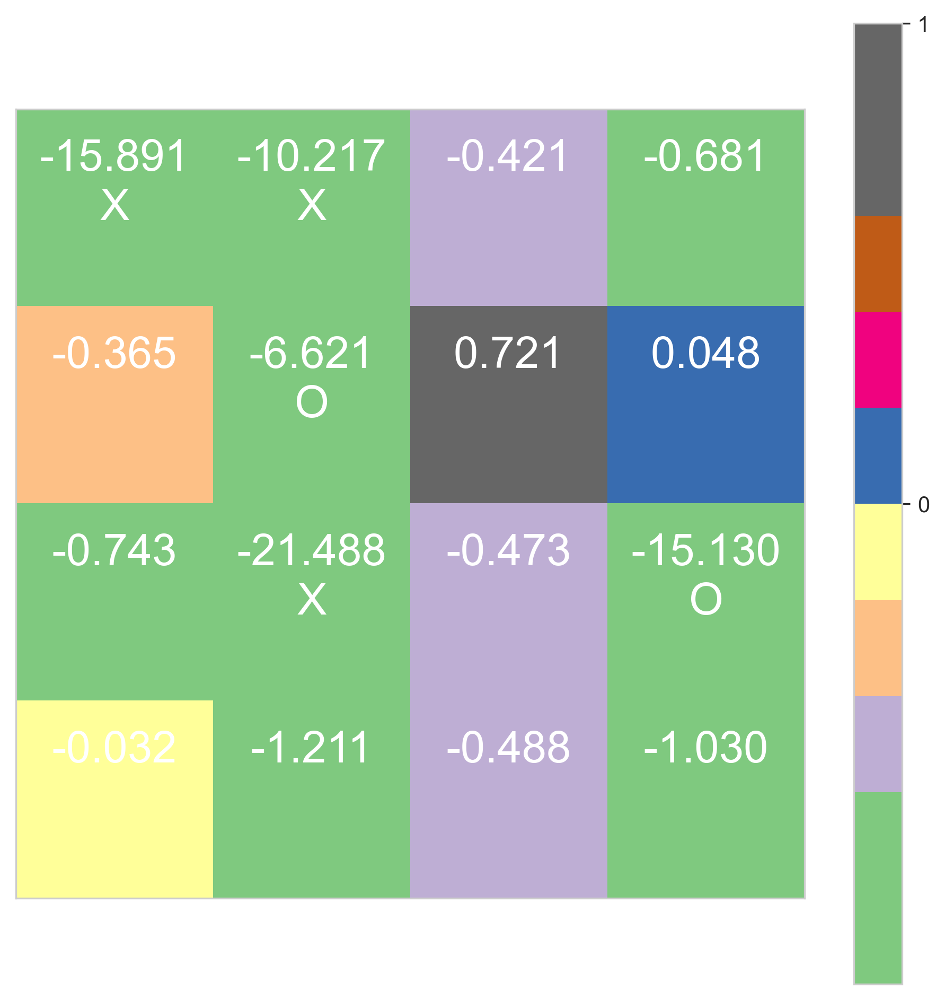

0 (0, 0) -15.890977
1 (0, 1) -10.217058
2 (0, 2) -0.42066878
3 (0, 3) -0.68077433
4 (1, 0) -0.36545822
5 (1, 1) -6.621346
6 (1, 2) 0.7205809
7 (1, 3) 0.04767567
8 (2, 0) -0.7428774
9 (2, 1) -21.487757
10 (2, 2) -0.47279915
11 (2, 3) -15.129686
12 (3, 0) -0.03211975
13 (3, 1) -1.2109957
14 (3, 2) -0.48843622
15 (3, 3) -1.0303698


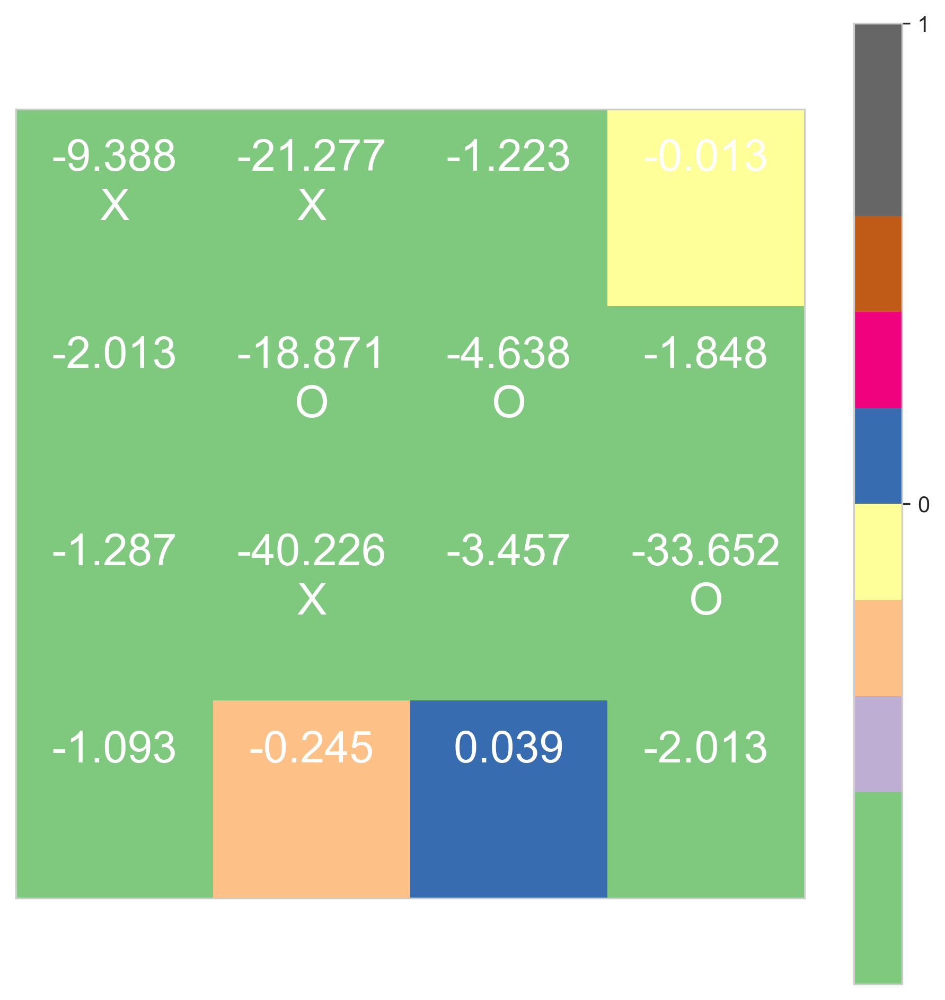

0 (0, 0) -9.388007
1 (0, 1) -21.277441
2 (0, 2) -1.2226039
3 (0, 3) -0.013095111
4 (1, 0) -2.0125117
5 (1, 1) -18.870705
6 (1, 2) -4.6380086
7 (1, 3) -1.8478335
8 (2, 0) -1.2869484
9 (2, 1) -40.22605
10 (2, 2) -3.456985
11 (2, 3) -33.65185
12 (3, 0) -1.092753
13 (3, 1) -0.24495786
14 (3, 2) 0.038785145
15 (3, 3) -2.0127323


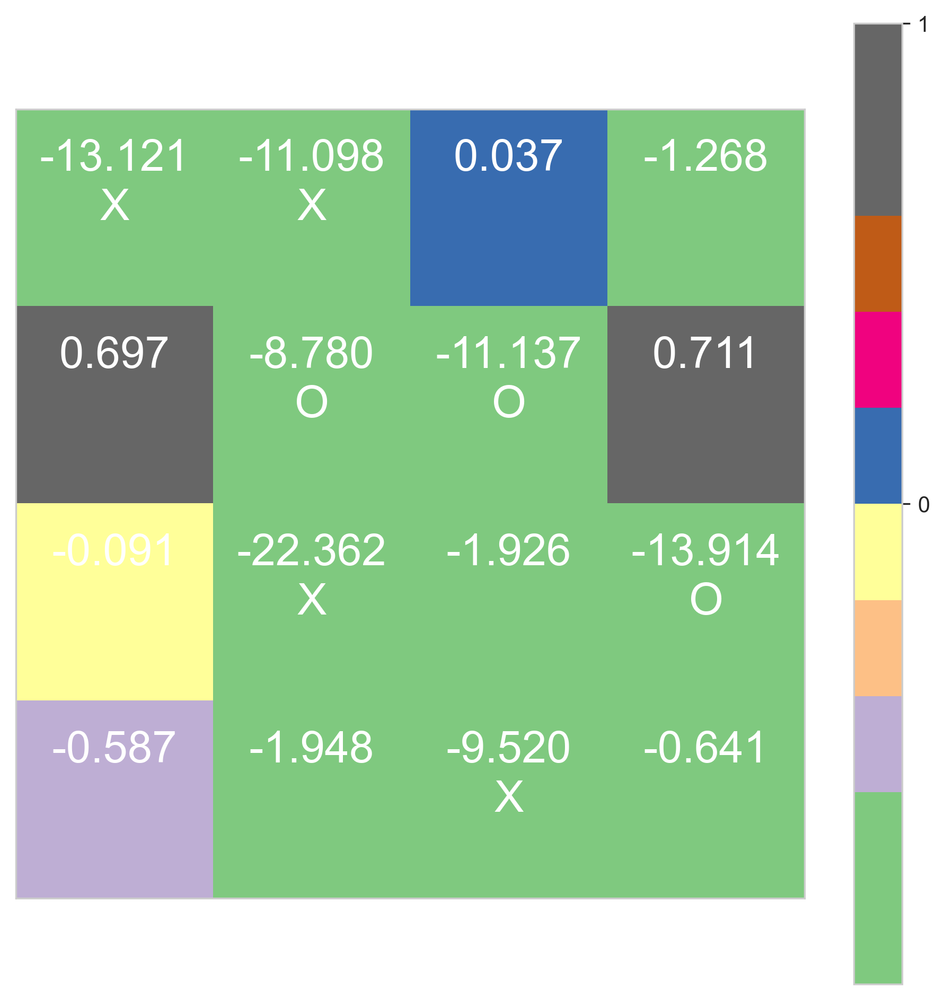

0 (0, 0) -13.1212225
1 (0, 1) -11.097649
2 (0, 2) 0.036568075
3 (0, 3) -1.2681094
4 (1, 0) 0.6969539
5 (1, 1) -8.779579
6 (1, 2) -11.137326
7 (1, 3) 0.71054876
8 (2, 0) -0.09079009
9 (2, 1) -22.361578
10 (2, 2) -1.9258862
11 (2, 3) -13.91405
12 (3, 0) -0.5872422
13 (3, 1) -1.9480994
14 (3, 2) -9.51976
15 (3, 3) -0.64118236


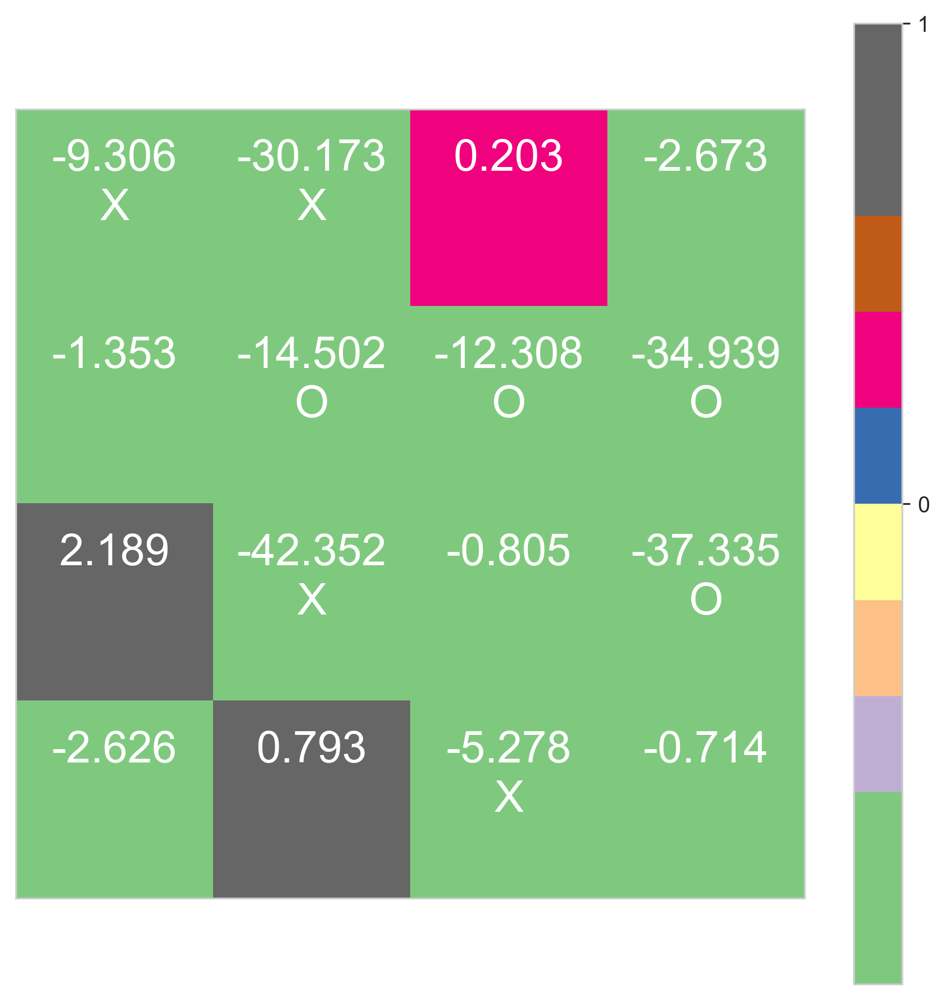

0 (0, 0) -9.306178
1 (0, 1) -30.173443
2 (0, 2) 0.20314936
3 (0, 3) -2.6728613
4 (1, 0) -1.3526571
5 (1, 1) -14.502138
6 (1, 2) -12.3082285
7 (1, 3) -34.939316
8 (2, 0) 2.1887226
9 (2, 1) -42.351994
10 (2, 2) -0.8054509
11 (2, 3) -37.33535
12 (3, 0) -2.6264458
13 (3, 1) 0.7932343
14 (3, 2) -5.2779984
15 (3, 3) -0.71359026


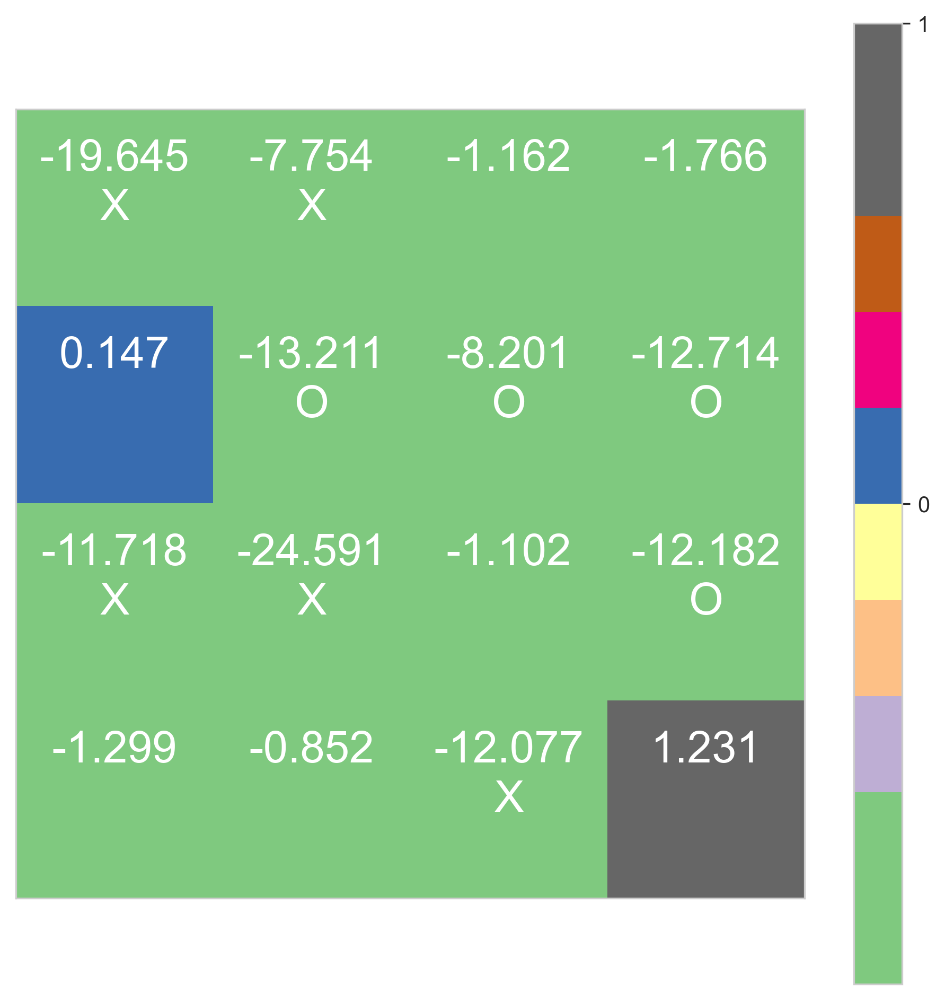

0 (0, 0) -19.6452
1 (0, 1) -7.754165
2 (0, 2) -1.1617658
3 (0, 3) -1.7663995
4 (1, 0) 0.14651957
5 (1, 1) -13.211483
6 (1, 2) -8.200917
7 (1, 3) -12.714255
8 (2, 0) -11.717754
9 (2, 1) -24.59094
10 (2, 2) -1.1024231
11 (2, 3) -12.181786
12 (3, 0) -1.2986945
13 (3, 1) -0.8520622
14 (3, 2) -12.077263
15 (3, 3) 1.2310691


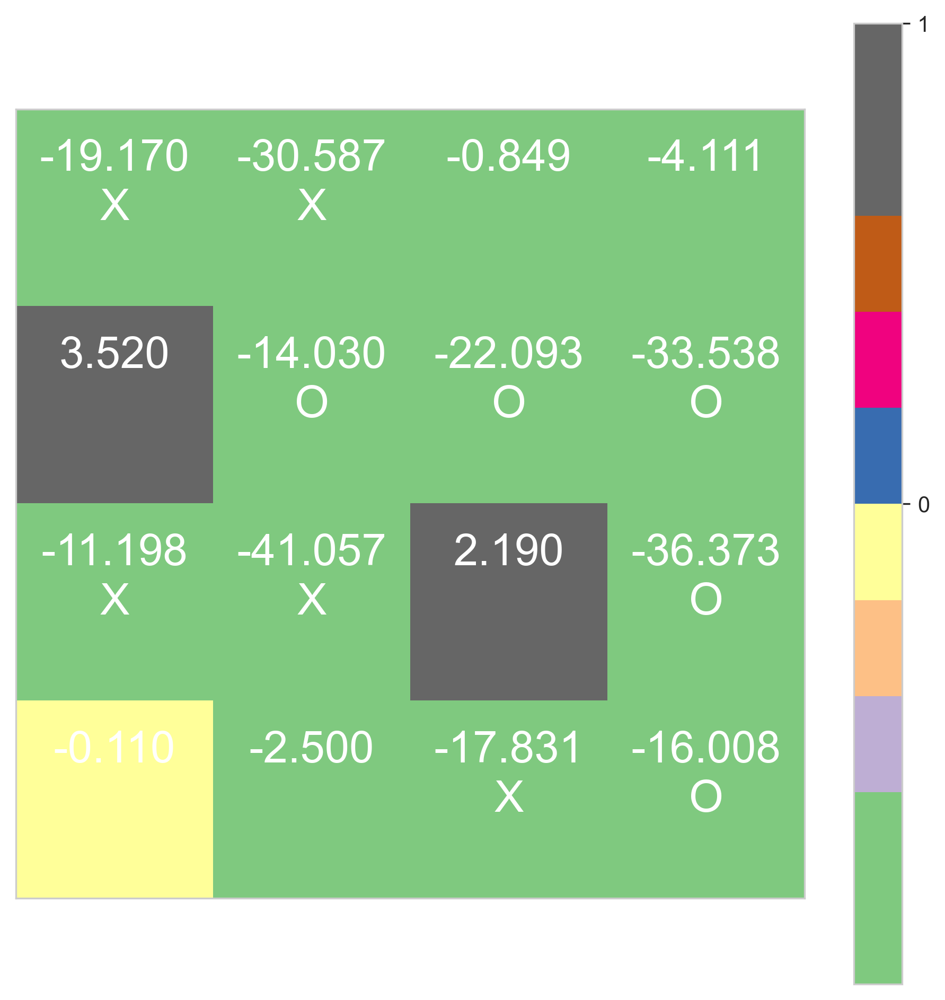

0 (0, 0) -19.170126
1 (0, 1) -30.587103
2 (0, 2) -0.84910476
3 (0, 3) -4.110586
4 (1, 0) 3.5201464
5 (1, 1) -14.02965
6 (1, 2) -22.093493
7 (1, 3) -33.53752
8 (2, 0) -11.197616
9 (2, 1) -41.057045
10 (2, 2) 2.1901226
11 (2, 3) -36.372986
12 (3, 0) -0.109900266
13 (3, 1) -2.5002944
14 (3, 2) -17.830671
15 (3, 3) -16.007942


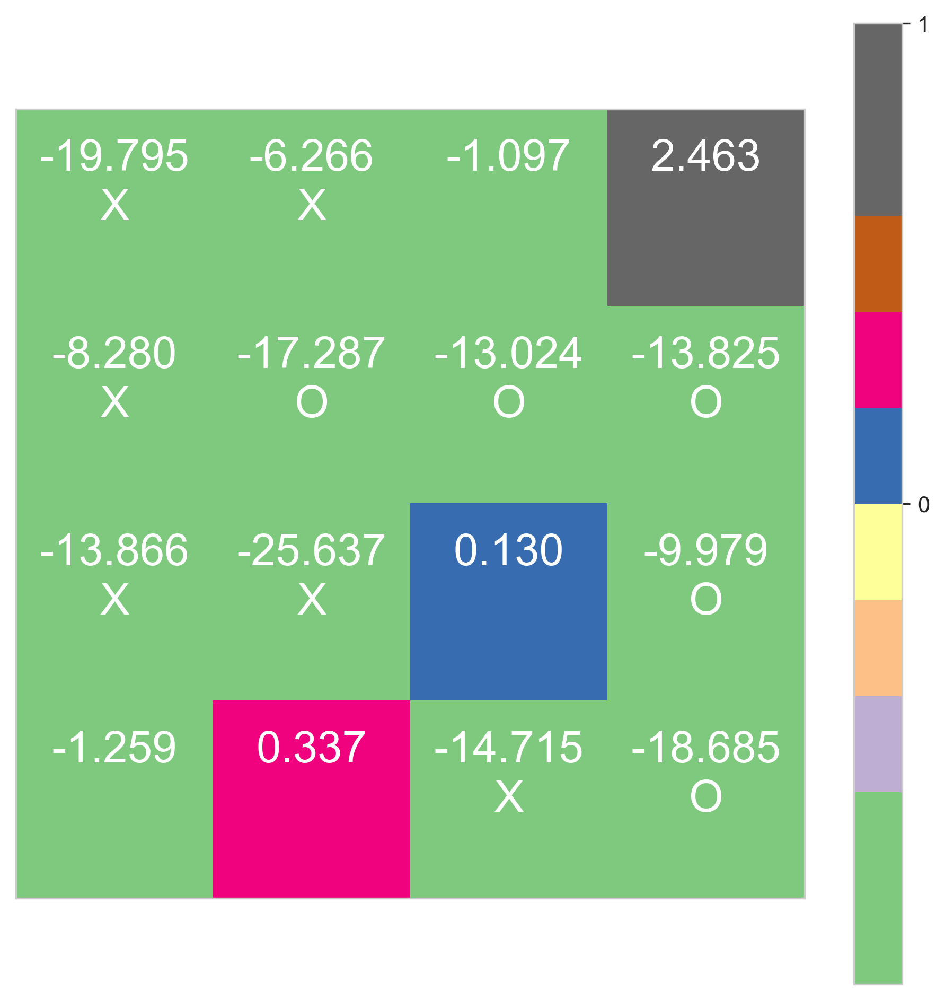

0 (0, 0) -19.794817
1 (0, 1) -6.2659044
2 (0, 2) -1.0971696
3 (0, 3) 2.4629602
4 (1, 0) -8.279941
5 (1, 1) -17.287119
6 (1, 2) -13.023974
7 (1, 3) -13.824995
8 (2, 0) -13.86565
9 (2, 1) -25.636507
10 (2, 2) 0.12982586
11 (2, 3) -9.978884
12 (3, 0) -1.2587233
13 (3, 1) 0.3369671
14 (3, 2) -14.715332
15 (3, 3) -18.684566
РќРѕР»РёРєРё РІС‹РёРіСЂР°Р»Рё!


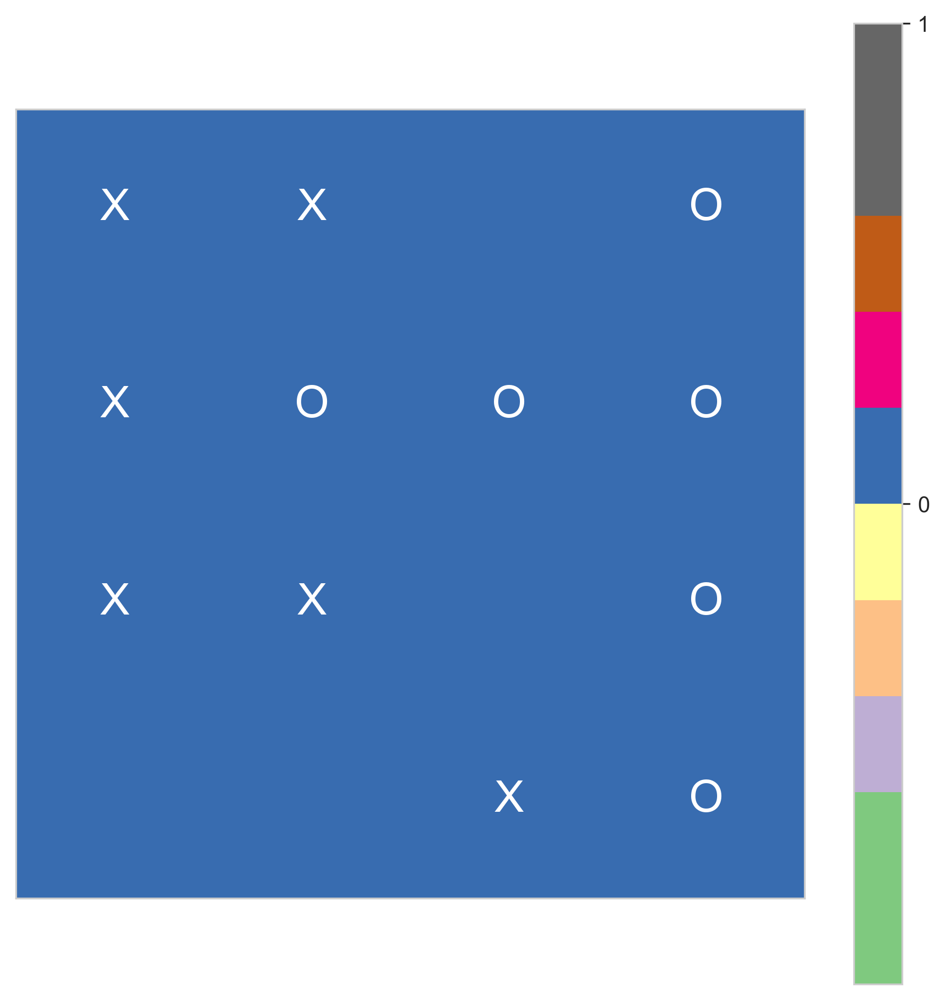

time: 16.2 s


In [96]:
plot_test_game(env, x_model, o_model, random_crosses=False, random_naughts=False, verbose=True, fontx=20)

In [97]:
d_dqn_x_model = x_model
d_dqn_o_model = o_model
d_dqn_coordinator = coordinator

time: 738 ms


**Вывод:**

Тоже получаются довольно странные стратегии.

Возможно, проблема с терминальным состоянием: если игра закончилась, что state == next_state и обновление происходит с надбавкой в виде reward'а, из-за чего вряд ли можно получить сходимось Q[s, \*] для финальных состояний. Попробую это исправить.

## Задание 4 (поправил значение Q-функции в терминальном состоянии)
Реализуйте Double DQN и/или Dueling DQN.

In [114]:
def where(cond, x_1, x_2):
    """ helper: like np.where but in pytorch. """
    return (cond * x_1) + ((1-cond) * x_2)

time: 269 ms


In [125]:
import copy

class DoubleDQNAgent(DQNAgent):
    """ Agent, which fit policy by DoubleDQN. """
    
    def __init__(
        self, 
        actions_list: typing.List[typing.Tuple[int, int]], n_cols: int, n_rows: int,
        alpha: float = 1e-3, gamma: float = 1.0,
        eps_init: float = 0.9, eps_final: float = 0.01, eps_decay: int = 1000,
        memory_capacity: int = 10000, batch_size: int = 64, hid_size: int = 64,
        clone_sync_freq: int = 10000,
    ):
        super().__init__(
            n_cols=n_cols, n_rows=n_rows,
            memory_capacity=memory_capacity, batch_size=batch_size, hid_size=hid_size,
            actions_list=actions_list, alpha=alpha, gamma=gamma,
            eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
        )
        self.clone_sync_freq = clone_sync_freq
        self.clone_model = copy.deepcopy(self.model)
    
    def update(self, s, a, r, next_s, is_done):
        if (self.num_step + 1) % self.clone_sync_freq == 0:
            self.clone_model = copy.deepcopy(self.model)
        
        # save sars
        a = tuple(a)
        state_tensor = self._board_hash2state(hash_state=s)
        action_tensor = torch.tensor([self._actions_list.index(a)], dtype=torch.float32, requires_grad=False)
        reward_tensor = torch.tensor([r], dtype=torch.float32, requires_grad=False)
        next_state_tensor = self._board_hash2state(hash_state=next_s)
        is_done_tensor = torch.tensor([is_done], dtype=torch.float32, requires_grad=False)
        transition = (state_tensor, action_tensor, reward_tensor, next_state_tensor, is_done_tensor)
        self.memory.store(transition)
        
        # train
        if len(self.memory) < self.batch_size:
            return
        
        ## get batch
        transitions = self.memory.sample(self.batch_size)
        batch_state, batch_action, batch_reward, batch_next_state, batch_is_done = zip(*transitions)
        
        ## eval loss
        loss = self.compute_td_loss(
            states=torch.stack(batch_state), 
            actions=torch.stack(batch_action), 
            rewards=torch.stack(batch_reward), 
            next_states=torch.stack(batch_next_state),
            is_done=torch.stack(batch_is_done),
        )

#         Q = self.model(batch_state).gather(1, batch_action).reshape([self.batch_size])

#         Qmax = self.model(batch_next_state).detach().max(1)[0]
#         Qnext = batch_reward + (self.gamma * Qmax)

#         loss = F.smooth_l1_loss(Q, Qnext)
        
        ## optimize
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
    def compute_td_loss(
        self, 
        states: torch.tensor, 
        actions: torch.tensor, 
        rewards: torch.tensor, 
        next_states: torch.tensor, 
        is_done: torch.tensor,
    ):
        # get q-values for all actions in current states
        predicted_qvalues = self.model(states)

        # select q-values for chosen actions
        predicted_qvalues_for_actions = torch.sum(predicted_qvalues * to_one_hot(actions, self.n_actions), dim=1)  # shape: [batch_size]

        # compute q-values for all actions in next states
        predicted_next_qvalues = self.clone_model(next_states).detach()

        # compute V*(next_states) using predicted next q-values
        next_state_values = torch.max(predicted_next_qvalues, dim=1)[0]
        assert next_state_values.dtype == torch.float32

        # compute "target q-values" for loss
        rewards = rewards.flatten()
        is_done = is_done.flatten()
        target_qvalues_for_actions = rewards + self.gamma*next_state_values
        
        target_qvalues_for_actions = where(is_done, rewards, target_qvalues_for_actions)
        
        # mean squared error loss to minimize (don't forget to .detach())
        loss = F.smooth_l1_loss(predicted_qvalues_for_actions, target_qvalues_for_actions)

        return loss

time: 36.2 ms


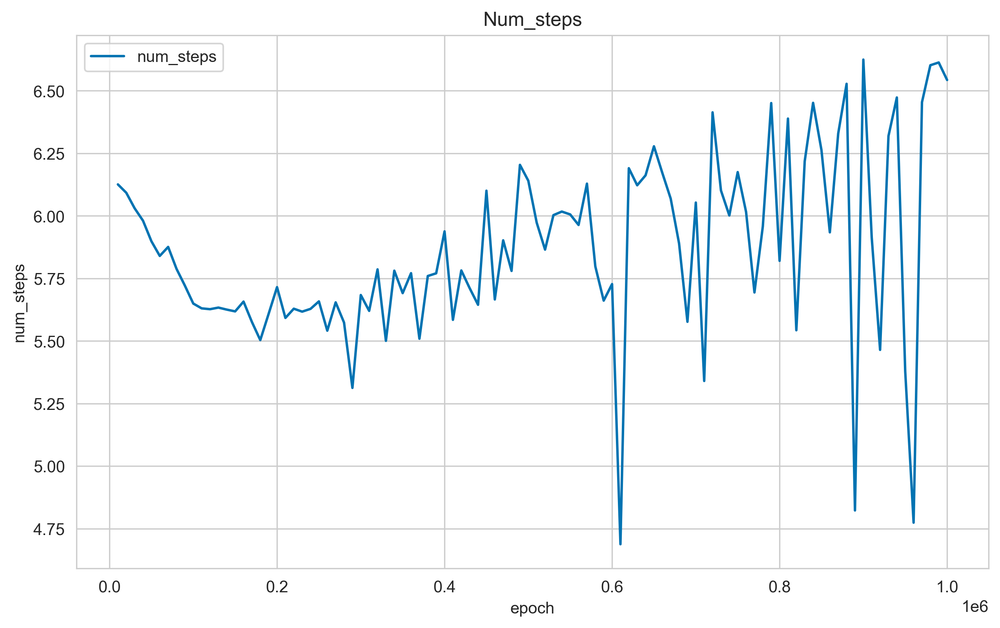

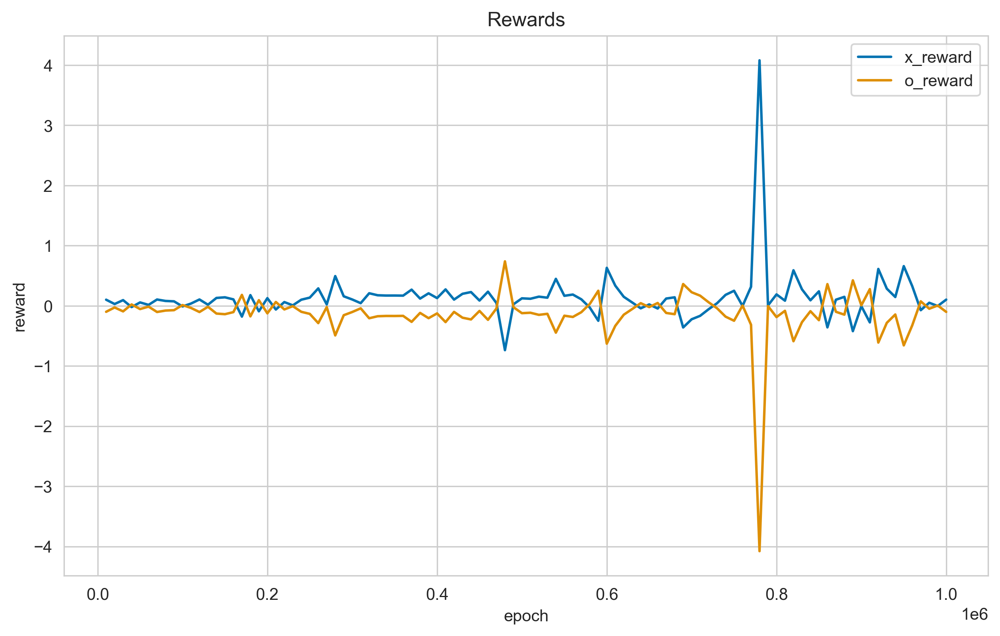

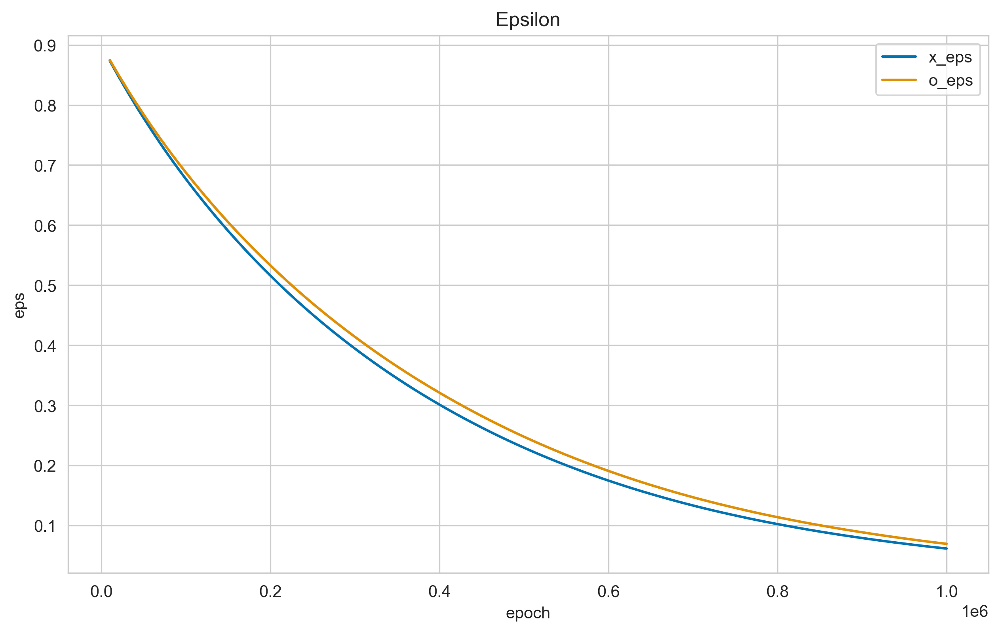


time: 10h 56min 44s


In [128]:
n_rows = 4
n_cols = 4
n_win = 4

n_episodes = int(1e6)
val_freq = int(1e4)
n_val_episodes = int(1e4)

actions_list = [(i, j) for i in range(n_rows) for j in range(n_cols)]
alpha = 1e-3
gamma = 0.85

eps_init = 0.9
eps_final = 0.01
eps_decay = 8e5 * 3

memory_capacity = 30000
batch_size = 64
hid_size = 64

clone_sync_freq = 200


env = TicTacToe(n_rows=n_rows, n_cols=n_cols, n_win=n_win)
x_model = DoubleDQNAgent(
    n_cols=n_cols, n_rows=n_rows,
    memory_capacity=memory_capacity, batch_size=batch_size, hid_size=hid_size,
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
    clone_sync_freq=clone_sync_freq,
)
o_model = DoubleDQNAgent(
    n_cols=n_cols, n_rows=n_rows,
    memory_capacity=memory_capacity, batch_size=batch_size, hid_size=hid_size,
    actions_list=actions_list, alpha=alpha, gamma=gamma,
    eps_init=eps_init, eps_final=eps_final, eps_decay=eps_decay,
    clone_sync_freq=clone_sync_freq,
)
coordinator = TicTacToeCoordinator(env=env, x_model=x_model, o_model=o_model)

for e in tqdm(range(n_episodes)):
    coordinator.run_episode(do_learning=True, greedy=False, render=False)
    
    if (e + 1) % val_freq == 0:
        clear_output(wait=True)
        coordinator.validate(n_episodes=n_val_episodes)

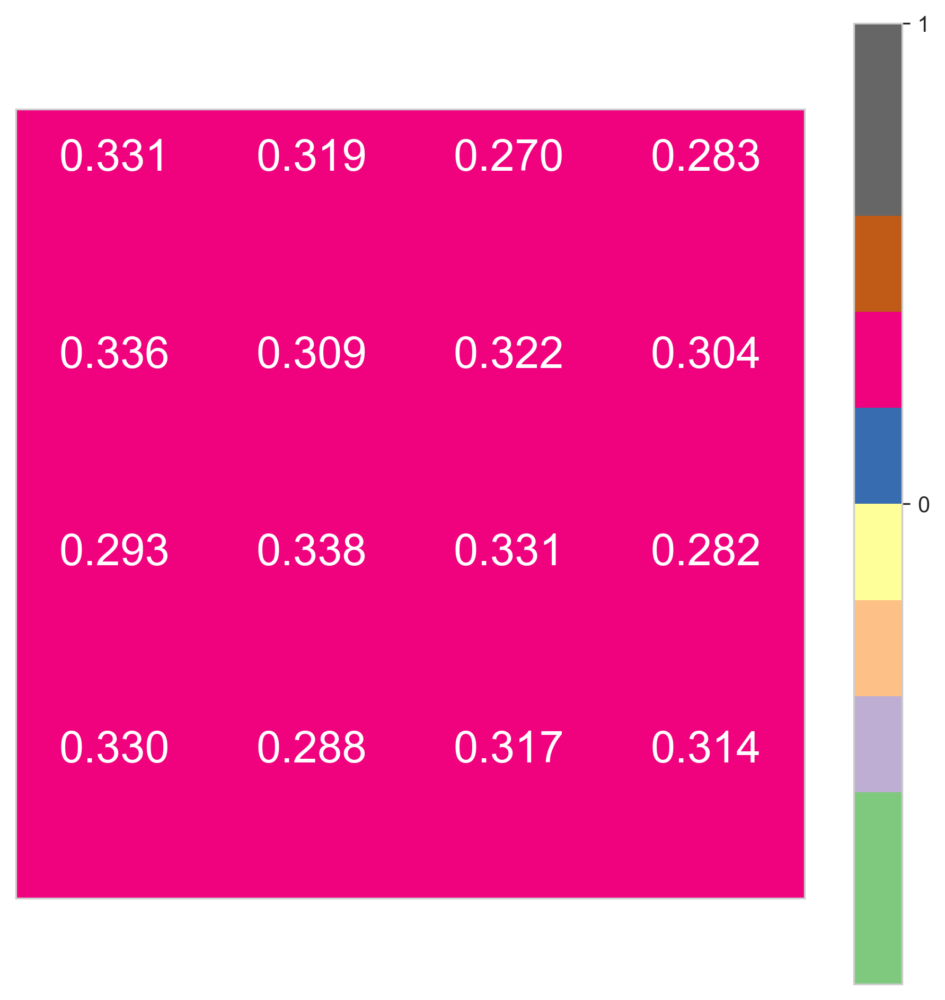

0 (0, 0) 0.33115548
1 (0, 1) 0.3194321
2 (0, 2) 0.26980373
3 (0, 3) 0.2829992
4 (1, 0) 0.33614734
5 (1, 1) 0.30905542
6 (1, 2) 0.32243016
7 (1, 3) 0.3035068
8 (2, 0) 0.29297188
9 (2, 1) 0.33840847
10 (2, 2) 0.33146766
11 (2, 3) 0.2816769
12 (3, 0) 0.3298245
13 (3, 1) 0.28773007
14 (3, 2) 0.31657904
15 (3, 3) 0.31420764


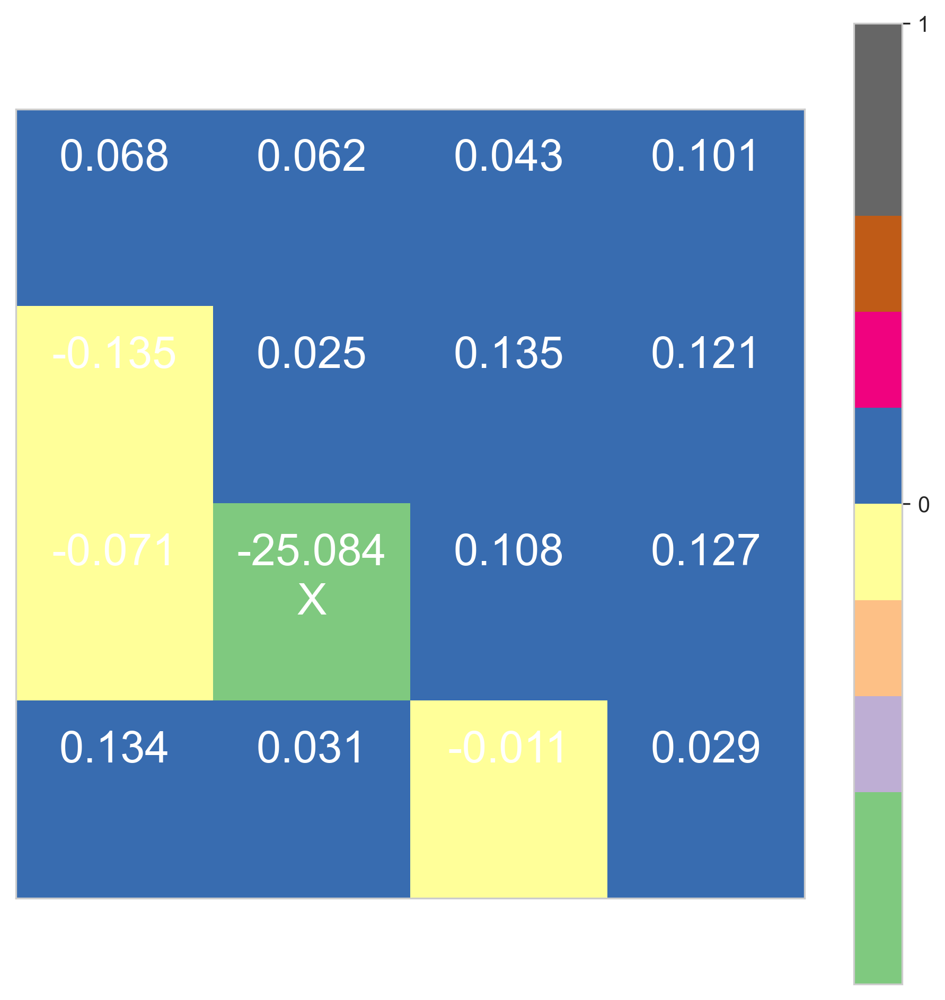

0 (0, 0) 0.06829645
1 (0, 1) 0.06224084
2 (0, 2) 0.042977348
3 (0, 3) 0.10092462
4 (1, 0) -0.13544577
5 (1, 1) 0.025170833
6 (1, 2) 0.13502093
7 (1, 3) 0.12109585
8 (2, 0) -0.07077275
9 (2, 1) -25.083788
10 (2, 2) 0.10787548
11 (2, 3) 0.12710863
12 (3, 0) 0.13381964
13 (3, 1) 0.030560896
14 (3, 2) -0.011026278
15 (3, 3) 0.02900073


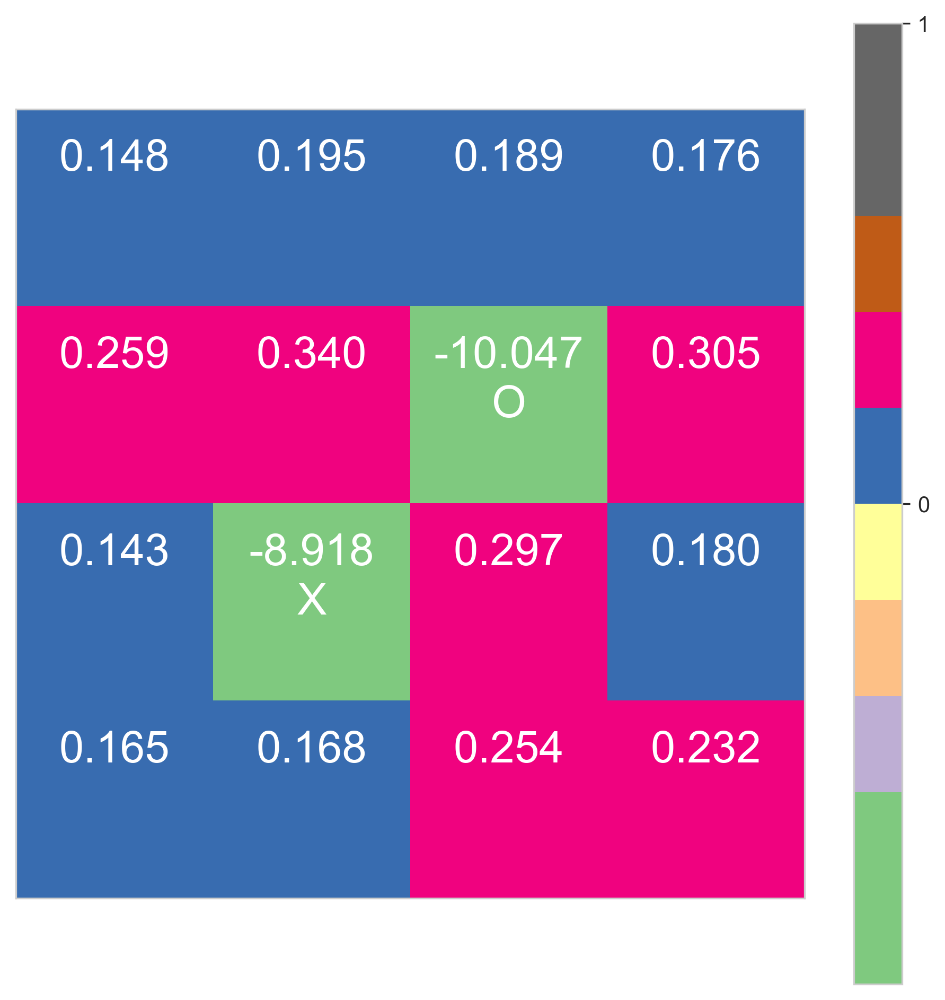

0 (0, 0) 0.1484139
1 (0, 1) 0.19513682
2 (0, 2) 0.1893878
3 (0, 3) 0.1756675
4 (1, 0) 0.25908053
5 (1, 1) 0.34047216
6 (1, 2) -10.047368
7 (1, 3) 0.3046018
8 (2, 0) 0.1427061
9 (2, 1) -8.917779
10 (2, 2) 0.2973397
11 (2, 3) 0.18037641
12 (3, 0) 0.16466221
13 (3, 1) 0.1678909
14 (3, 2) 0.2543023
15 (3, 3) 0.23214607


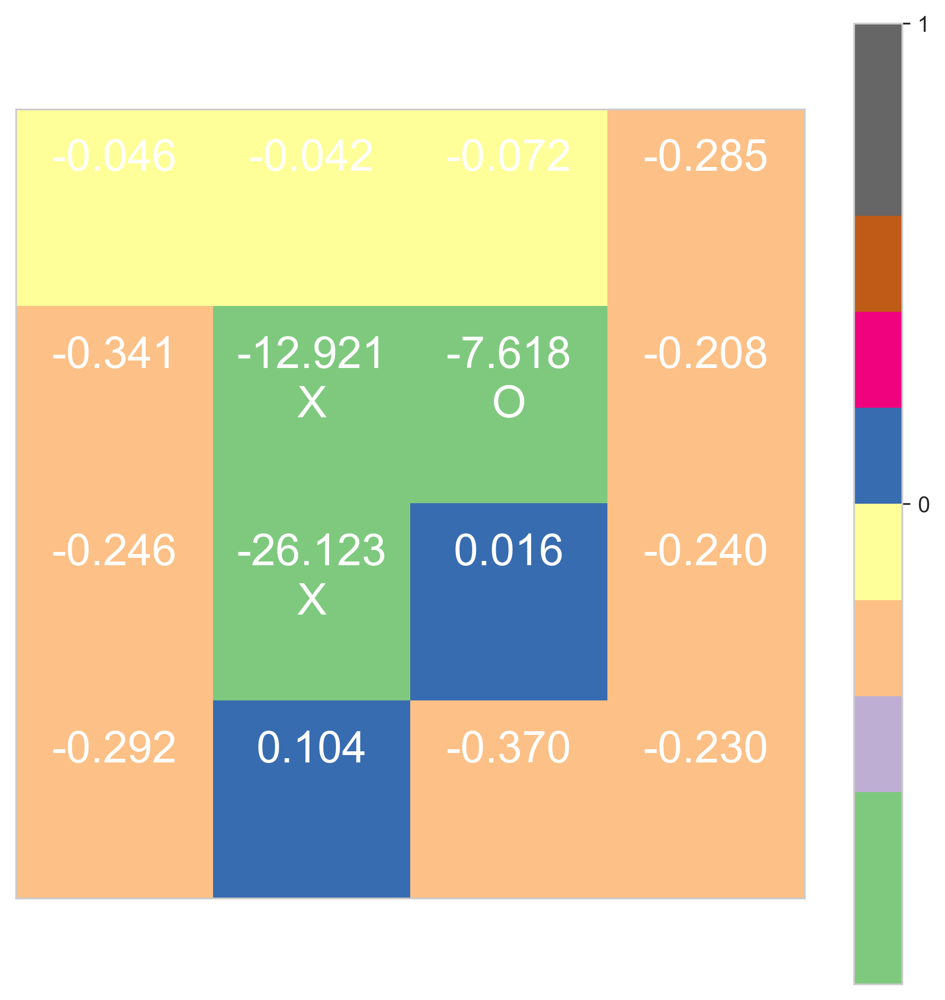

0 (0, 0) -0.045590088
1 (0, 1) -0.042100683
2 (0, 2) -0.07190086
3 (0, 3) -0.28478122
4 (1, 0) -0.3405012
5 (1, 1) -12.920841
6 (1, 2) -7.6178417
7 (1, 3) -0.20842415
8 (2, 0) -0.24576752
9 (2, 1) -26.123486
10 (2, 2) 0.01581432
11 (2, 3) -0.23965476
12 (3, 0) -0.29190117
13 (3, 1) 0.104053155
14 (3, 2) -0.37006283
15 (3, 3) -0.23048373


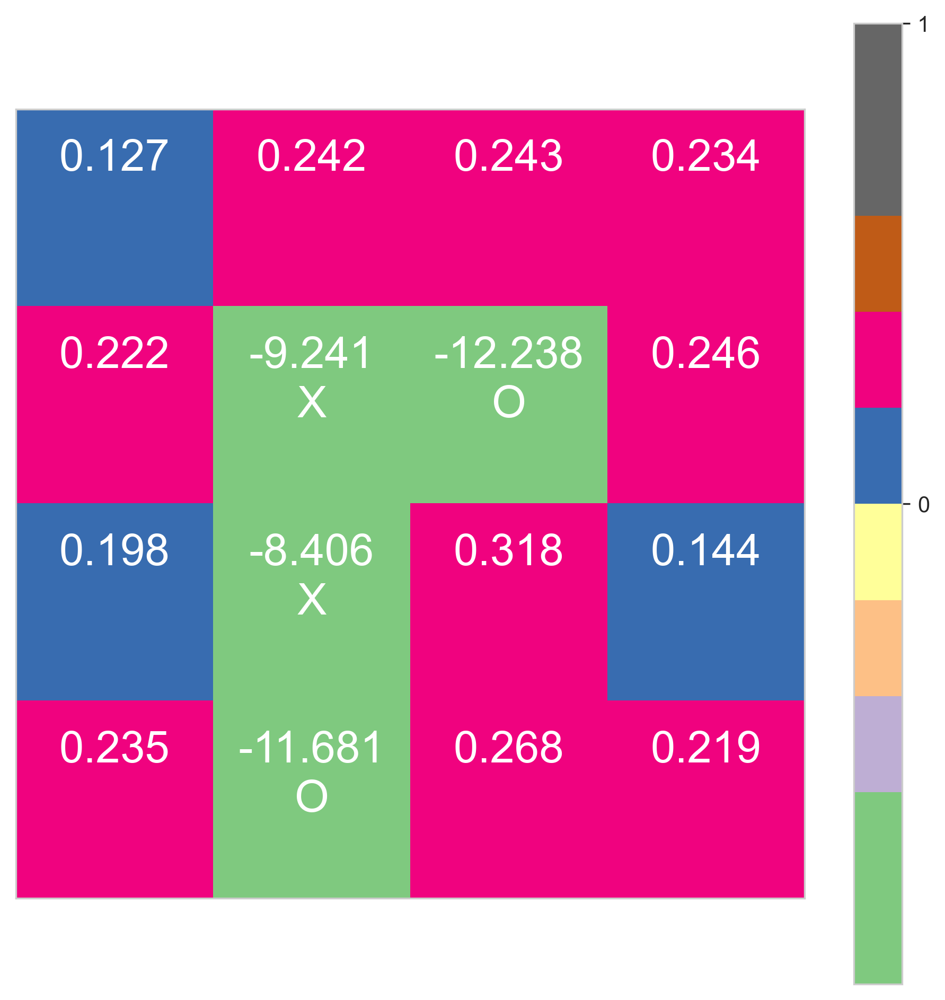

0 (0, 0) 0.1269611
1 (0, 1) 0.24215212
2 (0, 2) 0.24325642
3 (0, 3) 0.23439443
4 (1, 0) 0.22200717
5 (1, 1) -9.240767
6 (1, 2) -12.2382145
7 (1, 3) 0.24622169
8 (2, 0) 0.19824505
9 (2, 1) -8.405904
10 (2, 2) 0.31818604
11 (2, 3) 0.14441974
12 (3, 0) 0.235398
13 (3, 1) -11.680546
14 (3, 2) 0.26766437
15 (3, 3) 0.21934262


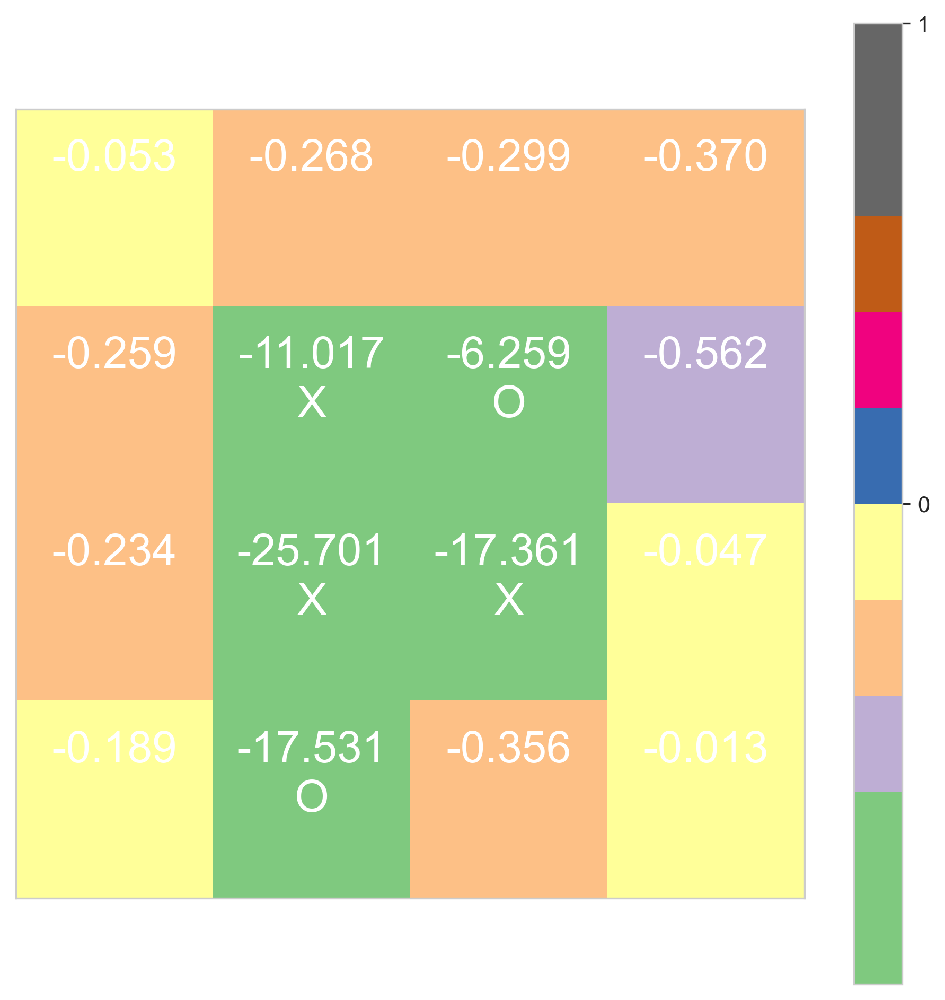

0 (0, 0) -0.052919134
1 (0, 1) -0.26763755
2 (0, 2) -0.2988997
3 (0, 3) -0.36987633
4 (1, 0) -0.25894484
5 (1, 1) -11.016745
6 (1, 2) -6.259478
7 (1, 3) -0.5624266
8 (2, 0) -0.23367934
9 (2, 1) -25.700518
10 (2, 2) -17.360926
11 (2, 3) -0.046686083
12 (3, 0) -0.18857223
13 (3, 1) -17.530684
14 (3, 2) -0.35625547
15 (3, 3) -0.0134085715


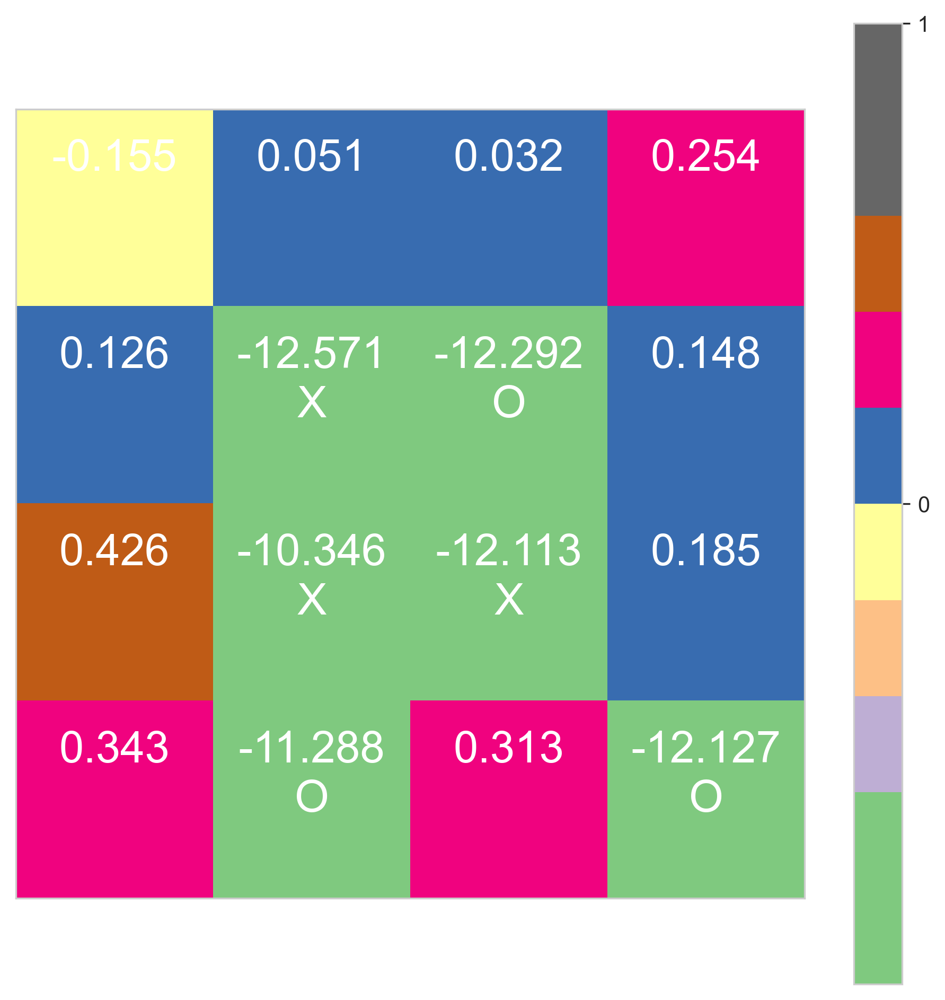

0 (0, 0) -0.15464118
1 (0, 1) 0.05080107
2 (0, 2) 0.031814486
3 (0, 3) 0.254023
4 (1, 0) 0.1255632
5 (1, 1) -12.571492
6 (1, 2) -12.291701
7 (1, 3) 0.14766486
8 (2, 0) 0.4263194
9 (2, 1) -10.345605
10 (2, 2) -12.113289
11 (2, 3) 0.18504873
12 (3, 0) 0.34329373
13 (3, 1) -11.2878895
14 (3, 2) 0.3126406
15 (3, 3) -12.12678


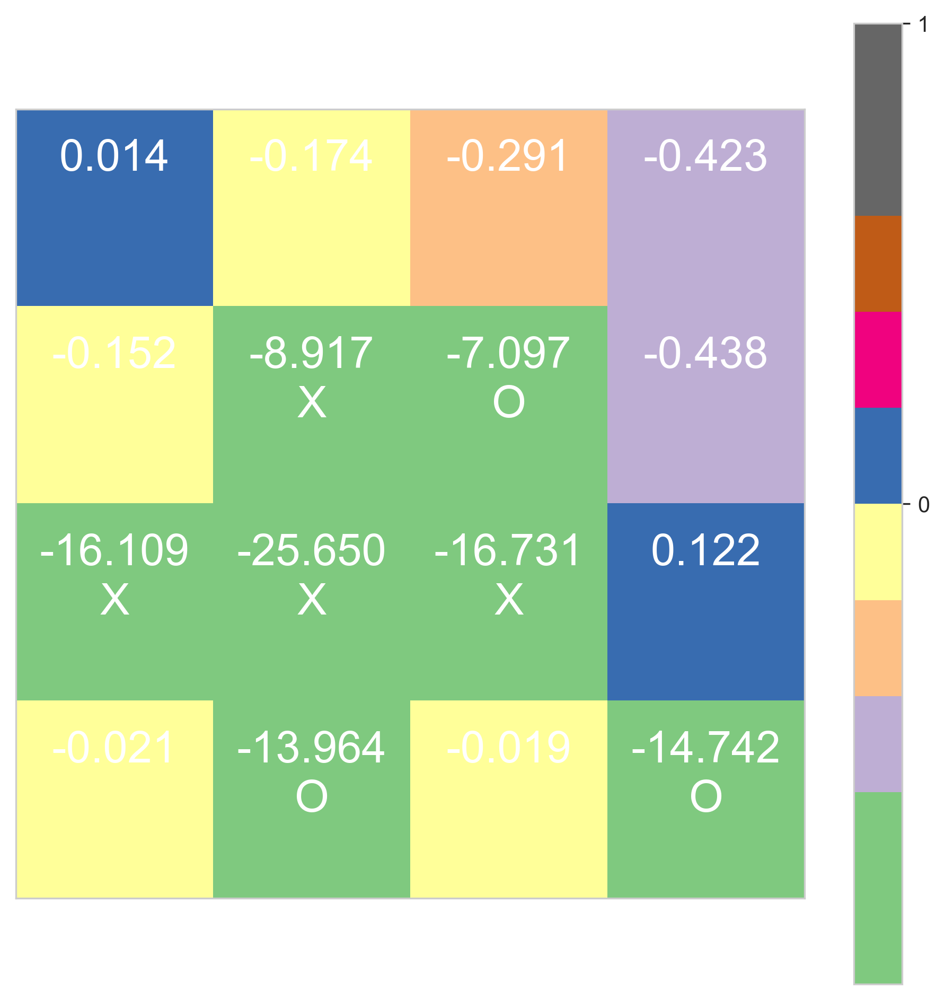

0 (0, 0) 0.014062494
1 (0, 1) -0.17409234
2 (0, 2) -0.29078233
3 (0, 3) -0.42306906
4 (1, 0) -0.15151054
5 (1, 1) -8.91728
6 (1, 2) -7.097172
7 (1, 3) -0.4379211
8 (2, 0) -16.108994
9 (2, 1) -25.650047
10 (2, 2) -16.731113
11 (2, 3) 0.12227065
12 (3, 0) -0.02126813
13 (3, 1) -13.964227
14 (3, 2) -0.018692419
15 (3, 3) -14.741653


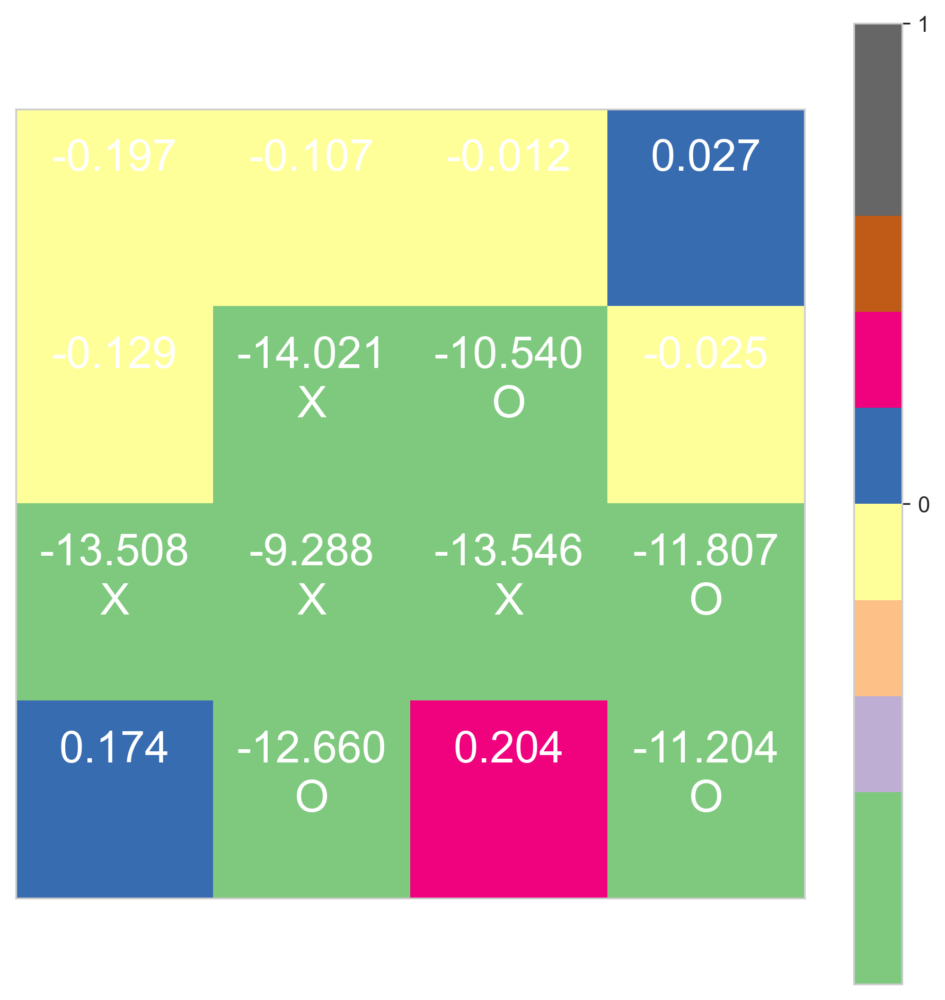

0 (0, 0) -0.19715476
1 (0, 1) -0.10722786
2 (0, 2) -0.0119564235
3 (0, 3) 0.02668178
4 (1, 0) -0.12908456
5 (1, 1) -14.02129
6 (1, 2) -10.539617
7 (1, 3) -0.024738193
8 (2, 0) -13.507995
9 (2, 1) -9.2879305
10 (2, 2) -13.545785
11 (2, 3) -11.806503
12 (3, 0) 0.17431578
13 (3, 1) -12.659853
14 (3, 2) 0.20381781
15 (3, 3) -11.2043295


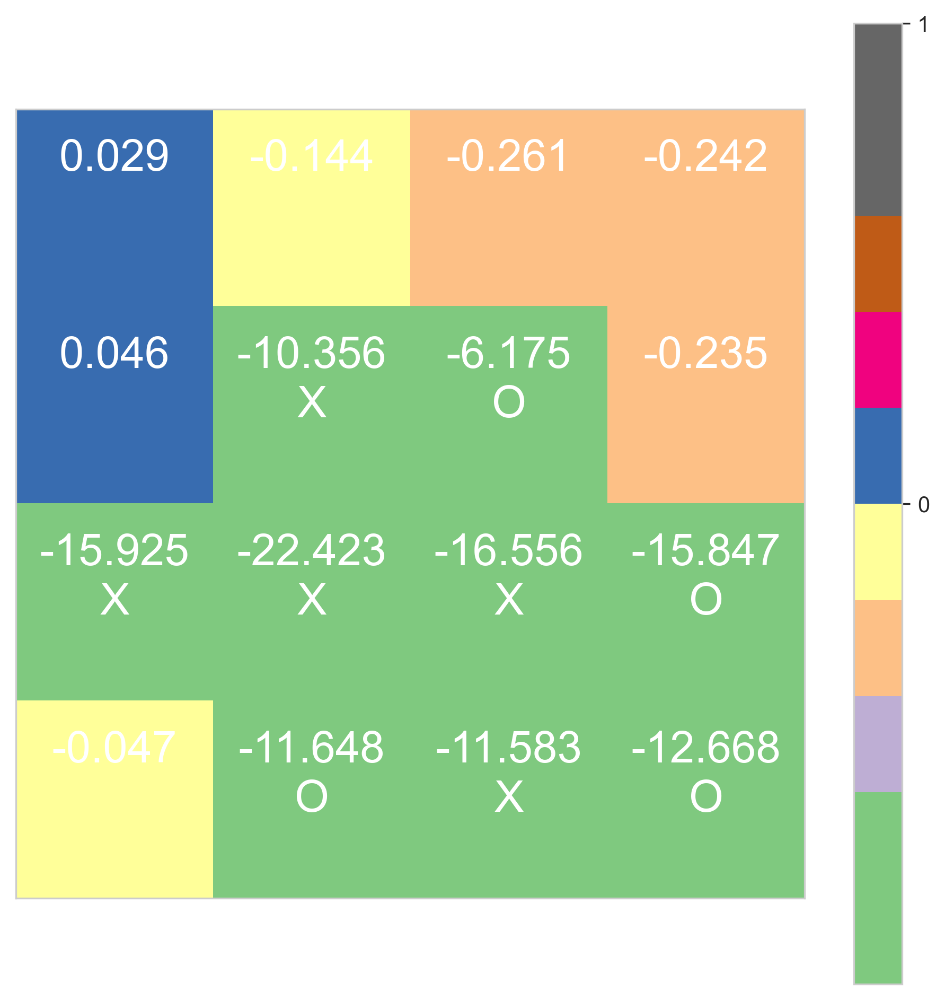

0 (0, 0) 0.028514057
1 (0, 1) -0.14437158
2 (0, 2) -0.26075685
3 (0, 3) -0.2423441
4 (1, 0) 0.046003565
5 (1, 1) -10.3559
6 (1, 2) -6.175128
7 (1, 3) -0.23537755
8 (2, 0) -15.924633
9 (2, 1) -22.423378
10 (2, 2) -16.555965
11 (2, 3) -15.8470335
12 (3, 0) -0.046668112
13 (3, 1) -11.647923
14 (3, 2) -11.583208
15 (3, 3) -12.668075


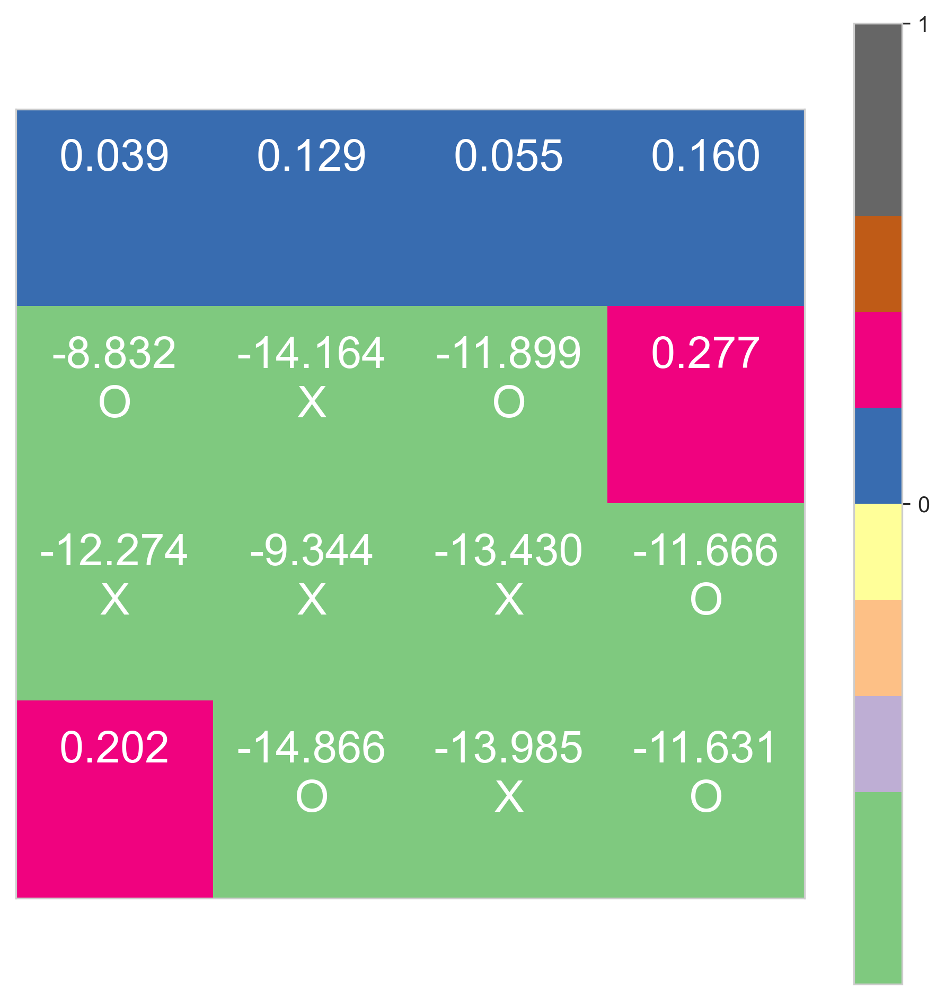

0 (0, 0) 0.038595468
1 (0, 1) 0.12874255
2 (0, 2) 0.05545938
3 (0, 3) 0.16017228
4 (1, 0) -8.831739
5 (1, 1) -14.164413
6 (1, 2) -11.898571
7 (1, 3) 0.27710593
8 (2, 0) -12.274422
9 (2, 1) -9.343651
10 (2, 2) -13.430188
11 (2, 3) -11.665726
12 (3, 0) 0.20188144
13 (3, 1) -14.865899
14 (3, 2) -13.985335
15 (3, 3) -11.631147


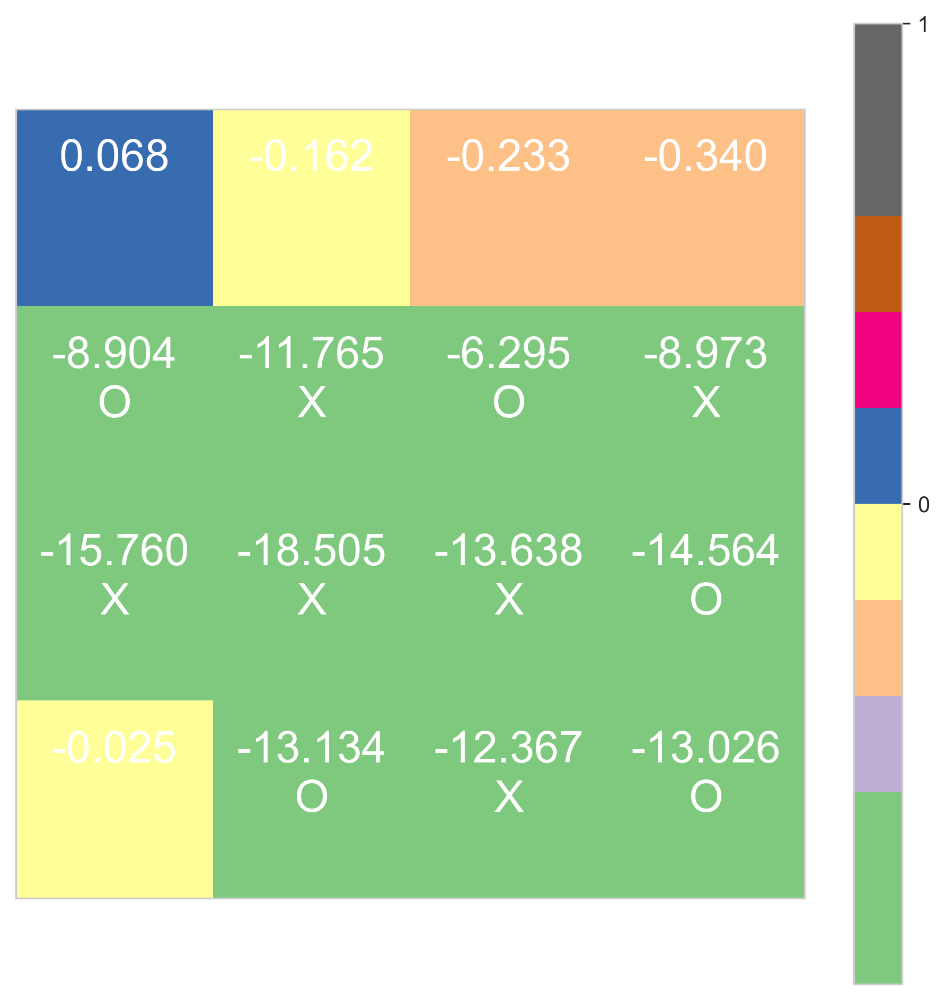

0 (0, 0) 0.067540556
1 (0, 1) -0.16236757
2 (0, 2) -0.23284645
3 (0, 3) -0.34045064
4 (1, 0) -8.90357
5 (1, 1) -11.765139
6 (1, 2) -6.2953587
7 (1, 3) -8.972944
8 (2, 0) -15.759758
9 (2, 1) -18.505396
10 (2, 2) -13.63849
11 (2, 3) -14.564312
12 (3, 0) -0.025237411
13 (3, 1) -13.134136
14 (3, 2) -12.3672085
15 (3, 3) -13.025539


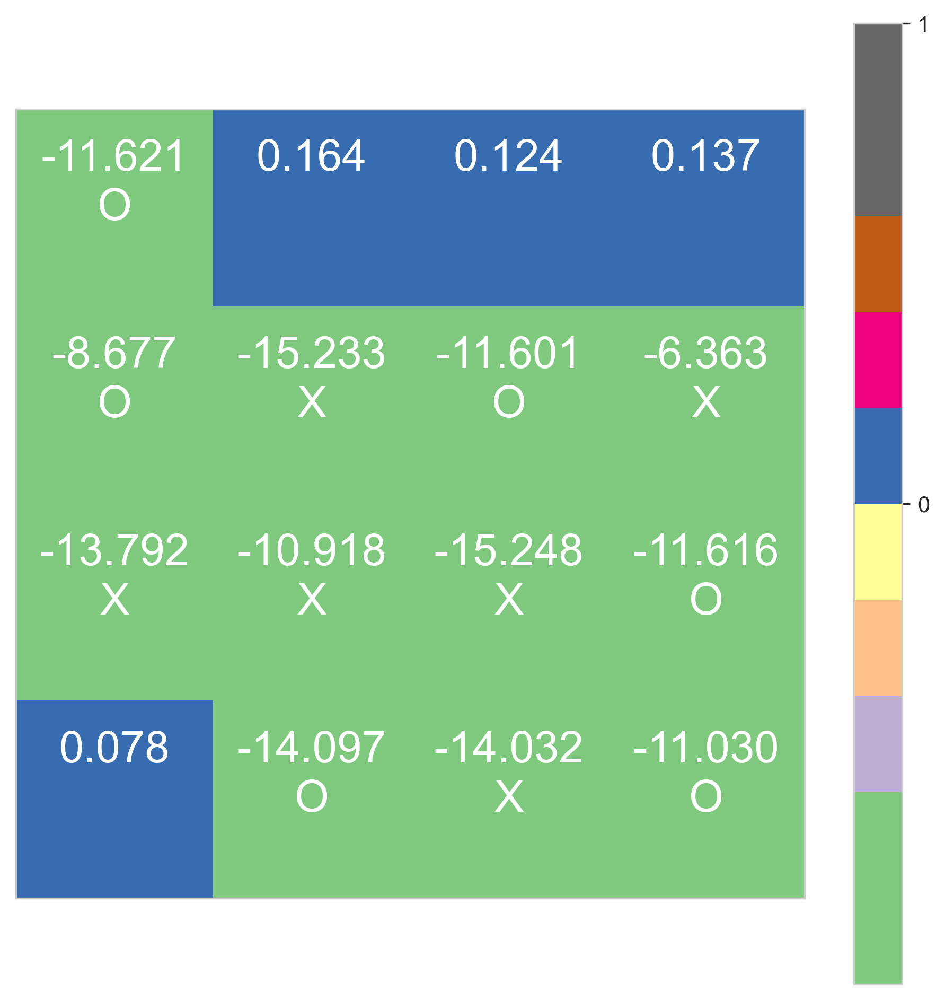

0 (0, 0) -11.621289
1 (0, 1) 0.16355021
2 (0, 2) 0.12411687
3 (0, 3) 0.13715658
4 (1, 0) -8.677386
5 (1, 1) -15.232913
6 (1, 2) -11.601123
7 (1, 3) -6.3634996
8 (2, 0) -13.792474
9 (2, 1) -10.918052
10 (2, 2) -15.248228
11 (2, 3) -11.615845
12 (3, 0) 0.07845712
13 (3, 1) -14.09694
14 (3, 2) -14.032342
15 (3, 3) -11.030044


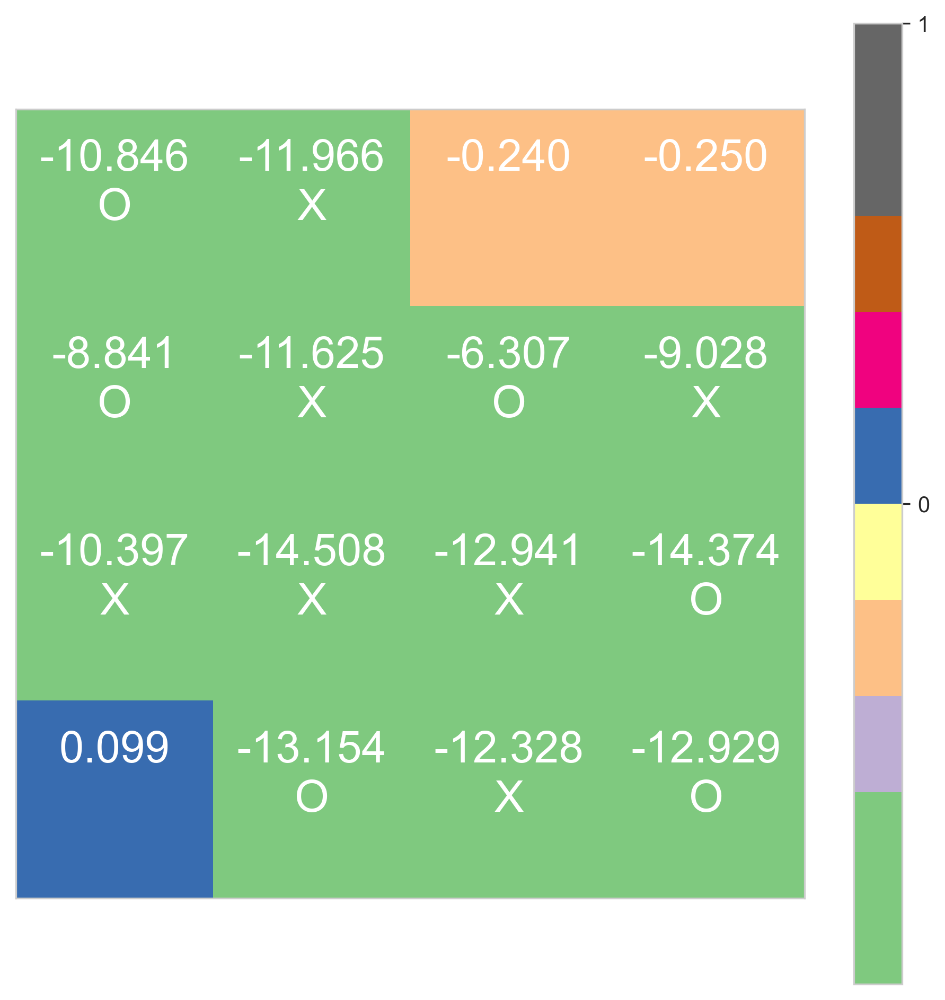

0 (0, 0) -10.846283
1 (0, 1) -11.966161
2 (0, 2) -0.240124
3 (0, 3) -0.2500223
4 (1, 0) -8.841414
5 (1, 1) -11.6248665
6 (1, 2) -6.3073025
7 (1, 3) -9.027807
8 (2, 0) -10.397208
9 (2, 1) -14.508465
10 (2, 2) -12.94092
11 (2, 3) -14.373926
12 (3, 0) 0.09882867
13 (3, 1) -13.154223
14 (3, 2) -12.327715
15 (3, 3) -12.9287815


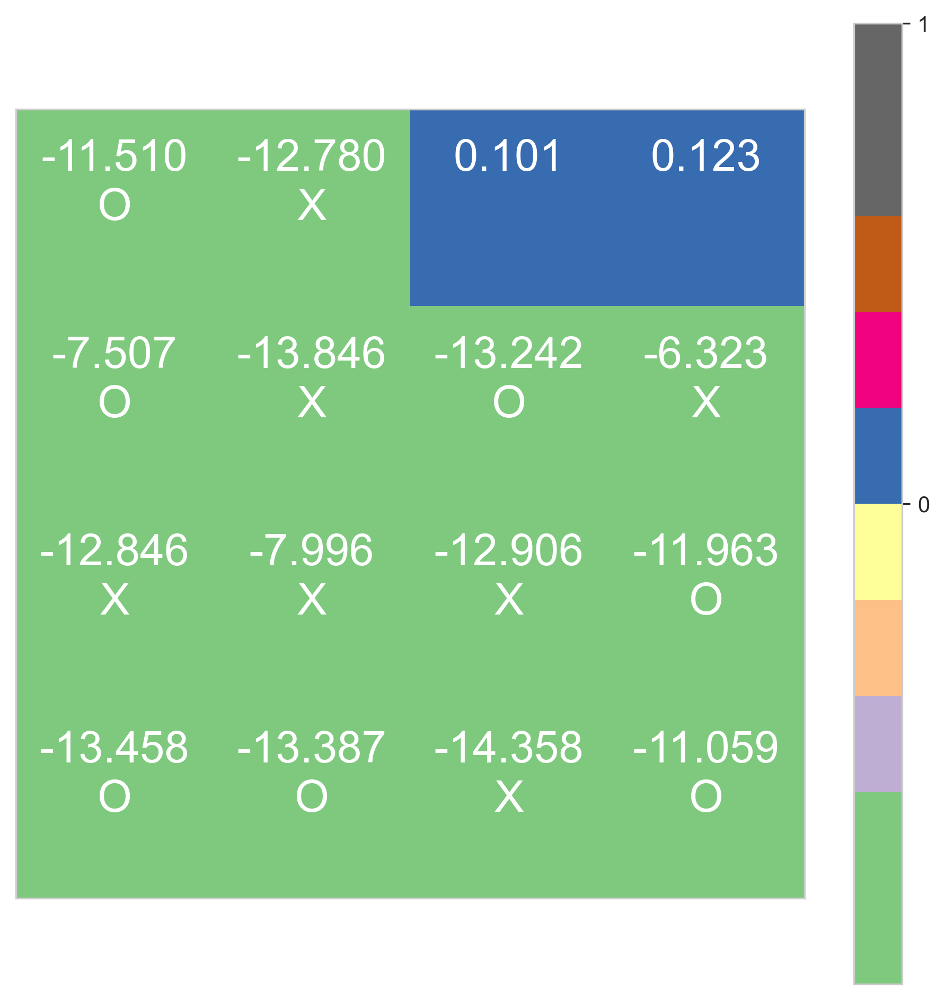

0 (0, 0) -11.509934
1 (0, 1) -12.780468
2 (0, 2) 0.10138759
3 (0, 3) 0.122885615
4 (1, 0) -7.5073276
5 (1, 1) -13.846034
6 (1, 2) -13.2418785
7 (1, 3) -6.3229623
8 (2, 0) -12.845612
9 (2, 1) -7.9961376
10 (2, 2) -12.905671
11 (2, 3) -11.962741
12 (3, 0) -13.458286
13 (3, 1) -13.386577
14 (3, 2) -14.358327
15 (3, 3) -11.058902


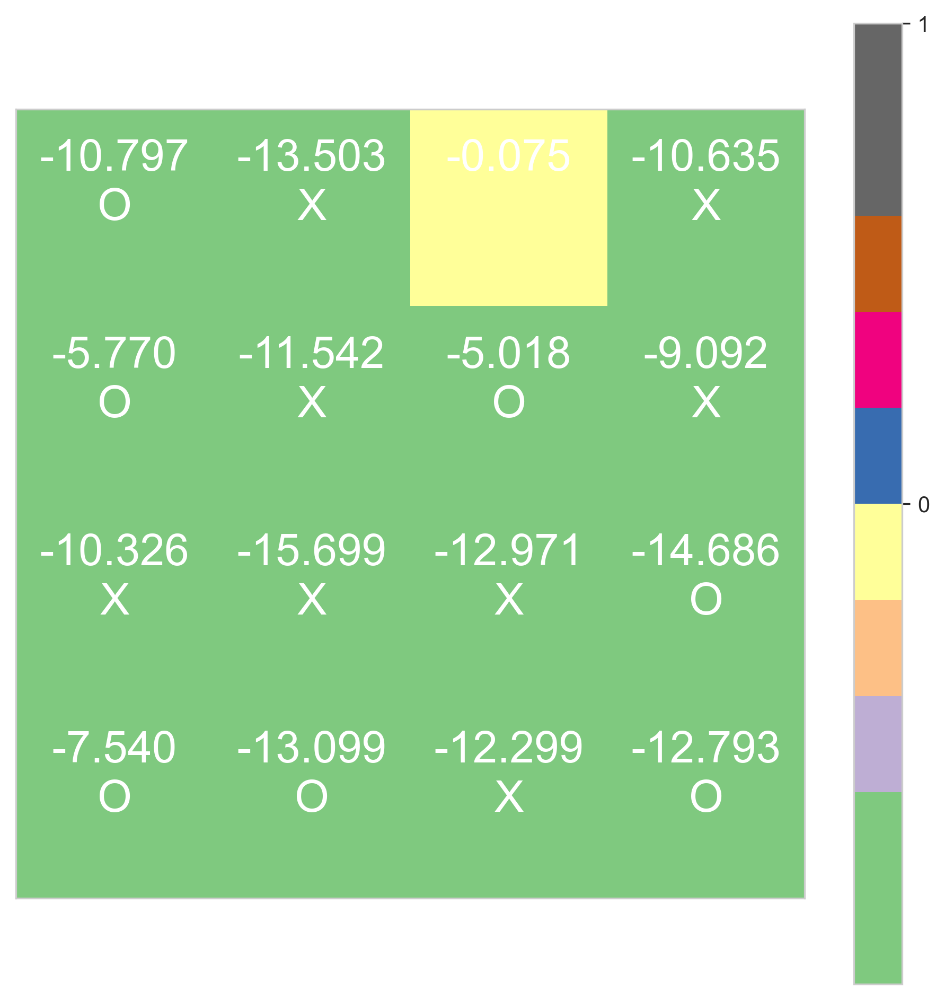

0 (0, 0) -10.796612
1 (0, 1) -13.503256
2 (0, 2) -0.07462861
3 (0, 3) -10.634602
4 (1, 0) -5.7699685
5 (1, 1) -11.541821
6 (1, 2) -5.017717
7 (1, 3) -9.091639
8 (2, 0) -10.325713
9 (2, 1) -15.698569
10 (2, 2) -12.971053
11 (2, 3) -14.686156
12 (3, 0) -7.539795
13 (3, 1) -13.098881
14 (3, 2) -12.299478
15 (3, 3) -12.793159
time: 15.8 s


In [129]:
plot_test_game(env, x_model, o_model, random_crosses=False, random_naughts=False, verbose=True, fontx=20)

**Вывод:**

Стало намного лучше: 
 - вполне логичные стратегии
 - каждая модель была близка к тому, чтобы победить
 - в итоге свели к ничьей, причем не из-за глупости того, кто мог победить, а из-за действий оппонента!

In [131]:
d_dqn_x_model = x_model
d_dqn_o_model = o_model
d_dqn_coordinator = coordinator

time: 8.81 s


# Часть третья: расширим и углубим поиск
Крестики-нолики -- это, конечно, далеко не го, и обычный альфа-бета поиск с отсечением здесь наверняка может работать идеально вплоть до довольно больших досок. Однако мы всё-таки для этого учебного задания будем реализовывать более практически релевантный метод MCTS -- заодно фактически получится и упражнение на многоруких бандитов.

## Задание 5
Реализуйте rollouts со случайной стратегией и (опционально) rollouts с неслучайной, но простой стратегией (например, основанной на дополнении нескольких паттернов или на Q-функции, которая у вас получилась в первом пункте).

## Задание 6
Реализуйте MCTS-поиск с этими rollouts для крестиков-ноликов на досках разного размера, сравните полученные стратегии между собой и со стратегиями, обученными в первых двух частях.